In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import dates
from datetime import datetime
import scipy.stats as stats
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet
import pprint
# from pprint import pprint

import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore',category=UserWarning)
# import logging
# logging.getLogger('prophet').setLevel(logging.ERROR)
# logging.getLogger('cmdstanpy').setLevel(logging.ERROR)
# import logging

# # Set the logging level to WARNING to suppress debug and info messages
# logging.getLogger('cmdstanpy').setLevel(logging.WARNING)

: 

**Problem Statement**

A retail store that has multiple outlets across the country are facing issues in managing the
inventory - to match the demand with respect to supply. You are a data scientist, who has to
come up with useful insights using the data and make prediction models to forecast the sales for
X number of months/years.

In [ ]:
df = pd.read_csv('sample_data/Walmart.csv')
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [ ]:
print(f'Null Values: {df.isnull().sum().sum()}')
print(f'Duplicate Values: {df.duplicated().sum()}')

Null Values: 0
Duplicate Values: 0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [ ]:
df['Date'] = pd.to_datetime(df['Date'],format='%d-%m-%Y')

In [ ]:
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

In [ ]:
df.describe()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Year,Month,Day
count,6435.000000,6435,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,2011-06-17 00:00:00,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151,2010.965035,6.447552,15.678322
min,1.000000,2010-02-05 00:00:00,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000,2010.000000,1.000000,1.000000
25%,12.000000,2010-10-08 00:00:00,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000,2010.000000,4.000000,8.000000
50%,23.000000,2011-06-17 00:00:00,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000,2011.000000,6.000000,16.000000
75%,34.000000,2012-02-24 00:00:00,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000,2012.000000,9.000000,23.000000
max,45.000000,2012-10-26 00:00:00,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000,2012.000000,12.000000,31.000000
std,12.988182,NaN,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885,0.797019,3.238308,8.755780


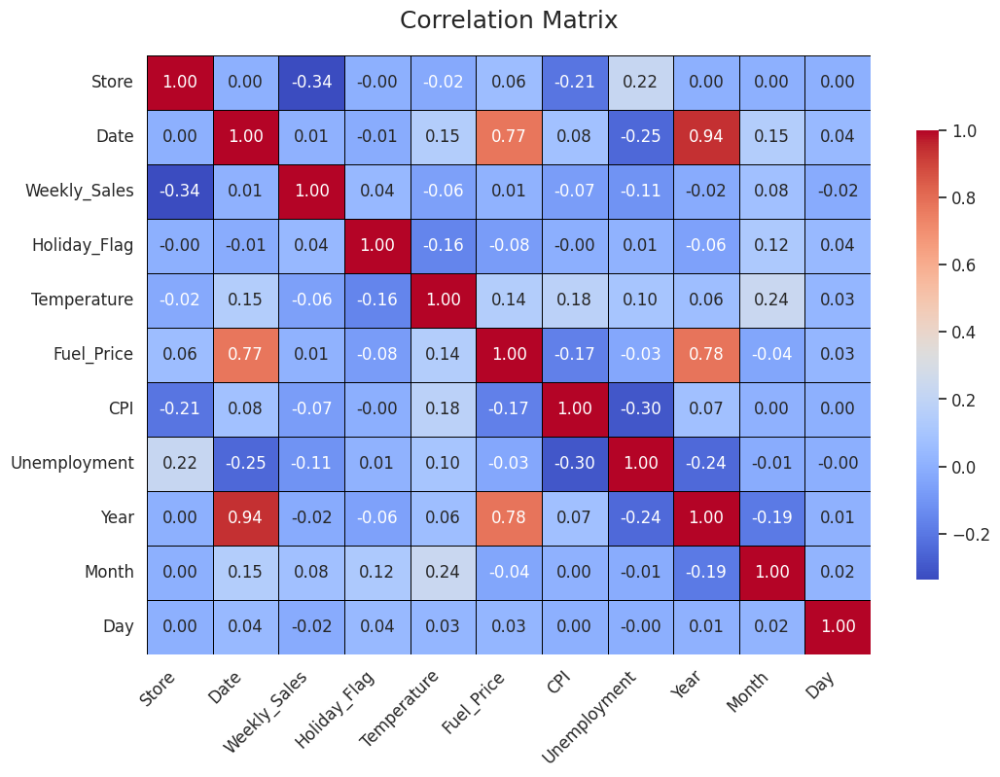

In [ ]:
# Set up the figure size and style
plt.figure(figsize=(12, 8))
sns.set(style="whitegrid")

# Create the heatmap
heatmap = sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, linecolor='black', cbar_kws={'shrink': 0.75})

# Add a title and labels
plt.title('Correlation Matrix', fontsize=18, pad=20)
plt.xticks(fontsize=12, rotation=45, ha='right')
plt.yticks(fontsize=12, rotation=0)

# Adjust the colorbar
cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=12)

# Show the plot
#plt.savefig('heatmap.png', format='png', bbox_inches='tight')
plt.show()


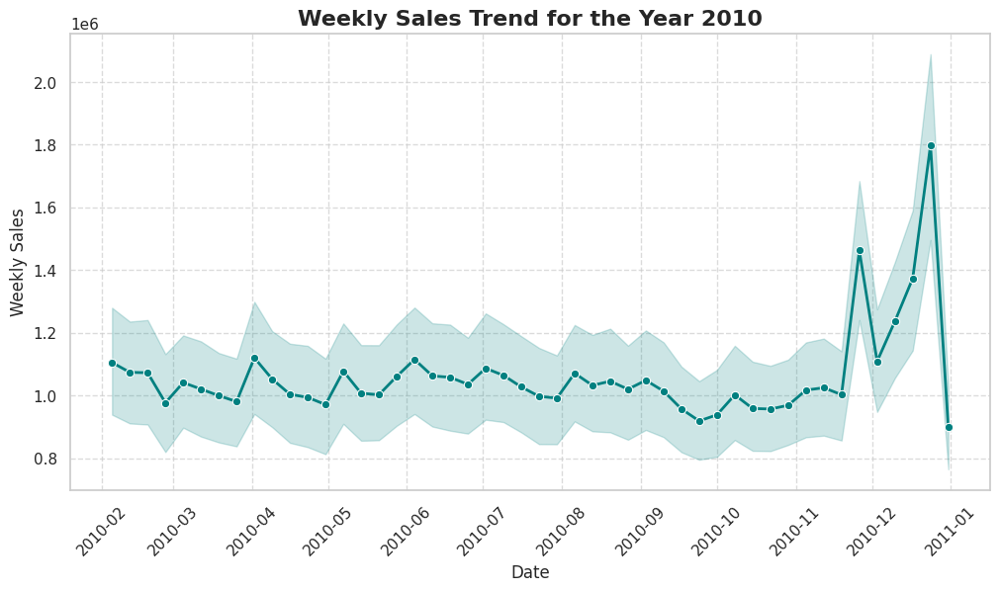

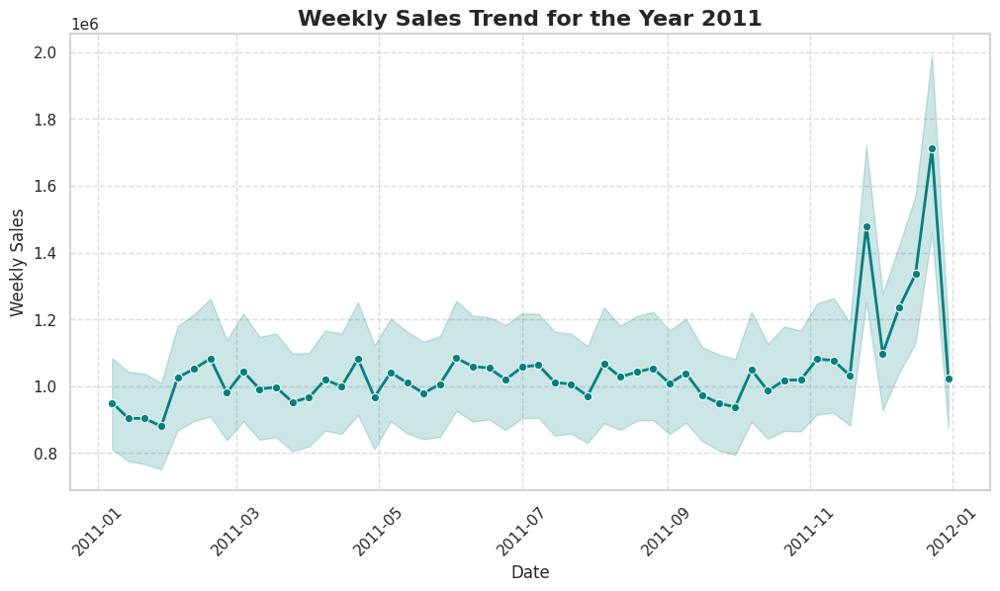

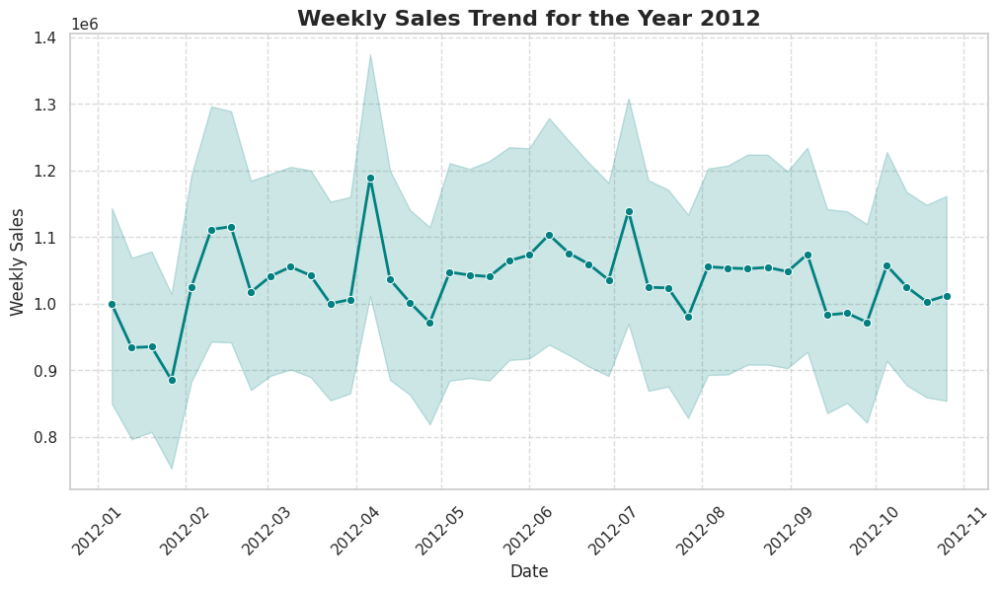

In [ ]:

# Set the Seaborn style for the plots
sns.set(style="whitegrid")

for year in df['Year'].unique():
    plt.figure(figsize=(12, 6))
    sns.lineplot(x='Date', y='Weekly_Sales', data=df[df['Year'] == year],
                 marker='o', color='teal', linewidth=2)

    plt.title(f'Weekly Sales Trend for the Year {year}', fontsize=16, fontweight='bold')

    plt.xticks(rotation=45)# Rotate x-axis labels for better readability
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Weekly Sales', fontsize=12)

    plt.grid(True, linestyle='--', alpha=0.7)    # Add gridlines for better readability
    #plt.savefig(f'weekly_sales_{year}.png', format='png', bbox_inches='tight')
    plt.show()


Assigning a specific color for the stores have the lowest and highest sales


In [ ]:
total_sales_for_each_store = df.groupby('Store')['Weekly_Sales'].sum().sort_values()
total_sales_for_each_store_array = np.array(total_sales_for_each_store) # convert to array


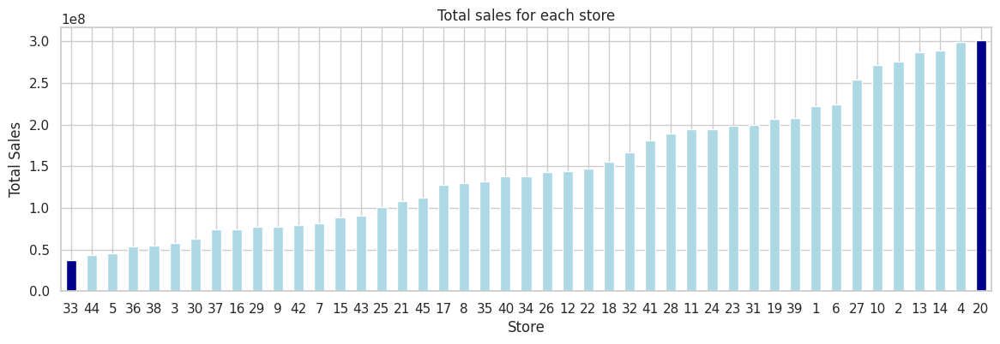

In [ ]:

clrs = ['lightblue' if ((x < max(total_sales_for_each_store_array)) and (x > min(total_sales_for_each_store_array))) else 'darkblue' for x in total_sales_for_each_store_array]
plt.figure(figsize=(14,4))
ax = total_sales_for_each_store.plot(kind='bar',color=clrs);
plt.xticks(rotation=0)
plt.title('Total sales for each store')
plt.xlabel('Store')
plt.ylabel('Total Sales')
#plt.savefig('total_sales_for_each_store.png', format='png', bbox_inches='tight')
plt.show()


*Store 33 has minimal sales and Store 20 has maximal sales*

The store has maximum standard deviation is 14 with 317570 


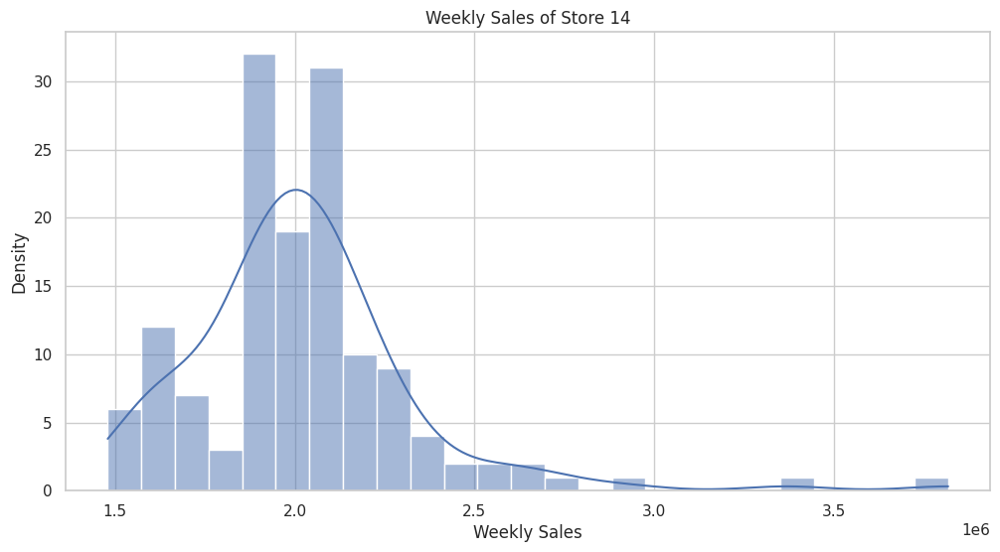

In [ ]:
data_std = pd.DataFrame(df.groupby('Store')['Weekly_Sales'].std().sort_values(ascending=False))
print("The store has maximum standard deviation is "+str(data_std.head(1).index[0])+" with {0:.0f} ".format(data_std.head(1).Weekly_Sales[data_std.head(1).index[0]]))

plt.figure(figsize=(12,6))
sns.histplot(df[df['Store']==data_std.head(1).index[0]]['Weekly_Sales'],kde=True)
plt.ylabel('Density')
plt.xlabel('Weekly Sales')
plt.title('Weekly Sales of Store '+str(data_std.head(1).index[0]))
plt.show()

*The store has maximum standard deviation is 14 with 317570*


# Coefficient of mean to standard deviation
The coefficient of mean to variance can provide insights into the underlying process generating the data.

**Choosing Right Model:** Understanding the mean-to-variance relationship helps in selecting appropriate statistical models. For example, if the variance increases with the mean, models like generalized linear models with a variance function may be suitable

**Homogenity:** If the coefficient is stable across different subsets of the data, it indicates homogenity in the data. If it varies, the data might have different underlying processes or groups that need to be modeled seperately

In [ ]:

coef_mean_std = pd.DataFrame(df.groupby('Store')['Weekly_Sales'].std() / df.groupby('Store')['Weekly_Sales'].mean())
coef_mean_std = coef_mean_std.rename(columns={'Weekly_Sales':'Coefficient of mean to standard deviation'})
coef_mean_std.head()


,Coefficient of mean to standard deviation
Store,
1,0.100292
2,0.123424
3,0.115021
4,0.127083
5,0.118668


# Distribution of store has maximum coefficient of mean to standard deviation


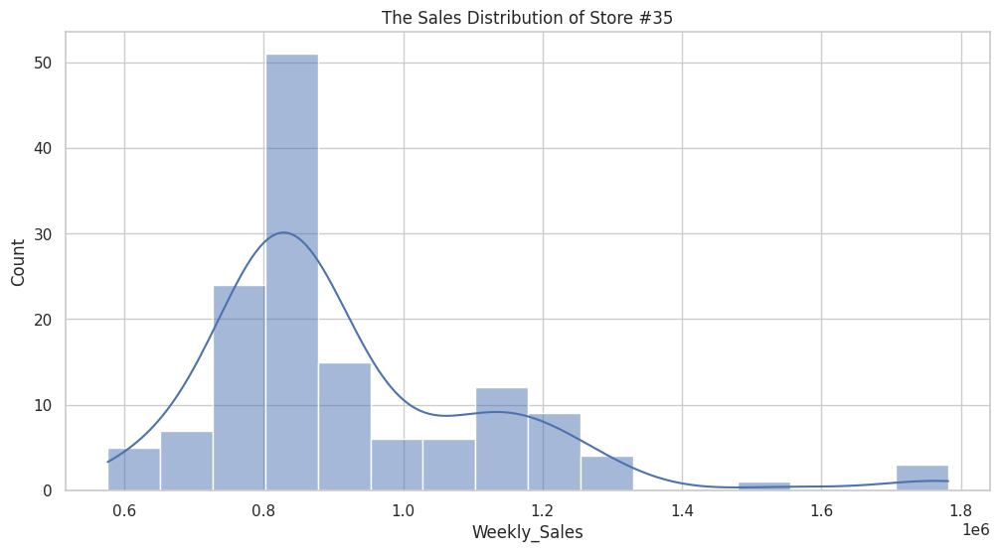

In [ ]:
coef_mean_std_max = coef_mean_std.sort_values(by='Coefficient of mean to standard deviation')
plt.figure(figsize=(12,6))
sns.histplot(df[df['Store'] == coef_mean_std_max.tail(1).index[0]]['Weekly_Sales'],kde=True)
plt.title('The Sales Distribution of Store #'+str(coef_mean_std_max.tail(1).index[0]));

#Quaterly Growth Rate(2011)


In [ ]:
Q4 = df[(df['Date']>='2011-10-01') & (df['Date']<='2011-12-31')].groupby('Store')['Weekly_Sales'].sum()
Q3 = df[(df['Date']>='2011-07-01') & (df['Date']<='2011-09-30')].groupby('Store')['Weekly_Sales'].sum()
Q2 = df[(df['Date']>='2011-04-01') & (df['Date']<='2011-06-30')].groupby('Store')['Weekly_Sales'].sum()
Q1 = df[(df['Date']>='2011-01-01') & (df['Date']<='2011-03-31')].groupby('Store')['Weekly_Sales'].sum()

In [ ]:

growth_rate_3 = (Q4 - Q3) / Q3 * 100
growth_rate_2 = (Q3 - Q2) / Q2 * 100
growth_rate_1 = (Q2 - Q1) / Q1 * 100


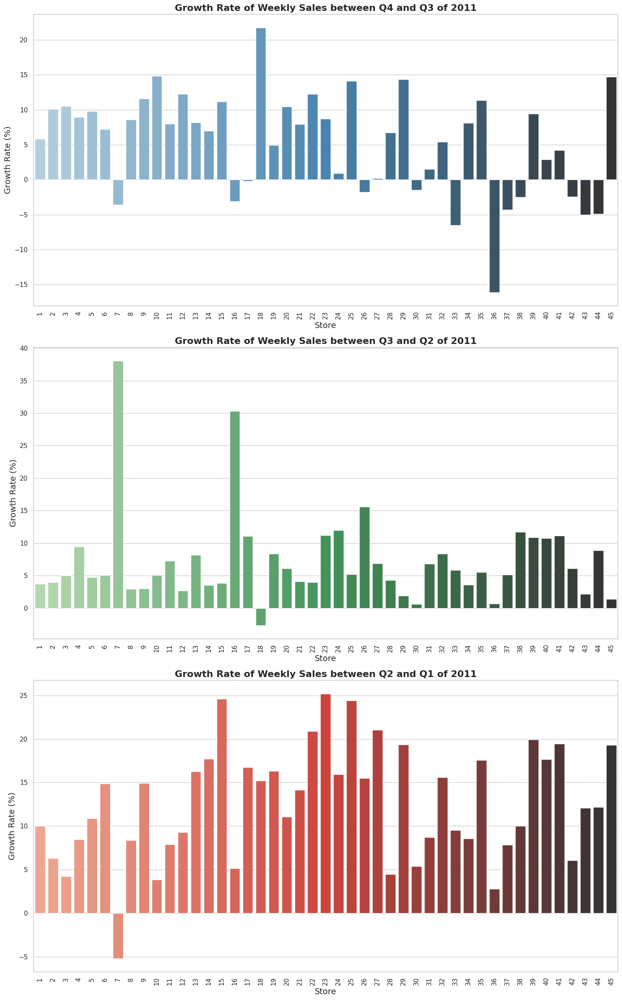

In [ ]:


# Create a figure with 3 subplots (one for each growth rate)
fig, axes = plt.subplots(3, 1, figsize=(15, 24))

# Plot Growth Rate between Q4 and Q3
sns.barplot(ax=axes[0], x=growth_rate_3.index, y=growth_rate_3.values, hue=growth_rate_3.index,
            palette="Blues_d", dodge=False)
axes[0].legend_.remove()  # Remove the legend
axes[0].set_title('Growth Rate of Weekly Sales between Q4 and Q3 of 2011', fontsize=16, fontweight='bold')
axes[0].set_xlabel('Store', fontsize=14)
axes[0].set_ylabel('Growth Rate (%)', fontsize=14)
axes[0].tick_params(axis='x', rotation=90)

# Plot Growth Rate between Q3 and Q2
sns.barplot(ax=axes[1], x=growth_rate_2.index, y=growth_rate_2.values, hue=growth_rate_2.index,
            palette="Greens_d", dodge=False)
axes[1].legend_.remove()  # Remove the legend
axes[1].set_title('Growth Rate of Weekly Sales between Q3 and Q2 of 2011', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Store', fontsize=14)
axes[1].set_ylabel('Growth Rate (%)', fontsize=14)
axes[1].tick_params(axis='x', rotation=90)

# Plot Growth Rate between Q2 and Q1
sns.barplot(ax=axes[2], x=growth_rate_1.index, y=growth_rate_1.values, hue=growth_rate_1.index,
            palette="Reds_d", dodge=False)
axes[2].legend_.remove()  # Remove the legend
axes[2].set_title('Growth Rate of Weekly Sales between Q2 and Q1 of 2011', fontsize=16, fontweight='bold')
axes[2].set_xlabel('Store', fontsize=14)
axes[2].set_ylabel('Growth Rate (%)', fontsize=14)
axes[2].tick_params(axis='x', rotation=90)

# Adjust layout to prevent overlap
plt.tight_layout()
#plt.savefig('growth_rates.png', format='png', bbox_inches='tight')

# Display the plot
plt.show()


Each chart focuses on a comparison between two quarters: Q4 vs. Q3, Q3 vs. Q2, and Q2 vs. Q1

**1. Growth Rate of Weekly Sales between Q4 and Q3 of 2011 (Top Chart)**

*   **Positive Growth:** Most stores exhibit a positive growth rate, with Store 19 showing the highest growth at over 20%. Other notable stores with significant growth include Store 23, Store 25, and Store 27.
*   **Negative Growth:** Some stores experienced a decline in sales, with Store 36 showing the most significant decrease, dropping by more than 10%. Other stores like Store 16 and Store 33 also saw negative growth.
*   **Stable Stores:** Several stores, such as Store 1 and Store 2, show minimal growth or decline, indicating stable sales between Q4 and Q3.


**2. Growth Rate of Weekly Sales between Q3 and Q2 of 2011 (Middle Chart)**


*   **High Positive Growth:** Store 8 and Store 18
exhibit very high growth rates, exceeding 30%. This is a significant increase compared to the rest of the stores.
*   **Moderate Growth:** A good number of stores show moderate growth, ranging from 5% to 15%. This includes Store 4, Store 16, Store 23, and Store 35.
*   **Negative Growth:** A few stores, such as Store 9 and Store 32, show a slight decline in sales, although the decrease is not as severe as seen in other quarters.

**3. Growth Rate of Weekly Sales between Q2 and Q1 of 2011 (Bottom Chart)**

*   **Consistent Positive Growth:** Most stores show positive growth, with Stores 21, 22, and 23 showing the highest growth rates, exceeding 20%. This suggests strong sales performance in these stores.
*   **Negative Growth:** Only Store 7 shows a significant negative growth rate, declining by over 5%. This is an outlier compared to the general positive trend.
*   **Variation in Growth:** The growth rates vary widely across stores, with some showing minimal growth while others, like Store 21, show substantial increases.

**Overall Trends**

*   **Quarterly Trends:** There is a general trend of positive growth from Q1 to Q4, with the magnitude of growth varying across different stores. Some stores consistently perform well across multiple quarters, while others show fluctuations.
*   **Outliers:** Certain stores like Store 19 (in Q4 vs. Q3) and Store 8 (in Q3 vs. Q2) stand out as significant positive outliers, while Store 36 (in Q4 vs. Q3) and Store 7 (in Q2 vs. Q1) are notable for their negative growth.
*   **Performance Variability:** The variability in performance across stores suggests that different factors may be influencing sales growth, such as local market conditions, store management, or promotional activities.






#**Impact of Holidays** on Sales, considering two holidays thanksgiving and Christmas

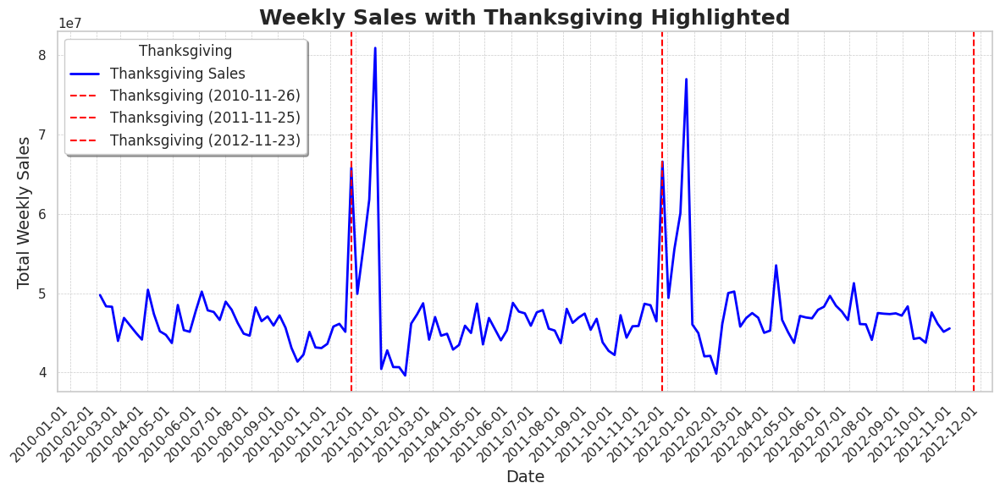

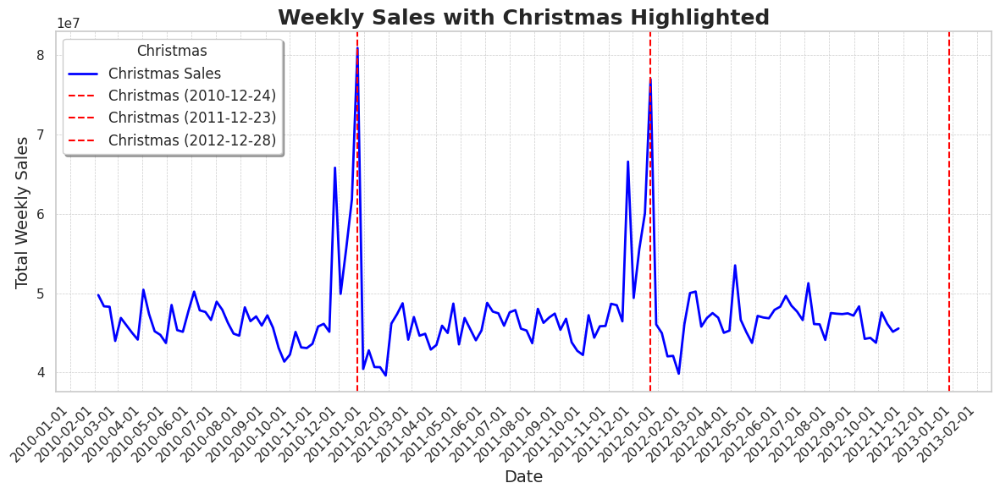

In [ ]:

def plot_line(df, holiday_dates, holiday_label):
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plotting the line for weekly sales
    ax.plot(df['Date'], df['Weekly_Sales'], label=f'{holiday_label} Sales', color='blue', linewidth=2)

    # Adding vertical lines for holiday dates
    for date in holiday_dates:
        day = datetime.strptime(date, '%d-%m-%Y')
        plt.axvline(x=day, color='red', linestyle='--', linewidth=1.5, label=f'{holiday_label} ({day.strftime("%Y-%m-%d")})')

    # Enhancing plot aesthetics
    plt.title(f'Weekly Sales with {holiday_label} Highlighted', fontsize=18, fontweight='bold')
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Total Weekly Sales', fontsize=14)

    # Formatting the x-axis
    x_dates = df['Date'].dt.strftime('%Y-%m-%d').sort_values().unique()
    xfmt = dates.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_formatter(xfmt)
    ax.xaxis.set_major_locator(dates.MonthLocator())  # Change to MonthLocator for better spacing
    plt.gcf().autofmt_xdate(rotation=45)

    # Adding grid and legend
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.legend(loc='upper left', fontsize=12, frameon=True, shadow=True, title=holiday_label)

    # Tight layout for better spacing
    plt.tight_layout()

    # Display the plot
    plt.show()

# Preparing data and calling the function
total_sales = df.groupby('Date')['Weekly_Sales'].sum().reset_index()
Thanksgiving = ['26-11-2010', '25-11-2011', '23-11-2012']
Christmas = ['24-12-2010', '23-12-2011', '28-12-2012']

plot_line(total_sales, Thanksgiving, 'Thanksgiving')
plot_line(total_sales, Christmas, 'Christmas')
#plt.savefig('holiday_sales.png', format='png', bbox_inches='tight')

*Sales increase during both Holidays significantly*

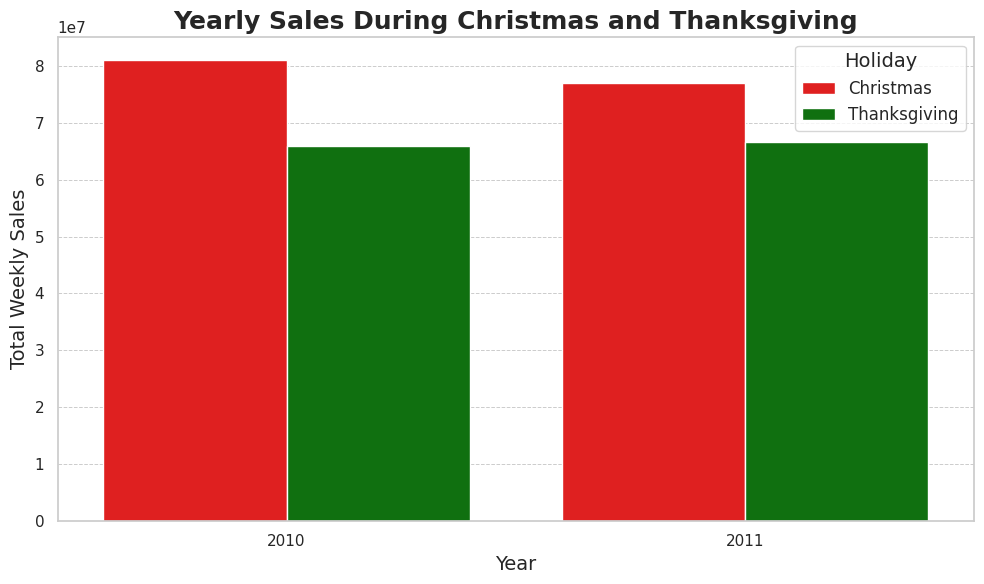

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Prepare data for Christmas and Thanksgiving
Christmas_df = pd.DataFrame(df.loc[df.Date.isin(Christmas)].groupby('Year')['Weekly_Sales'].sum(), columns=['Weekly_Sales'])
Christmas_df['Holiday'] = 'Christmas'

Thanksgiving_df = pd.DataFrame(df.loc[df.Date.isin(Thanksgiving)].groupby('Year')['Weekly_Sales'].sum(), columns=['Weekly_Sales'])
Thanksgiving_df['Holiday'] = 'Thanksgiving'

# Combine both into one DataFrame
holiday_sales_df = pd.concat([Christmas_df, Thanksgiving_df]).reset_index()

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(data=holiday_sales_df, x='Year', y='Weekly_Sales', hue='Holiday', palette=['red', 'green'])

# Add title and labels
plt.title('Yearly Sales During Christmas and Thanksgiving', fontsize=18, fontweight='bold')
plt.xlabel('Year', fontsize=14)
plt.ylabel('Total Weekly Sales', fontsize=14)

# Add legend and grid
plt.legend(title='Holiday', fontsize=12, title_fontsize=14)
plt.grid(axis='y', linestyle='--', linewidth=0.7)

# Adjust layout
plt.tight_layout()
# plt.savefig('holiday_sales_2.png', format='png', bbox_inches='tight')
# Display the plot
plt.show()


#**Trends and Seasonility of Weekly sales**

Seasonal Decomposition:

**sm.tsa.seasonal_decompose:** This function from the statsmodels library performs seasonal decomposition of time series data. It breaks down the time series into three components: trend, seasonality, and residuals (noise).

**model='additive':** This specifies that the time series is to be decomposed using an additive model, meaning the time series is assumed to be a sum of the components:

**Observed = Trend + Seasonality + Residual**. An additive model is typically used when the magnitude of seasonal fluctuations or the trend does not vary with the level of the time series.

**Purpose:**Useful for understanding and interpreting the underlying patterns in your time series data. By separating the data into these components, you can better understand how sales are affected by long-term trends, seasonal effects, and random variations. This can also help in making more accurate forecasts or understanding the factors driving sales over time.

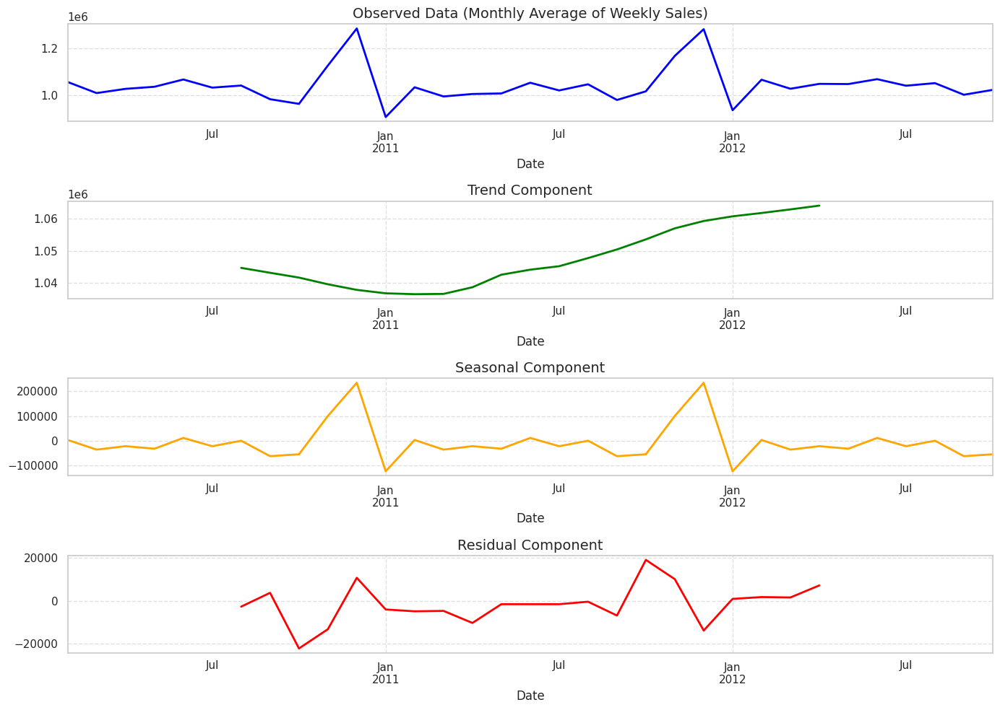

In [ ]:
# Set the Date as the index
data = df.set_index('Date')

# Perform seasonal decomposition
decomposition = sm.tsa.seasonal_decompose(data['Weekly_Sales'].resample('MS').mean(), model='additive')

# Create a figure and set the size
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(14, 10))

# Plot each component with enhanced aesthetics
decomposition.observed.plot(ax=ax1, color='blue', linewidth=2)
ax1.set_title('Observed Data (Monthly Average of Weekly Sales)', fontsize=14)
ax1.grid(True, linestyle='--', alpha=0.6)

decomposition.trend.plot(ax=ax2, color='green', linewidth=2)
ax2.set_title('Trend Component', fontsize=14)
ax2.grid(True, linestyle='--', alpha=0.6)

decomposition.seasonal.plot(ax=ax3, color='orange', linewidth=2)
ax3.set_title('Seasonal Component', fontsize=14)
ax3.grid(True, linestyle='--', alpha=0.6)

decomposition.resid.plot(ax=ax4, color='red', linewidth=2)
ax4.set_title('Residual Component', fontsize=14)
ax4.grid(True, linestyle='--', alpha=0.6)

# Adjust layout for better spacing
plt.tight_layout()
# plt.savefig('seasonal_decomposition.png', format='png', bbox_inches='tight')
# Display the plot
plt.show()


**Output Explanation:**
The output consists of four subplots:



1.   **Observed:**This is the original time series data, showing the monthly average of weekly sales. It represents the actual data points you provided.
2.   **Trend:**This component shows the underlying trend in the data, which is a long-term direction in the time series (e.g., an overall increase or decrease in sales over time).
3.   **Seasonal:**This component captures the repeating seasonal patterns in the data. For example, if sales tend to increase around the same months each year, this would be reflected in the seasonal component.
4.   **Residual(Noise):**This is the remainder of the time series after the trend and seasonal components have been removed. It represents the random fluctuations in the data that cannot be explained by the trend or seasonal patterns.




In [ ]:
# data = df.set_index('Date')
# sm.tsa.seasonal_decompose(data['Weekly_Sales'].resample('MS').mean(), model='additive').plot()
# plt.show()

#**Outliers**

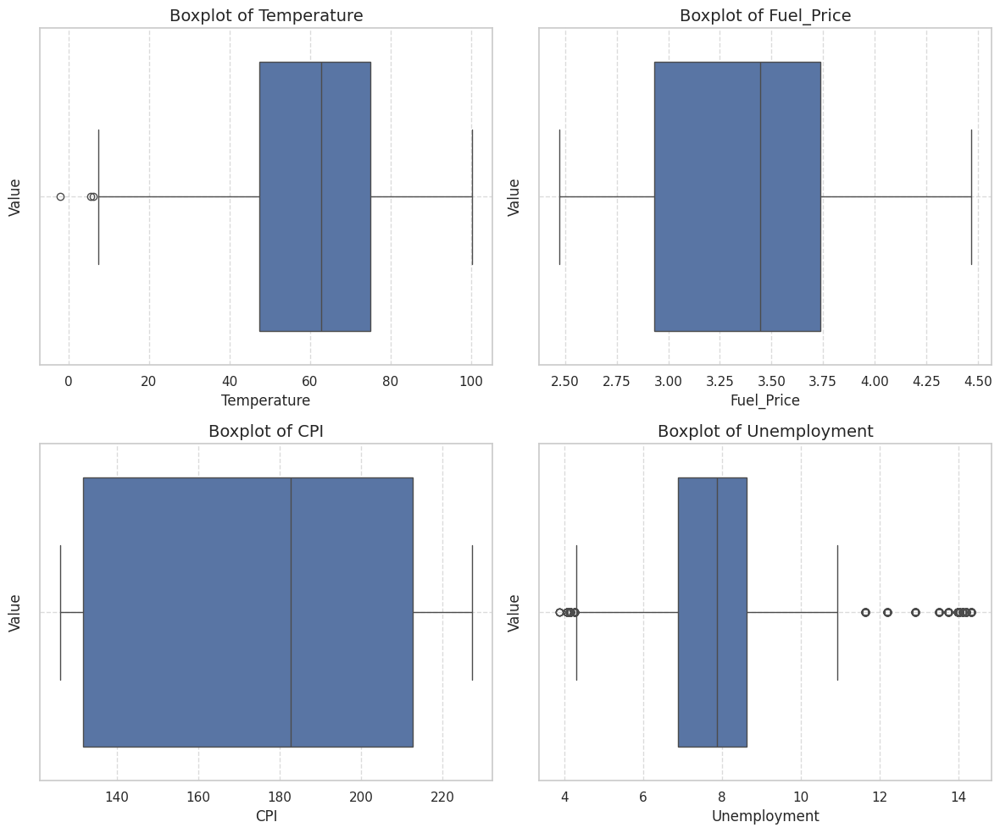

In [ ]:
cat_cols = ['Temperature', 'Fuel_Price', 'CPI', 'Unemployment']

# Create a 2x2 grid for the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through the columns and plot each one on the corresponding subplot
for i, col in enumerate(cat_cols):
    sns.boxplot(data=df, x=col, ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}', fontsize=14)
    axes[i].set_xlabel(col, fontsize=12)
    axes[i].set_ylabel('Value', fontsize=12)
    axes[i].grid(True, linestyle='--', alpha=0.7)

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
outlier_columns = ['Unemployment','Temperature']
for col in outlier_columns:
  Q3=df[col].quantile(0.75)
  Q1=df[col].quantile(0.25)
  IQR=Q3-Q1
  lower_bound=Q1-1.5*IQR
  upper_bound=Q3+1.5*IQR
  df=df[(df[col]>=lower_bound) & (df[col]<=upper_bound)]

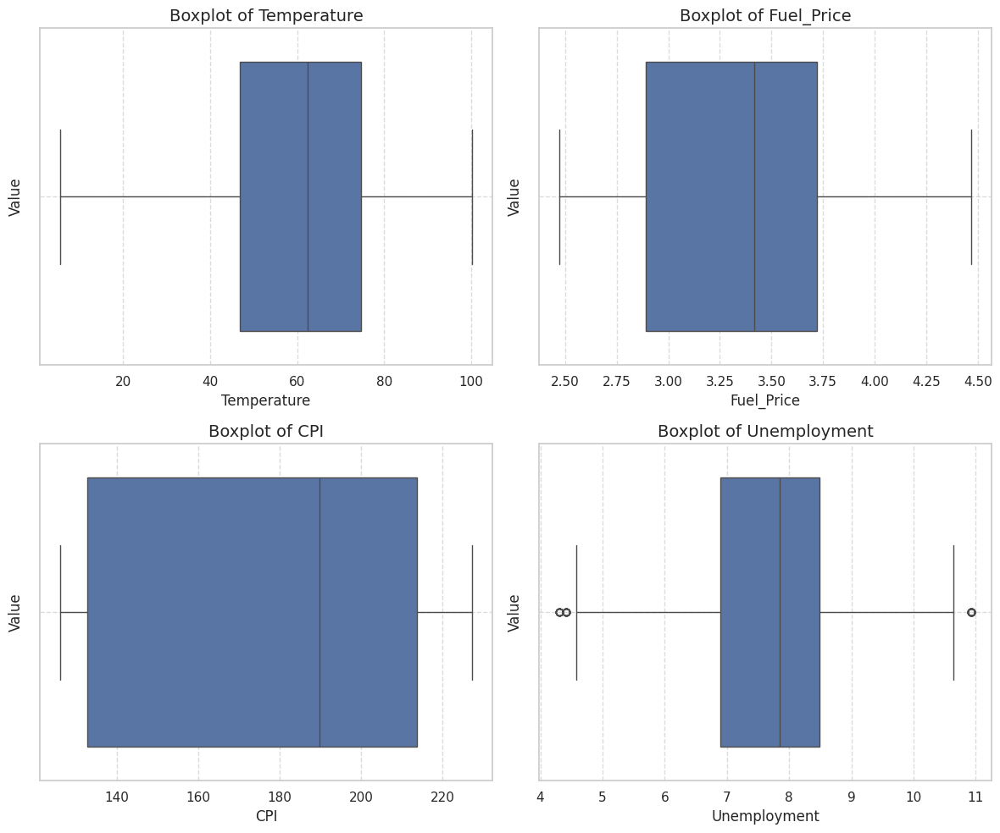

In [ ]:
cat_cols = ['Temperature', 'Fuel_Price', 'CPI', 'Unemployment']

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes = axes.flatten()

for i, col in enumerate(cat_cols):
    sns.boxplot(data=df, x=col, ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}', fontsize=14)
    axes[i].set_xlabel(col, fontsize=12)
    axes[i].set_ylabel('Value', fontsize=12)
    axes[i].grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()

plt.show()


#**Splitting the data** into training and testing

In [ ]:

X = df.drop(columns=['Weekly_Sales','Date'])
Y = df['Weekly_Sales']
x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size=0.20, random_state=50)


#**Linear Regression**

In [ ]:

for i in range(1,6):
  poly = PolynomialFeatures(degree=i)
  x_poly = poly.fit_transform(x_train)
  lr2 = LinearRegression()
  lr2.fit(x_poly,y_train)
  y_pred = lr2.predict(poly.fit_transform(x_test))
  print(f'Degree:{i}')
  print(f'Accuracy:{lr2.score(poly.fit_transform(x_test),y_test)*100}')
  print(f'MAE:{metrics.mean_absolute_error(y_test,y_pred)}')
  print(f'MSE:{metrics.mean_squared_error(y_test,y_pred)}')
  print(f'RMSE:{np.sqrt(metrics.mean_squared_error(y_test,y_pred))}')
  print(f'R2:{metrics.explained_variance_score(y_test,y_pred)}')

# sns.scatterplot(x=y_test,y=y_pred)
# plt.xlabel('Actual')
# plt.ylabel('Predicted')
# plt.show()

Degree:1
Accuracy:15.077986056689408
MAE:438215.69949680904
MSE:273850648795.59534
RMSE:523307.4132817109
R2:0.1512545156143248
Degree:2
Accuracy:30.264480410600836
MAE:394304.2442939601
MSE:224878290055.66364
RMSE:474213.3381250085
R2:0.30275716262018537
Degree:3
Accuracy:45.90852309623421
MAE:338662.1581762306
MSE:174430461038.01285
RMSE:417648.72924266494
R2:0.4591092386357185
Degree:4
Accuracy:68.09019940729183
MAE:247323.6846298738
MSE:102900522367.31659
RMSE:320781.1128594023
R2:0.6809062466511806
Degree:5
Accuracy:-51.462714802368346
MAE:283400.9583061089
MSE:488426507933.02435
RMSE:698875.1733557462
R2:-0.5029862391633919


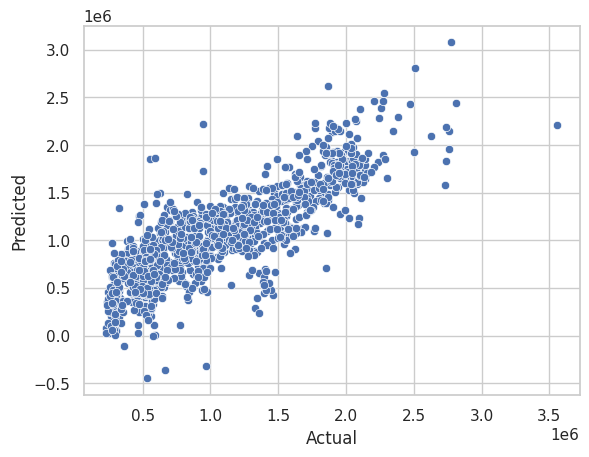

In [ ]:
poly = PolynomialFeatures(degree=4)
x_poly = poly.fit_transform(x_train)
lr2 = LinearRegression()
lr2.fit(x_poly,y_train)
y_pred = lr2.predict(poly.fit_transform(x_test))
sns.scatterplot(x=y_test,y=y_pred)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()

#**RandomForest**

Accuracy:96.6923181322825
MAE:54043.45397069688
MSE:10666384173.231415
RMSE:103278.18827434676
R2:0.9669730073179662


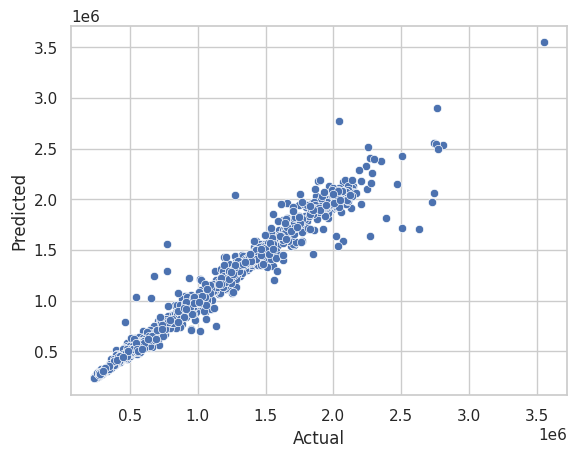

In [ ]:

rf = RandomForestRegressor()
rf.fit(x_train,y_train)
y_pred = rf.predict(x_test)
print(f'Accuracy:{rf.score(x_test,y_test)*100}')
print(f'MAE:{metrics.mean_absolute_error(y_test,y_pred)}')
print(f'MSE:{metrics.mean_squared_error(y_test,y_pred)}')
print(f'RMSE:{np.sqrt(metrics.mean_squared_error(y_test,y_pred))}')
print(f'R2:{metrics.explained_variance_score(y_test,y_pred)}')
sns.scatterplot(x=y_test,y=y_pred)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()

Accuracy:98.30771407854509
MAE:45200.57043398405
MSE:5457166828.938389
RMSE:73872.63924443467
R2:0.9830775638302683


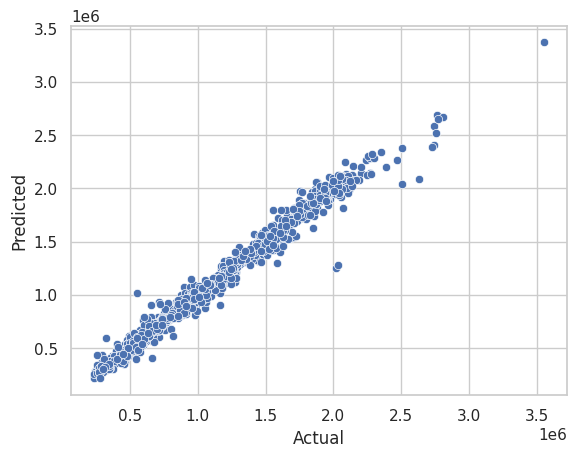

In [ ]:
#from xgboost import XGBRegressor
xgb = XGBRegressor()
xgb.fit(x_train,y_train)
y_pred = xgb.predict(x_test)
print(f'Accuracy:{xgb.score(x_test,y_test)*100}')
print(f'MAE:{metrics.mean_absolute_error(y_test,y_pred)}')
print(f'MSE:{metrics.mean_squared_error(y_test,y_pred)}')
print(f'RMSE:{np.sqrt(metrics.mean_squared_error(y_test,y_pred))}')
print(f'R2:{metrics.explained_variance_score(y_test,y_pred)}')
sns.scatterplot(x=y_test,y=y_pred)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()

#Analysis with respect to particular store

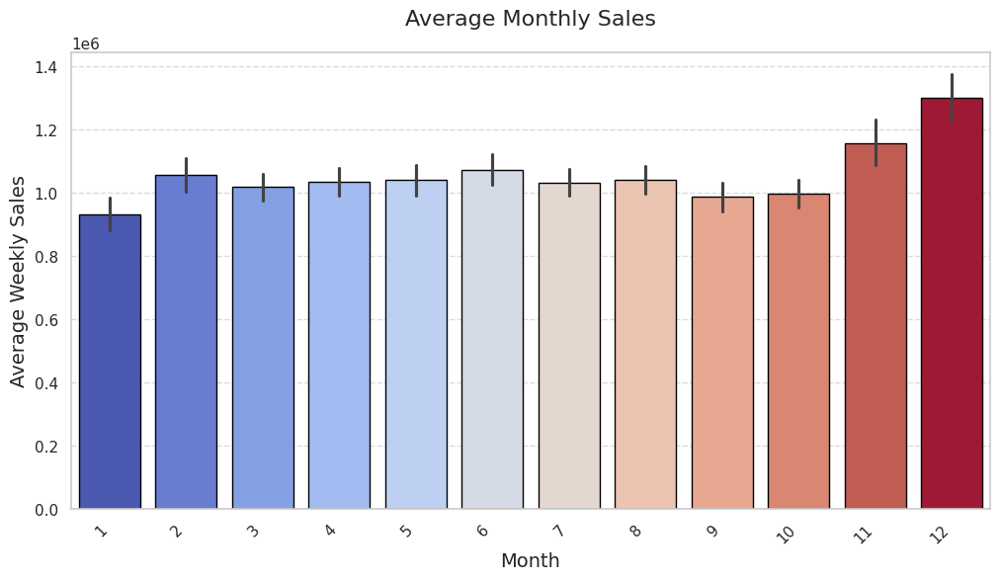

In [ ]:
# Set the figure size for clarity
plt.figure(figsize=(12, 6))

# Create the barplot with the required changes to remove the warning
sns.barplot(x='Month', y='Weekly_Sales', data=df, palette='coolwarm', edgecolor='black', hue='Month', dodge=False, legend=False)

# Add labels with a larger font size for readability
plt.ylabel('Average Weekly Sales', fontsize=14)
plt.xlabel('Month', fontsize=14)

# Add a title with an increased font size and padding for emphasis
plt.title('Average Monthly Sales', fontsize=16, pad=20)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add gridlines for clarity
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
# plt.savefig('average_monthly_sales.png', format='png', bbox_inches='tight')
plt.show()


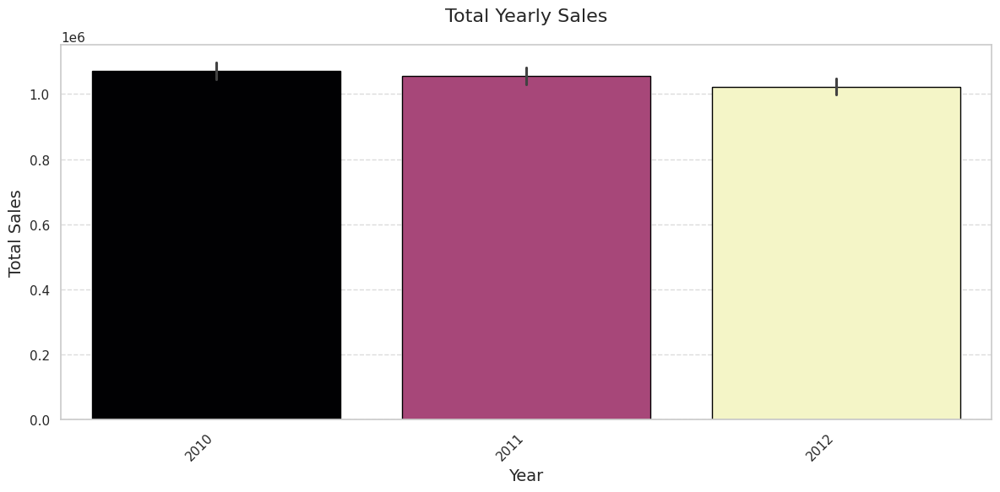

In [ ]:
# Set the figure size for clarity
plt.figure(figsize=(12, 6))

# Create the barplot with enhanced aesthetics
sns.barplot(x='Year', y='Weekly_Sales', data=df, palette='magma', edgecolor='black',hue='Year',dodge=False,legend=False)

# Add labels with a larger font size for readability
plt.ylabel('Total Sales', fontsize=14)
plt.xlabel('Year', fontsize=14)

# Add a title with an increased font size and padding for emphasis
plt.title('Total Yearly Sales', fontsize=16, pad=20)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add gridlines for clarity
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot with tight layout to prevent clipping
plt.tight_layout()
# lt.savefig('total_yearly_sales.png', format='png', bbox_inches='tight')
plt.show()


In [ ]:
store_data = df.groupby(['Store'])['Weekly_Sales'].agg(['count','max','sum']).reset_index()
store_data.head()

,Store,count,max,sum
0,1,143,2387950.20,2.224028e+08
1,2,143,3436007.68,2.753824e+08
2,3,143,605990.41,5.758674e+07
3,4,126,3676388.98,2.631574e+08
4,5,143,507900.07,4.547569e+07


In [ ]:
store_data.sort_values(by='sum',ascending=False,inplace=True)
store_data.head()

,Store,count,max,sum
19,20,143,3766687.43,3.013978e+08
13,14,143,3818686.45,2.889999e+08
12,13,143,3595903.20,2.865177e+08
1,2,143,3436007.68,2.753824e+08
9,10,143,3749057.69,2.716177e+08


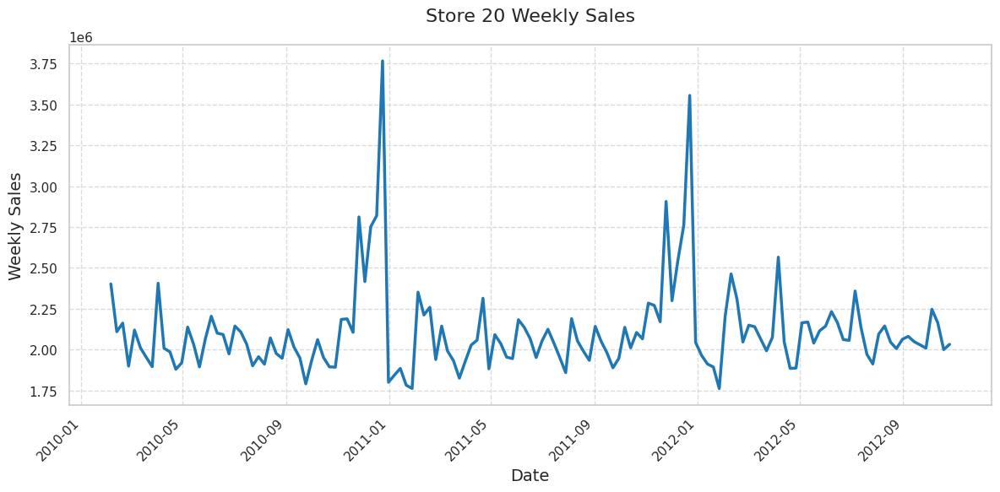

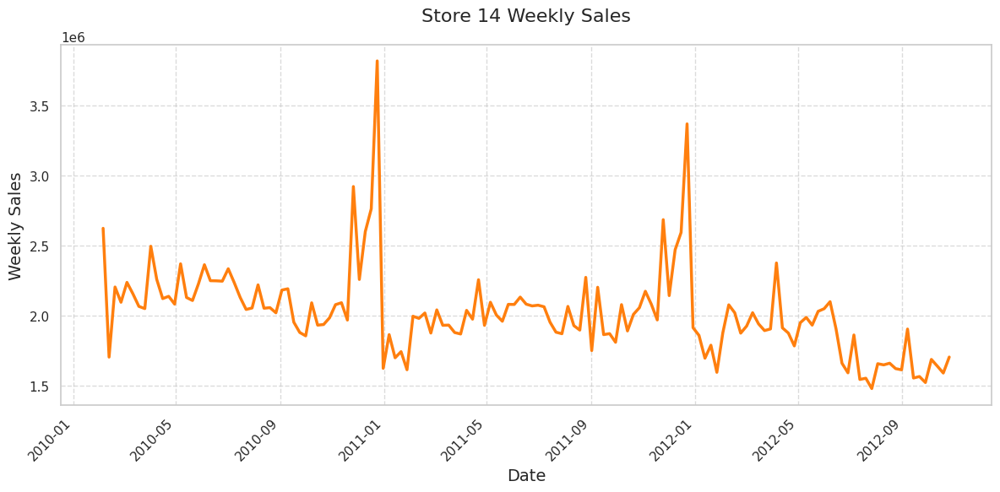

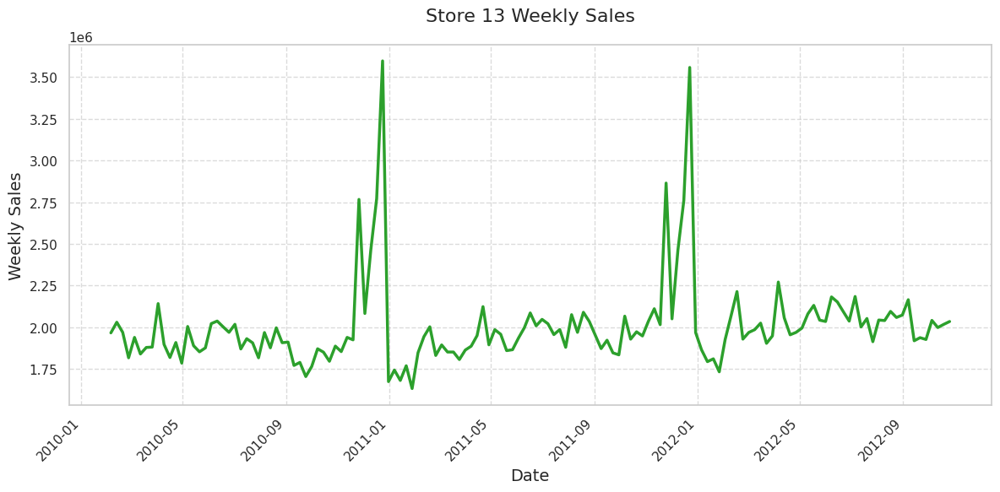

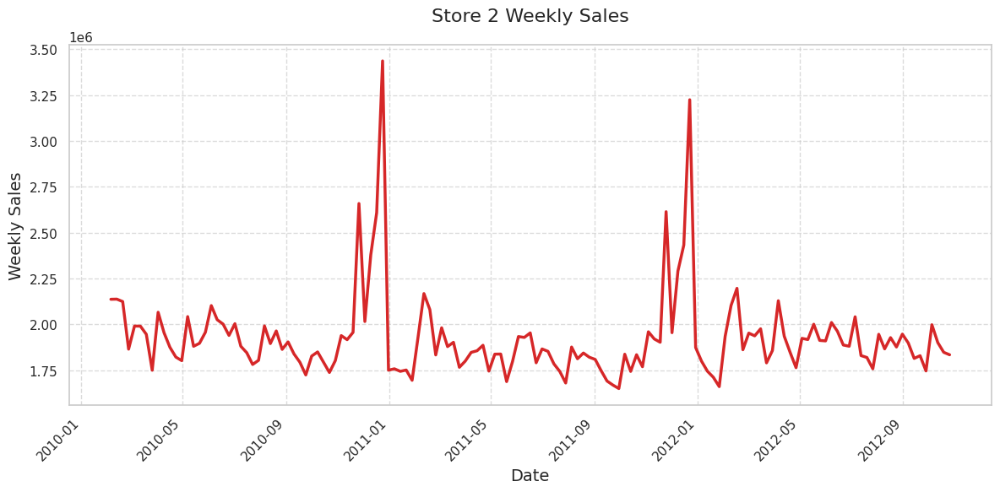

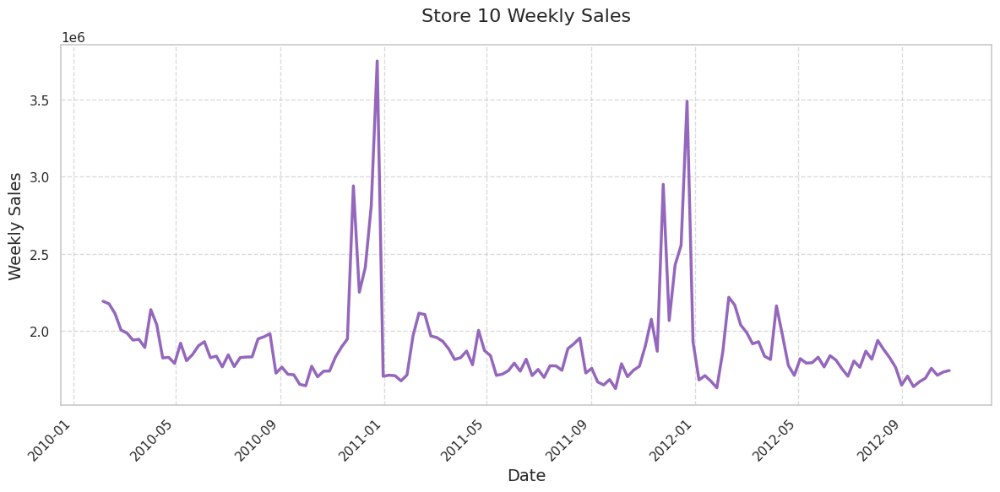

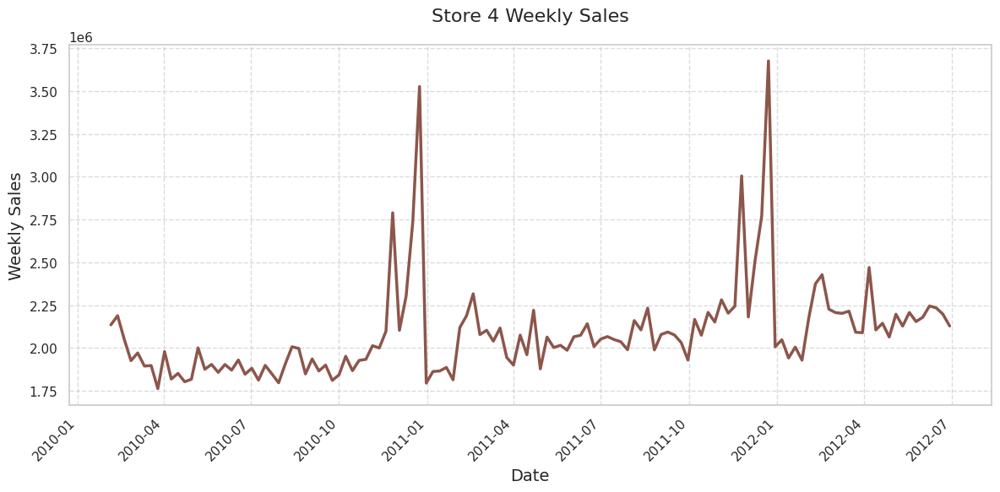

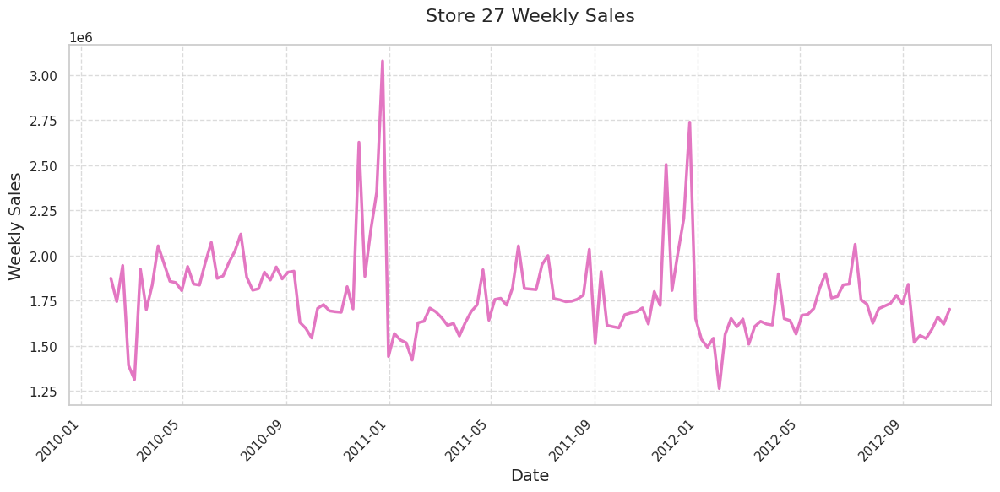

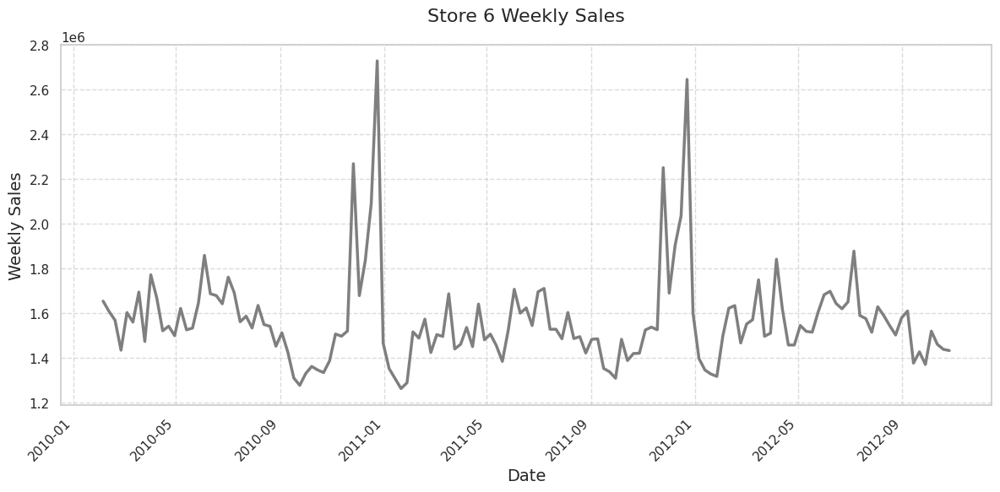

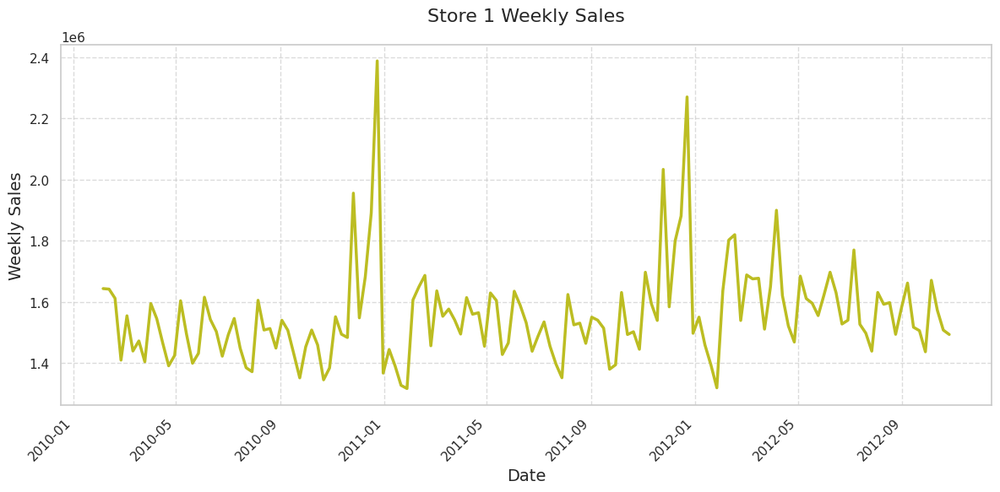

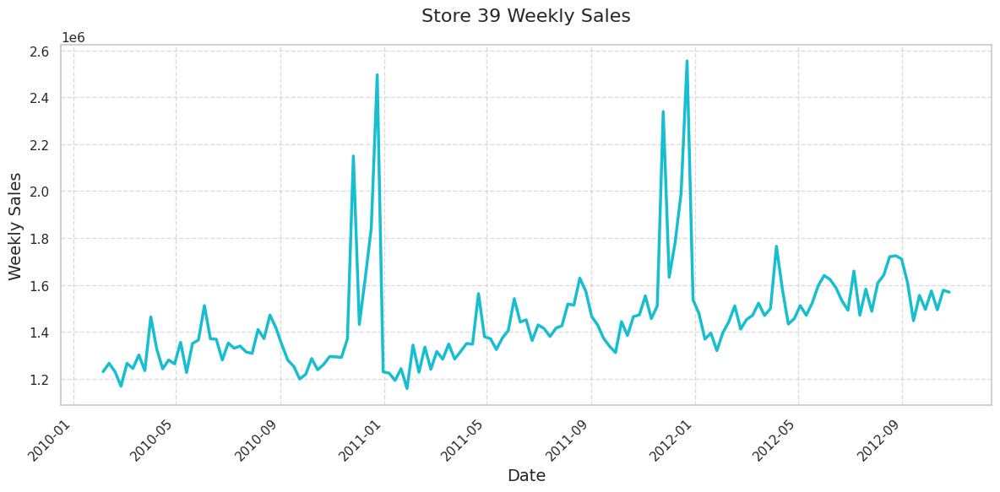

In [ ]:
first_10_stores = store_data.head(10)

# Set a consistent color palette for the plots
colors = sns.color_palette('tab10', n_colors=10)

# Loop through the first 5 stores to create individual plots
for i, store in enumerate(first_10_stores['Store']):
    plt.figure(figsize=(12, 6))

    # Create a line plot for each store with enhanced aesthetics
    sns.lineplot(x='Date', y='Weekly_Sales', data=df[df['Store'] == store], color=colors[i], linewidth=2.5)

    # Add title and labels with larger fonts for clarity
    plt.title(f'Store {store} Weekly Sales', fontsize=16, pad=20)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Weekly Sales', fontsize=14)

    # Format the x-axis for better readability
    plt.xticks(rotation=45, ha='right')

    # Add gridlines for easier comparison
    plt.grid(True, linestyle='--', alpha=0.7)

    # Tight layout to avoid clipping
    plt.tight_layout()

    # Display the plot
    plt.show()


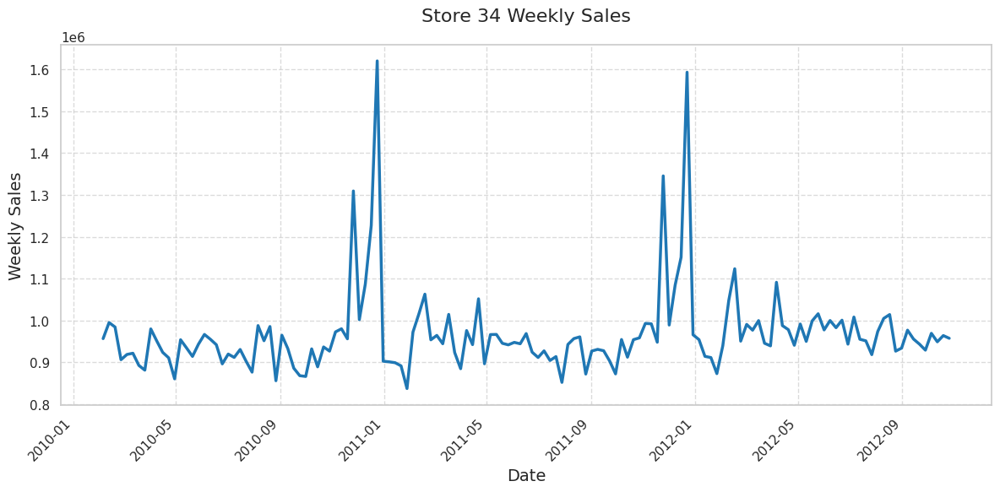

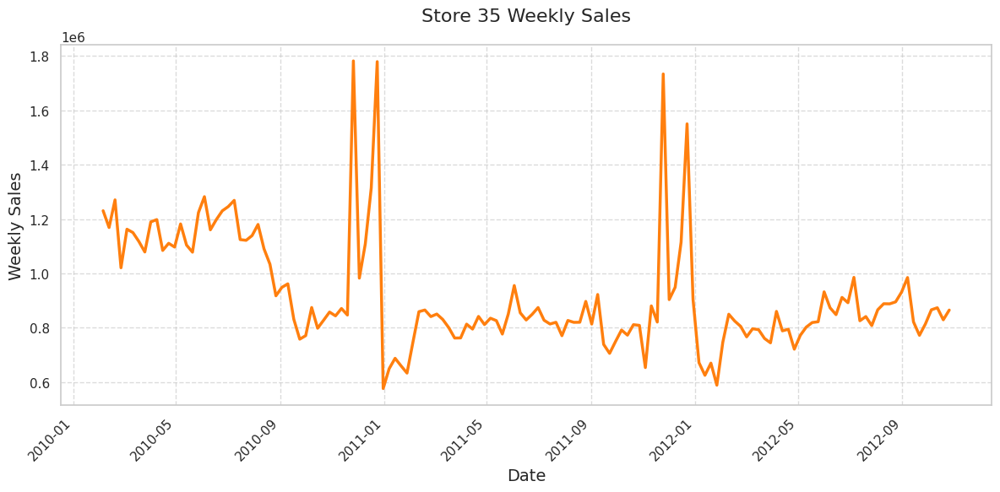

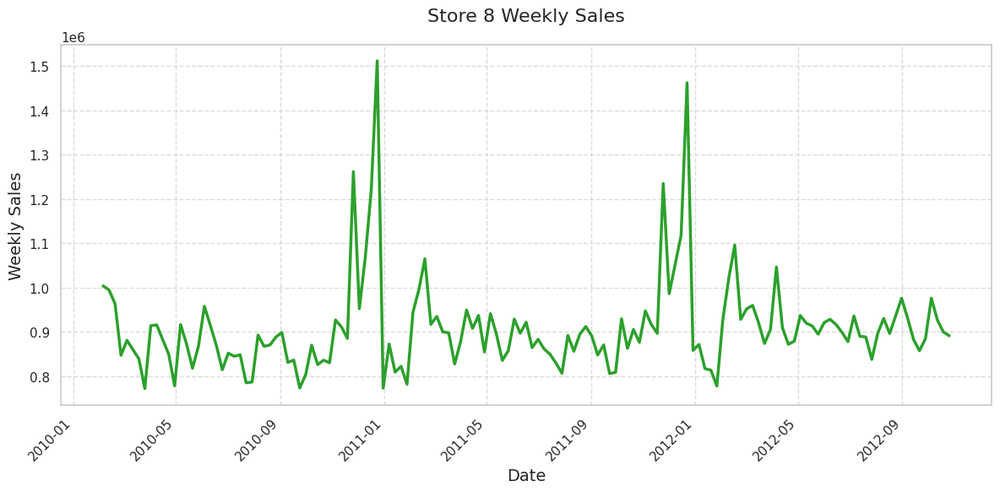

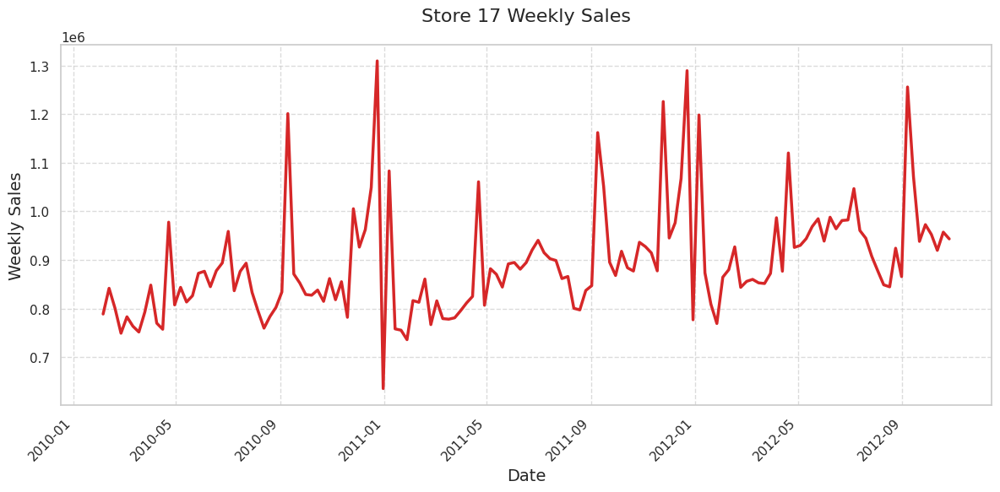

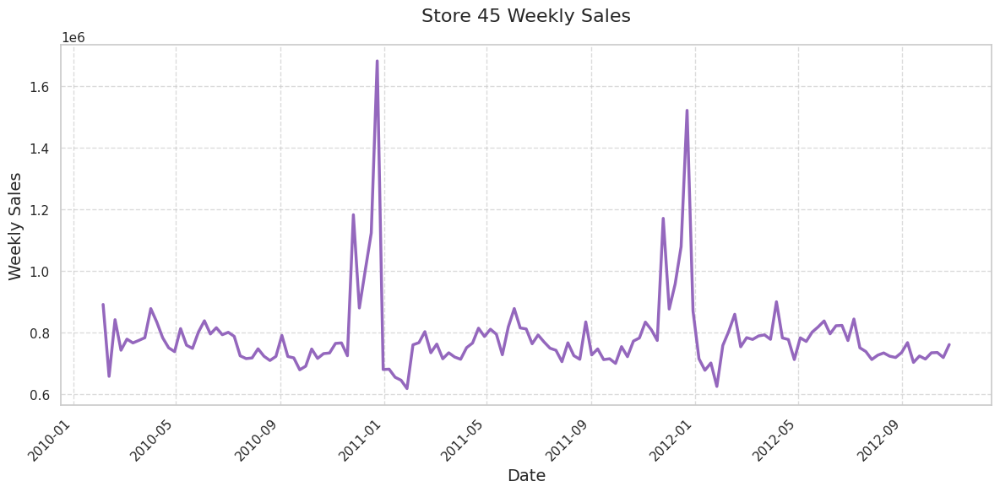

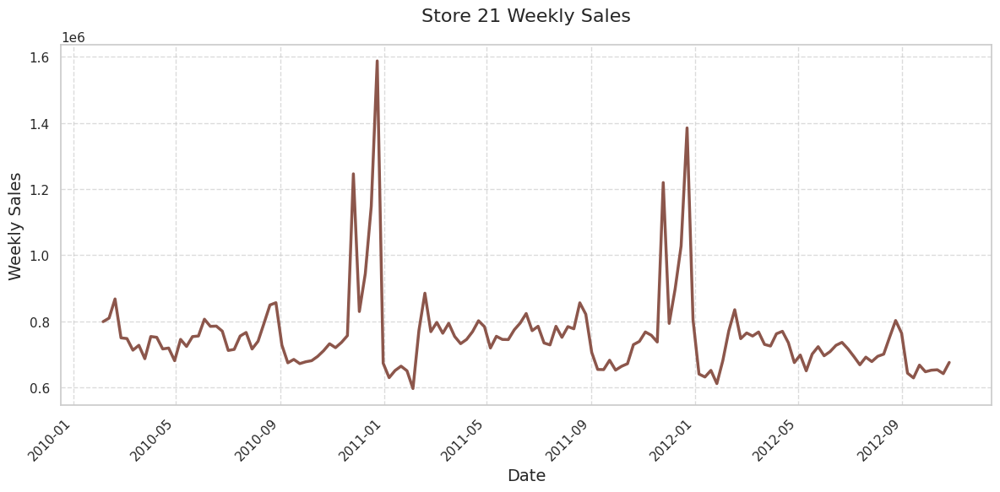

In [ ]:
between_5_5_stores = store_data[20:26]

colors = sns.color_palette('tab10', n_colors=6)

for i, store in enumerate(between_5_5_stores['Store']):
  plt.figure(figsize=(12,6))
  sns.lineplot(x='Date',y='Weekly_Sales',data=df[df['Store']==store],color=colors[i],linewidth=2.5)
  plt.title(f'Store {store} Weekly Sales', fontsize=16, pad=20)
  plt.xlabel('Date', fontsize=14)
  plt.ylabel('Weekly Sales', fontsize=14)
  plt.xticks(rotation=45, ha='right')
  plt.grid(True, linestyle='--', alpha=0.7)
  plt.tight_layout()
  plt.show()

*Plots from highest and average sales shows similar seasonality and trend but stores with lowest sales differs either in seasonality or trend*

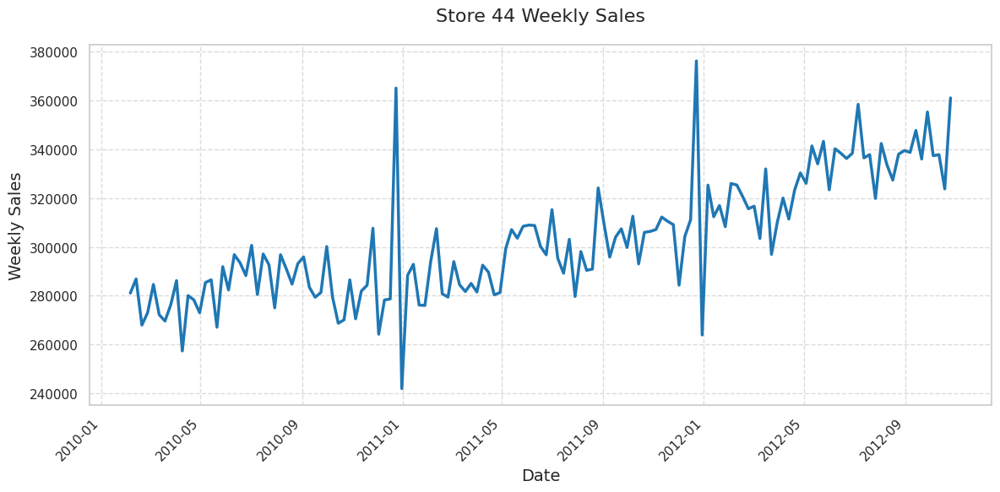

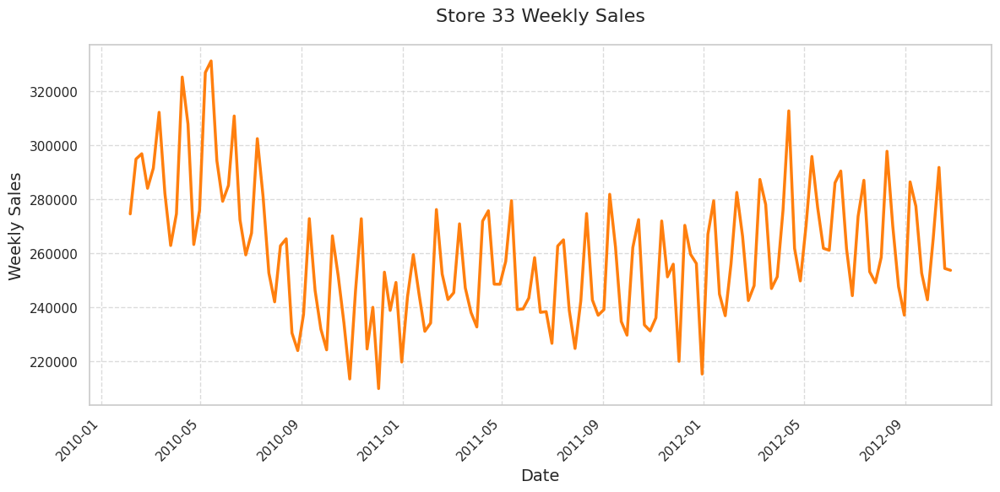

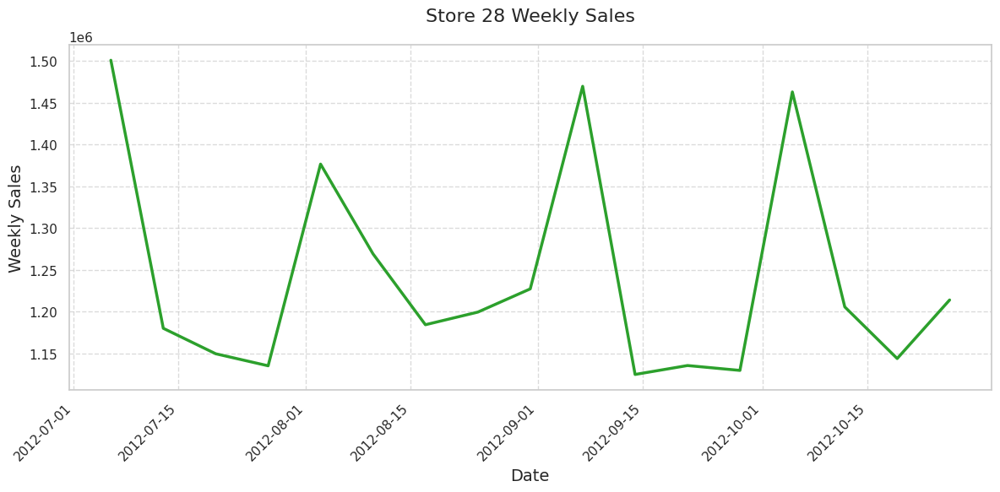

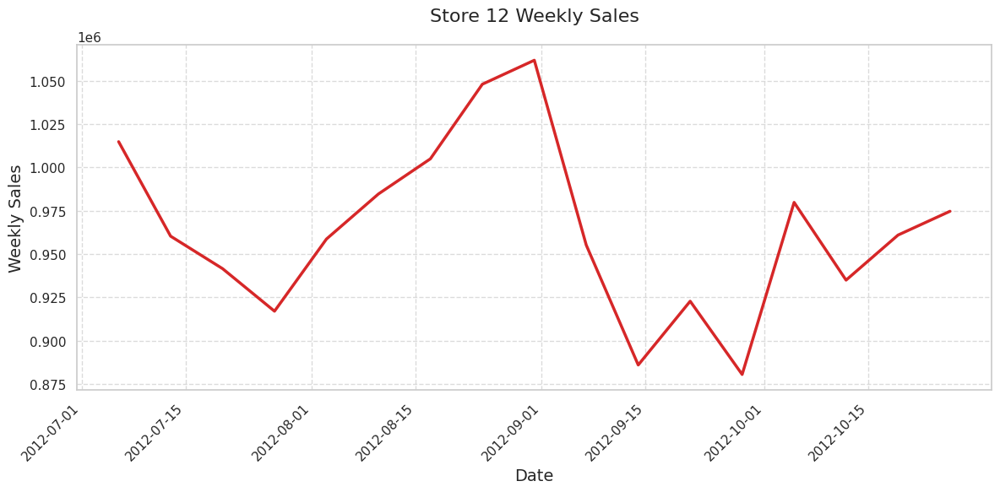

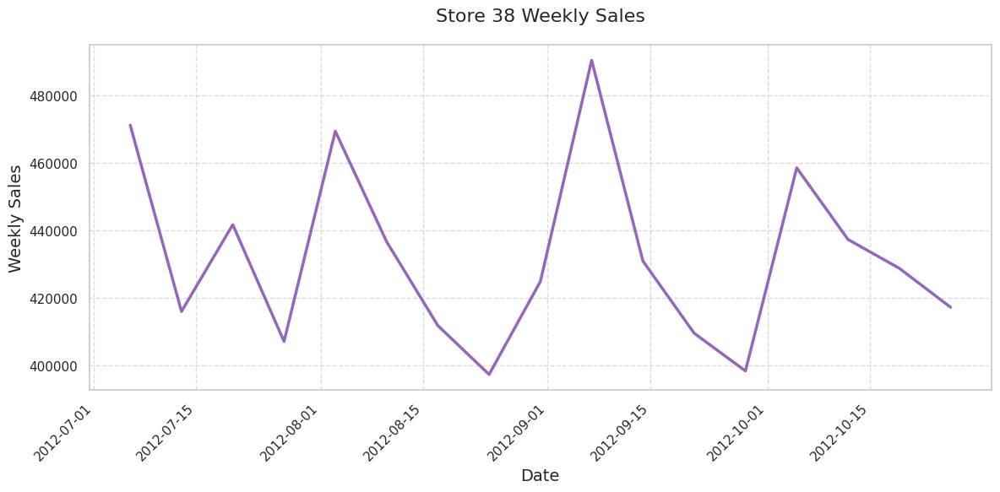

In [ ]:
last_5_stores = store_data.tail(5)

colors = sns.color_palette('tab10', n_colors=5)

for i, store in enumerate(last_5_stores['Store']):
  plt.figure(figsize=(12,6))
  sns.lineplot(x='Date',y='Weekly_Sales',data=df[df['Store']==store],color=colors[i],linewidth=2.5)
  plt.title(f'Store {store} Weekly Sales', fontsize=16, pad=20)
  plt.xlabel('Date', fontsize=14)
  plt.ylabel('Weekly Sales', fontsize=14)
  plt.xticks(rotation=45, ha='right')
  plt.grid(True, linestyle='--', alpha=0.7)
  plt.tight_layout()
  plt.show()

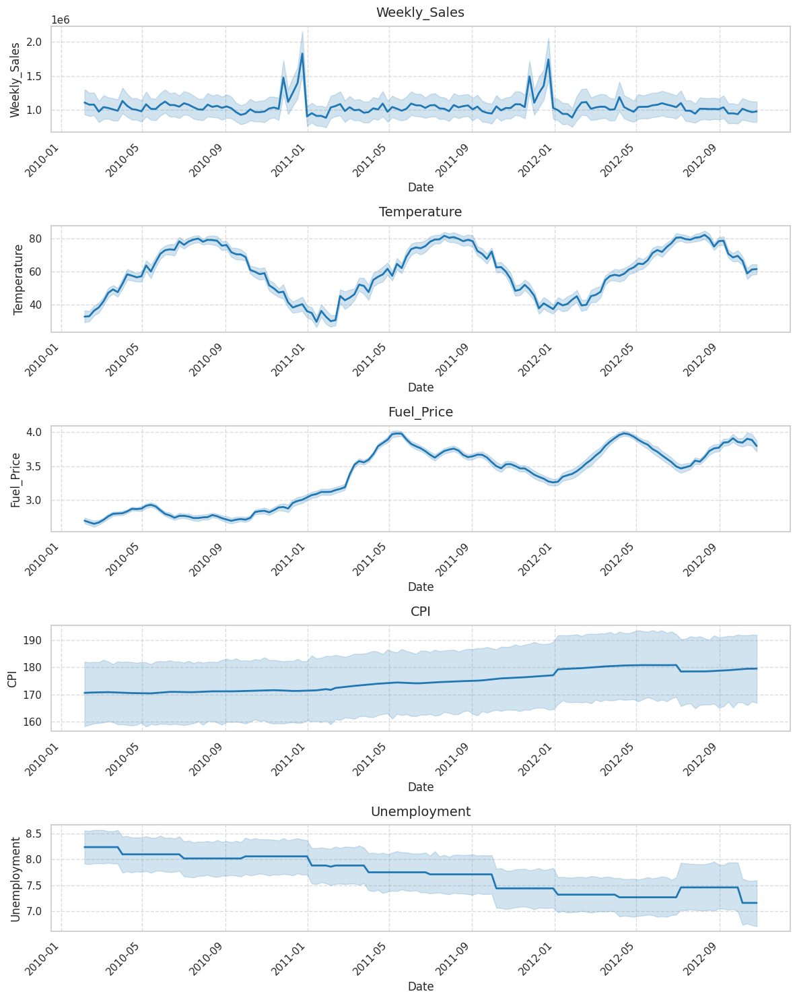

In [ ]:
# List of columns to plot
cols = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']

# Create a figure with multiple subplots
plt.figure(figsize=(12, 15))  # Adjusted figure size for better readability

# Loop through each column to create subplots
for i, col in enumerate(cols, 1):
    plt.subplot(5, 1, i)

    # Plot each column with enhanced aesthetics
    sns.lineplot(x='Date', y=col, data=df, color='tab:blue', linewidth=2)

    # Set title and labels with larger fonts
    plt.title(col, fontsize=14, pad=10)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel(col, fontsize=12)

    # Format x-axis for better readability
    plt.xticks(rotation=45, ha='right')

    # Add gridlines for clarity
    plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to prevent clipping
plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
data_monthly = pd.crosstab(data['Year'],data['Month'],values=data['Weekly_Sales'],aggfunc='sum')
data_monthly

Month,1,2,3,4,5,6,7,8,9,10,11,12
Year,,,,,,,,,,,,
2010,NaN,1.903330e+08,1.819198e+08,2.314124e+08,1.867109e+08,1.922462e+08,2.325801e+08,1.876401e+08,1.772679e+08,2.171618e+08,2.028534e+08,2.887605e+08
2011,1.637040e+08,1.863313e+08,1.793564e+08,2.265265e+08,1.816482e+08,1.897734e+08,2.299114e+08,1.885993e+08,2.208477e+08,1.832613e+08,2.101624e+08,2.880781e+08
2012,1.688945e+08,1.920636e+08,2.315097e+08,1.889209e+08,1.887665e+08,2.406103e+08,1.875095e+08,2.368508e+08,1.806455e+08,1.843617e+08,NaN,NaN


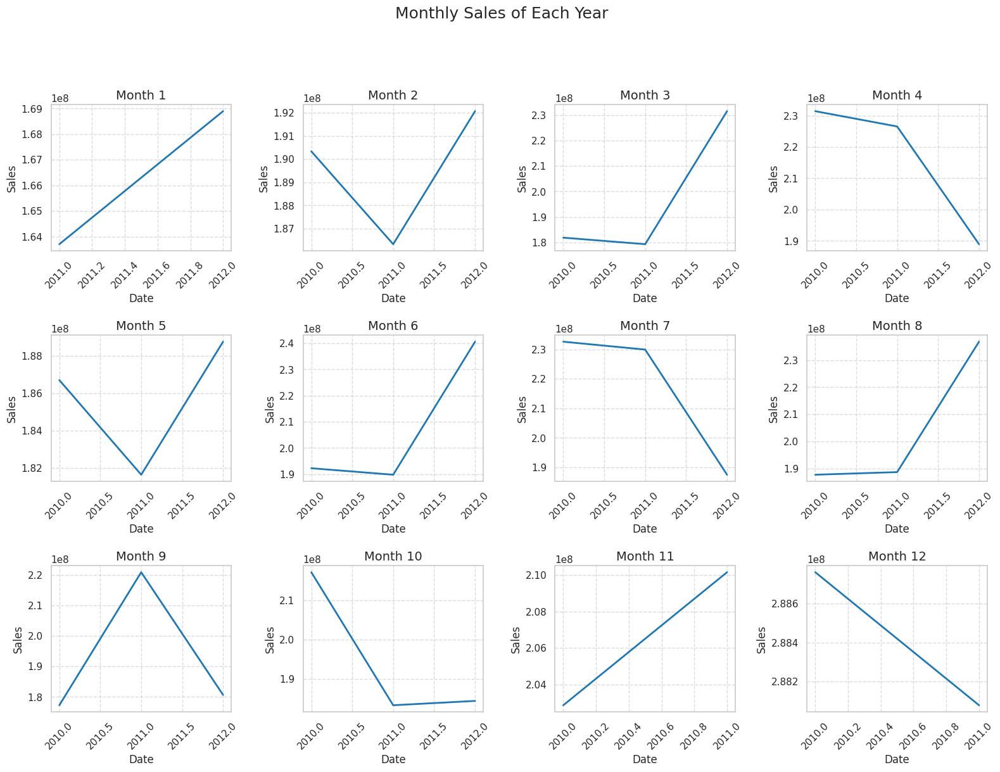

In [ ]:

# Create subplots with improved aesthetics
fig, axes = plt.subplots(3, 4, figsize=(16, 12))  # Adjusted figure size for better clarity
plt.suptitle('Monthly Sales of Each Year', fontsize=18, y=1.02)  # Title with padding

# Iterate over the grid and plot each subplot
k = 1
for i in range(3):
    for j in range(4):
        # Plot each month's data
        sns.lineplot(data=data_monthly[k], ax=axes[i][j], color='tab:blue', linewidth=2)

        # Set title and labels for each subplot
        axes[i][j].set_title(f'Month {k}', fontsize=14)
        axes[i][j].set_xlabel('Date', fontsize=12)
        axes[i][j].set_ylabel('Sales', fontsize=12)

        # Rotate x-axis labels for readability
        axes[i][j].tick_params(axis='x', rotation=45)

        # Add gridlines
        axes[i][j].grid(True, linestyle='--', alpha=0.7)

        k += 1

# Adjust layout to prevent clipping and improve spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust the layout for the suptitle
plt.show()


In [ ]:
data.shape

(6435, 10)

In [ ]:
num_cols = ['Weekly_Sales','Temperature','Fuel_Price','CPI','Unemployment']

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
data[num_cols] = scaler.fit_transform(data[num_cols])
data.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Year,Month,Day
Date,,,,,,,,,,
2010-02-05,1,0.397291,0,0.434149,0.050100,0.840500,0.405118,2010,2,5
2010-02-12,1,0.396811,1,0.396967,0.038076,0.841941,0.405118,2010,2,12
2010-02-19,1,0.388501,0,0.410861,0.021042,0.842405,0.405118,2010,2,19
2010-02-26,1,0.332458,0,0.476419,0.044589,0.842707,0.405118,2010,2,26
2010-03-05,1,0.372661,0,0.475147,0.076653,0.843008,0.405118,2010,3,5


In [ ]:
data.tail()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Year,Month,Day
Date,,,,,,,,,,
2012-09-28,45,0.139437,0,0.654990,0.764028,0.651876,0.460514,2012,9,28
2012-10-05,45,0.145057,0,0.655088,0.758016,0.653427,0.458884,2012,10,5
2012-10-12,45,0.145337,0,0.553131,0.765531,0.654977,0.458884,2012,10,12
2012-10-19,45,0.140810,0,0.572701,0.750000,0.655013,0.458884,2012,10,19
2012-10-26,45,0.152491,0,0.595988,0.706413,0.654796,0.458884,2012,10,26


In [ ]:

X = data.drop(columns=['Weekly_Sales'])
Y = data['Weekly_Sales']
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size=0.20, random_state=50)

# from sklearn.linear_model import LinearRegression
poly = PolynomialFeatures(degree=4)
X_train = poly.fit_transform(X_train)
X_test = poly.fit_transform(X_test)
lr = LinearRegression()
lr.fit(X_train,y_train)
lr_acc = lr.score(X_test,y_test)*100
print("Linear Regressor Accuracy - ",lr_acc)
y_pred = lr.predict(X_test)

from sklearn import metrics
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("R2" , metrics.explained_variance_score(y_test, y_pred))
lr_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
lr_df

Linear Regressor Accuracy -  40.936617500595716
MAE 0.08936960438336107
MSE 0.014296832327850917
RMSE 0.11956936199483092
R2 0.4093662727732037


,Actual,Predicted
Date,,
2012-08-03,0.544387,0.585923
2012-02-10,0.285105,0.182088
2012-07-06,0.041144,0.010055
2010-08-27,0.420533,0.436871
2010-02-26,0.149517,0.045593
...,...,...
2011-11-18,0.368414,0.457644
2011-01-07,0.261482,0.138430
2010-10-22,0.195787,0.234240


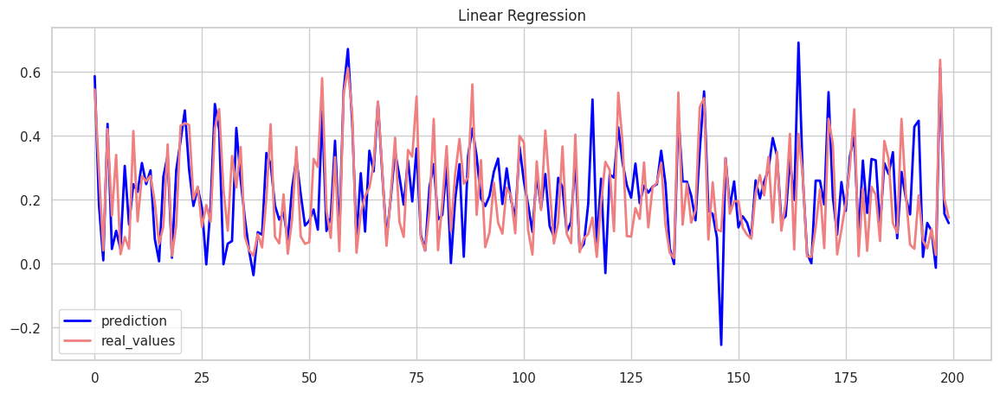

In [ ]:
plt.figure(figsize=(14,5))
plt.plot(lr.predict(X_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")
plt.title("Linear Regression")
plt.show()

In [ ]:
# from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train, y_train)
rf_acc = rf.score(X_test,y_test)*100
print("Random Forest Regressor Accuracy - ",rf_acc)

y_pred = rf.predict(X_test)
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("R2" , metrics.explained_variance_score(y_test, y_pred))
rf_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
rf_df


Random Forest Regressor Accuracy -  94.88721875919063
MAE 0.017596610283486438
MSE 0.0012375954954759046
RMSE 0.035179475486082856
R2 0.9488960319655401


,Actual,Predicted
Date,,
2012-08-03,0.544387,0.546949
2012-02-10,0.285105,0.287697
2012-07-06,0.041144,0.035804
2010-08-27,0.420533,0.452726
2010-02-26,0.149517,0.177084
...,...,...
2011-11-18,0.368414,0.406223
2011-01-07,0.261482,0.240221
2010-10-22,0.195787,0.197783


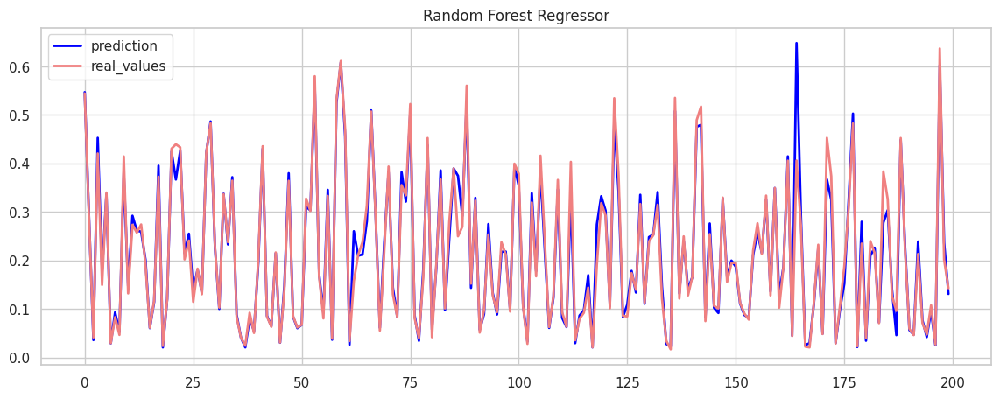

In [ ]:
plt.figure(figsize=(14,5))
plt.plot(rf.predict(X_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")
plt.title("Random Forest Regressor")
plt.show()

In [ ]:

from xgboost import XGBRegressor
xgbr = XGBRegressor()
xgbr.fit(X_train, y_train)
xgb_acc = xgbr.score(X_test,y_test)*100
print("XGBoost Regressor Accuracy - ",xgb_acc)

y_pred = xgbr.predict(X_test)
print("MAE" , metrics.mean_absolute_error(y_test, y_pred))
print("MSE" , metrics.mean_squared_error(y_test, y_pred))
print("RMSE" , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("R2" , metrics.explained_variance_score(y_test, y_pred))
xgb_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
xgb_df


XGBoost Regressor Accuracy -  97.58973446504055
MAE 0.01460597740926722
MSE 0.0005834268333558579
RMSE 0.024154230133785218
R2 0.9759004421833759


,Actual,Predicted
Date,,
2012-08-03,0.544387,0.536791
2012-02-10,0.285105,0.293301
2012-07-06,0.041144,0.043601
2010-08-27,0.420533,0.455455
2010-02-26,0.149517,0.149826
...,...,...
2011-11-18,0.368414,0.384226
2011-01-07,0.261482,0.234485
2010-10-22,0.195787,0.188532


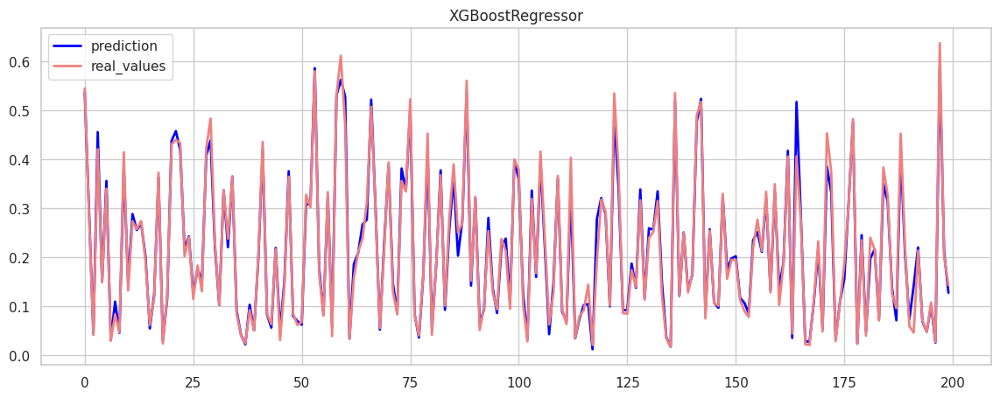

In [ ]:
plt.figure(figsize=(14,5))
plt.plot(xgbr.predict(X_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")
plt.title("XGBoostRegressor")
plt.show()

#FORECASTING using ARIMA, SARIMA, and FBProphet

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
data = pd.read_csv('sample_data/Walmart.csv')

data['Date'] = pd.to_datetime(data['Date'],format='%d-%m-%Y')

weekly_sales = data.groupby(['Store','Date'])['Weekly_Sales'].sum().reset_index()

store_sales = weekly_sales.pivot(index='Date',columns='Store',values='Weekly_Sales')
store1_sales = store_sales[1]
store1_sales.index = pd.to_datetime(store1_sales.index)
train = store1_sales[:-12]
test = store1_sales[-12:]
test.head()

,1
Date,
2012-08-10,1592409.97
2012-08-17,1597868.05
2012-08-24,1494122.38
2012-08-31,1582083.40
2012-09-07,1661767.33


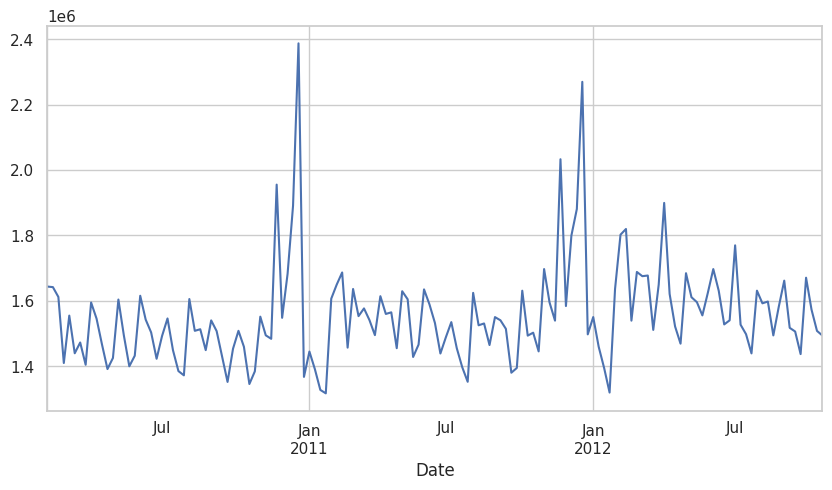

In [ ]:
store1_sales.plot(figsize=(10,5))
plt.show()

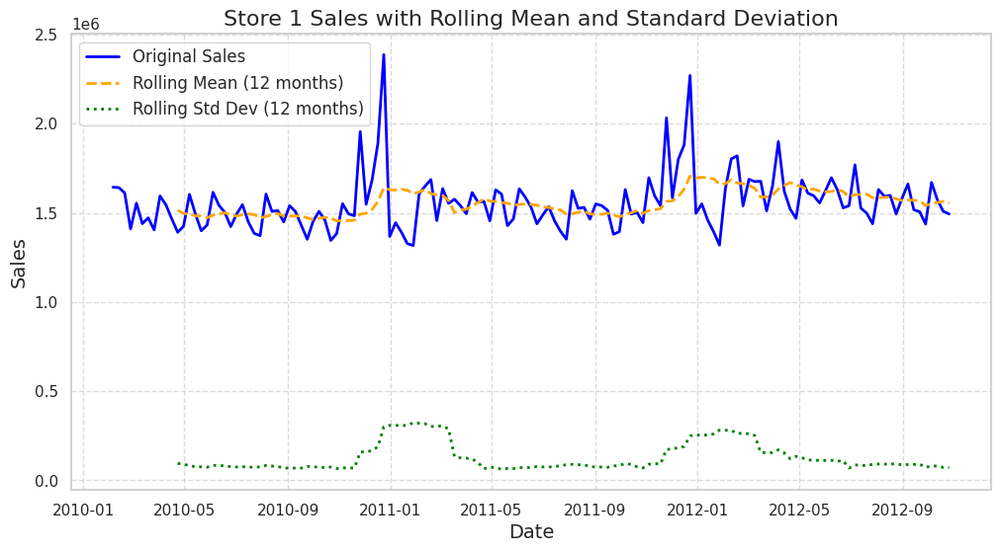

In [ ]:
import matplotlib.pyplot as plt

# Calculate rolling mean and standard deviation
mean_roll = store1_sales.rolling(window=12).mean()
std_roll = store1_sales.rolling(window=12).std()

# Create the plot
plt.figure(figsize=(12, 6))

# Plot the original data
plt.plot(store1_sales, label='Original Sales', color='blue', linestyle='-', linewidth=2)

# Plot the rolling mean
plt.plot(mean_roll, label='Rolling Mean (12 months)', color='orange', linestyle='--', linewidth=2)

# Plot the rolling standard deviation
plt.plot(std_roll, label='Rolling Std Dev (12 months)', color='green', linestyle=':', linewidth=2)

# Add title and labels
plt.title('Store 1 Sales with Rolling Mean and Standard Deviation', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Sales', fontsize=14)

# Add gridlines
plt.grid(True, linestyle='--', alpha=0.7)

# Improve legend
plt.legend(loc='best', fontsize=12)

# Show the plot
plt.show()


In [ ]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(store1_sales)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -5.102186
p-value: 0.000014


In [ ]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.stattools import acf,pacf
# lag_acf = acf(store1_sales,nlags=20)
# lag_pacf = pacf(store1_sales,nlags=20,method='ols')
# acf_values = acf(store1_sales,nlags=20)
# pacf_values = pacf(store1_sales,nlags=20,method='ols')


In [ ]:
acf_values = acf(store1_sales)
pacf_values = pacf(store1_sales)


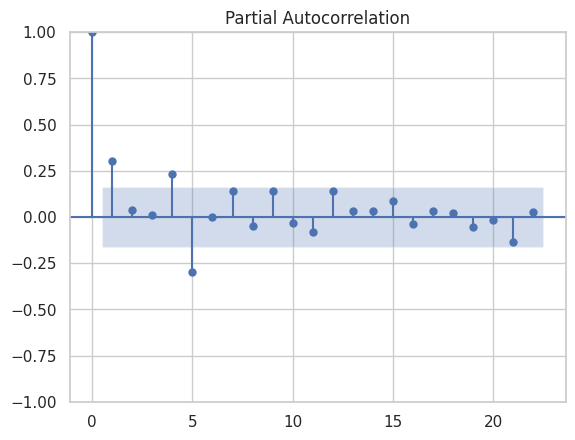

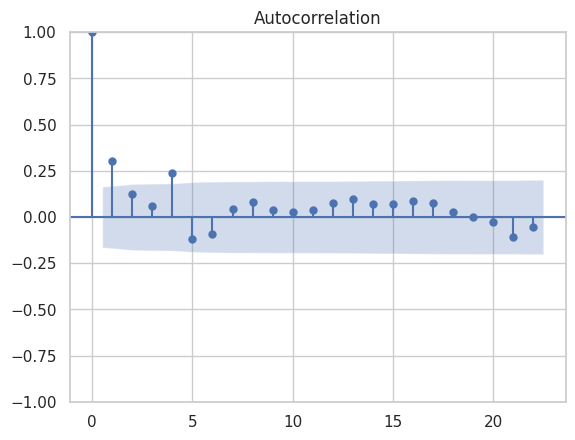

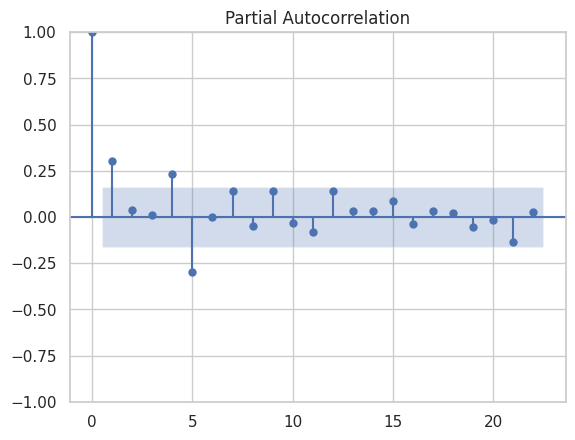

In [ ]:
plot_acf(store1_sales)
plot_pacf(store1_sales)

In [ ]:
import warnings

# Suppress all UserWarnings
warnings.filterwarnings("ignore", category=UserWarning)


orders = list()
for p in range(0,3):
  for d in range(0,3):
    for q in range(0,3):
      order = (p,d,q)
      try:
        model = ARIMA(train,order=order)
        model_fit = model.fit()
        orders.append([order,model_fit.aic])
      except:
        continue
orders.sort(key=lambda x:x[1])
orders




[[(2, 0, 2), 3491.8122515206323],
 [(1, 0, 2), 3500.056093611568],
 [(1, 1, 1), 3503.730637870845],
 [(2, 1, 2), 3504.5495032845974],
 [(1, 1, 2), 3505.5218499809534],
 [(2, 1, 1), 3506.0071614027247],
 [(1, 0, 0), 3506.0597502636238],
 [(0, 1, 2), 3506.87865188027],
 [(1, 0, 1), 3507.7057504022796],
 [(0, 0, 2), 3507.766951186168],
 [(2, 0, 0), 3507.794332633963],
 [(0, 0, 1), 3508.2559179114087],
 [(2, 0, 1), 3509.5202883564525],
 [(0, 1, 1), 3514.8984809011695],
 [(2, 1, 0), 3518.7548013091055],
 [(1, 1, 0), 3521.1224287201776],
 [(0, 1, 0), 3531.1751194046465],
 [(0, 2, 1), 3533.343420465101],
 [(1, 2, 1), 3534.1764256143956],
 [(1, 2, 2), 3534.276583661344],
 [(2, 2, 1), 3535.1951170880766],
 [(2, 2, 2), 3536.0086857080732],
 [(0, 2, 2), 3537.3657196508557],
 [(2, 2, 0), 3580.1384689129827],
 [(1, 2, 0), 3591.3026658492518],
 [(0, 2, 0), 3635.107229685783],
 [(0, 0, 0), 4025.67684158233]]

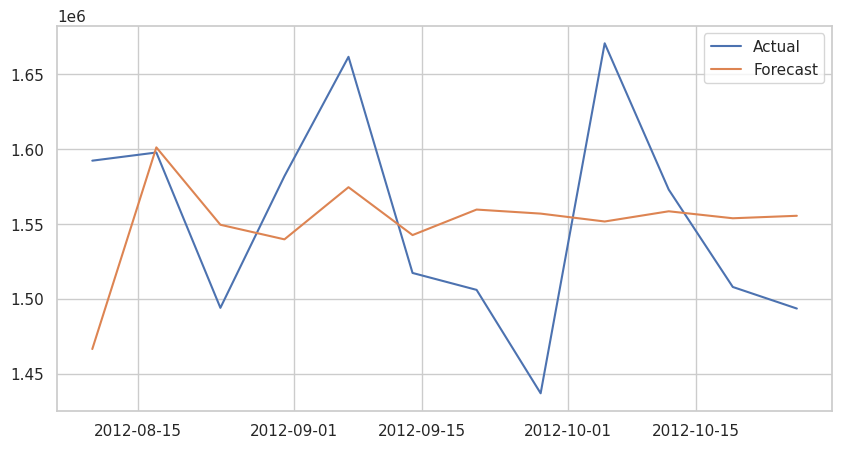

In [ ]:
model = ARIMA(train,order=(2,0,2))
model_fit = model.fit()
forecast = model_fit.forecast(steps=12)
plt.figure(figsize=(10,5))
plt.plot(test,label='Actual')
plt.plot(forecast,label='Forecast')
plt.legend()
plt.show()

In [ ]:
mae = metrics.mean_absolute_error(test,forecast)
mse = metrics.mean_squared_error(test,forecast)
rmse = np.sqrt(metrics.mean_squared_error(test,forecast))
r2 = metrics.explained_variance_score(test,forecast)
print(f'MAE:{mae}')
print(f'MSE:{mse}')
print(f'RMSE:{rmse}')
print(f'R2:{r2}')

MAE:62850.13043546587
MSE:5542141167.143615
RMSE:74445.5584111209
R2:-0.1777776807725595


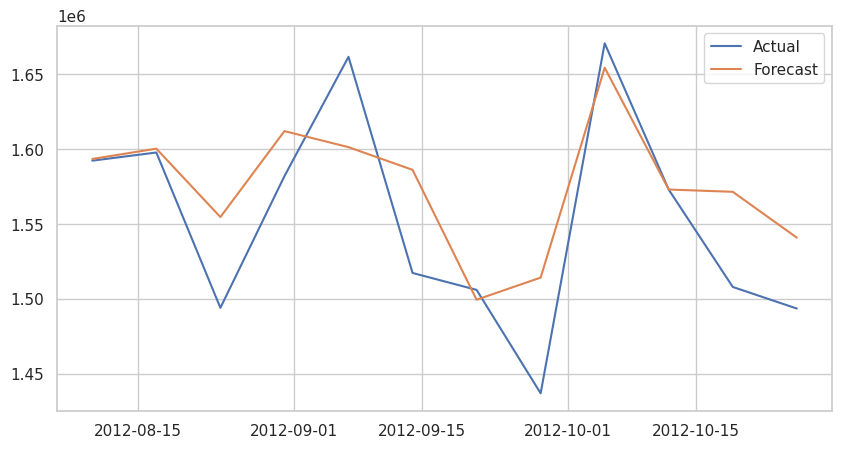

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
model = SARIMAX(train,order=(2,0,2),seasonal_order=(2,0,2,52))
model_fit = model.fit(disp=False)
forecast = model_fit.forecast(steps=12)
plt.figure(figsize=(10,5))
plt.plot(test,label='Actual')
plt.plot(forecast,label='Forecast')
plt.legend()
plt.show()

In [ ]:
mae = metrics.mean_absolute_error(test,forecast)
mse = metrics.mean_squared_error(test,forecast)
rmse = np.sqrt(metrics.mean_squared_error(test,forecast))
r2 = metrics.explained_variance_score(test,forecast)
print(f'MAE:{mae}')
print(f'MSE:{mse}')
print(f'RMSE:{rmse}')
print(f'R2:{r2}')

MAE:36223.0511861207
MSE:2127346841.4307988
RMSE:46123.17033152425
R2:0.653938782235197


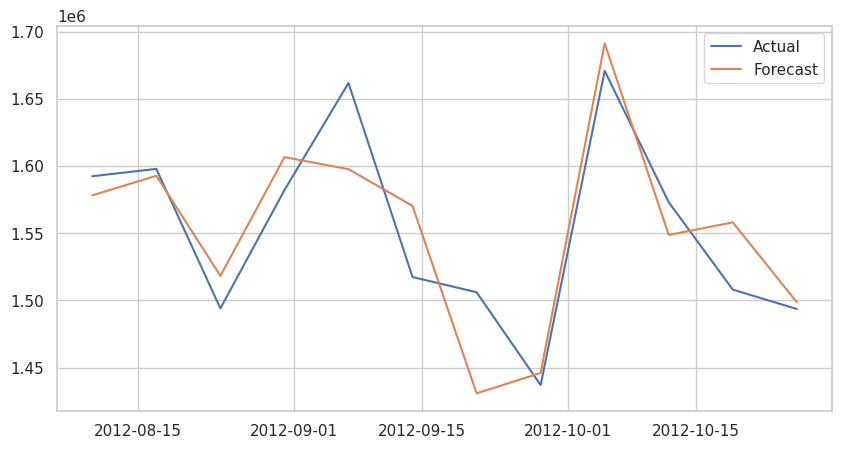

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
model = SARIMAX(train,order=(2,0,2),seasonal_order=(1,1,1,52))
model_fit = model.fit(disp=False)
forecast = model_fit.forecast(steps=12)
plt.figure(figsize=(10,5))
plt.plot(test,label='Actual')
plt.plot(forecast,label='Forecast')
plt.legend()
plt.show()

In [ ]:
mae = metrics.mean_absolute_error(test,forecast)
mse = metrics.mean_squared_error(test,forecast)
rmse = np.sqrt(metrics.mean_squared_error(test,forecast))
r2 = metrics.explained_variance_score(test,forecast)
print(f'MAE:{mae}')
print(f'MSE:{mse}')
print(f'RMSE:{rmse}')
print(f'R2:{r2}')

MAE:30762.57142115588
MSE:1466764701.464812
RMSE:38298.36421395582
R2:0.6881038121327195


In [ ]:
weekly_sales = data.groupby(['Store','Date'])['Weekly_Sales'].sum().reset_index()
store1_sales = weekly_sales[weekly_sales['Store']==1]
store1_sales = store1_sales[['Date','Weekly_Sales']]
store1_sales.columns = ['ds','y']
store1_sales['ds'] = pd.to_datetime(store1_sales['ds'])

In [ ]:
# !pip install prophet

In [ ]:
from prophet import Prophet
import logging
logging.getLogger('prophet').setLevel(logging.ERROR)
logging.getLogger('cmdstanpy').setLevel(logging.ERROR)
import logging

# Set the logging level to WARNING to suppress debug and info messages
logging.getLogger('cmdstanpy').setLevel(logging.WARNING)

model = Prophet(interval_width=0.95)
model.fit(store1_sales)
future_weeks = model.make_future_dataframe(periods=12,freq='W')
forecast = model.predict(future_weeks)
forecast.head()

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/guoe9b3i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/1gnj8mz7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54703', 'data', 'file=/tmp/tmphjc3d4bj/guoe9b3i.json', 'init=/tmp/tmphjc3d4bj/1gnj8mz7.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelitr223i1/prophet_model-20240930140213.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2010-02-05,1.483588e+06,1.381088e+06,1.777405e+06,1.483588e+06,1.483588e+06,92035.010505,92035.010505,92035.010505,92035.010505,92035.010505,92035.010505,0.0,0.0,0.0,1.575623e+06
1,2010-02-12,1.484651e+06,1.430166e+06,1.838257e+06,1.484651e+06,1.484651e+06,145657.018941,145657.018941,145657.018941,145657.018941,145657.018941,145657.018941,0.0,0.0,0.0,1.630308e+06
2,2010-02-19,1.485713e+06,1.391464e+06,1.800354e+06,1.485713e+06,1.485713e+06,102501.917671,102501.917671,102501.917671,102501.917671,102501.917671,102501.917671,0.0,0.0,0.0,1.588215e+06
3,2010-02-26,1.486776e+06,1.296652e+06,1.731915e+06,1.486776e+06,1.486776e+06,35794.834355,35794.834355,35794.834355,35794.834355,35794.834355,35794.834355,0.0,0.0,0.0,1.522570e+06
4,2010-03-05,1.487838e+06,1.283047e+06,1.702272e+06,1.487838e+06,1.487838e+06,650.782406,650.782406,650.782406,650.782406,650.782406,650.782406,0.0,0.0,0.0,1.488489e+06


In [ ]:
forecast.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155 entries, 0 to 154
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ds                          155 non-null    datetime64[ns]
 1   trend                       155 non-null    float64       
 2   yhat_lower                  155 non-null    float64       
 3   yhat_upper                  155 non-null    float64       
 4   trend_lower                 155 non-null    float64       
 5   trend_upper                 155 non-null    float64       
 6   additive_terms              155 non-null    float64       
 7   additive_terms_lower        155 non-null    float64       
 8   additive_terms_upper        155 non-null    float64       
 9   yearly                      155 non-null    float64       
 10  yearly_lower                155 non-null    float64       
 11  yearly_upper                155 non-null    float64       

In [ ]:
forecast[['yhat','yhat_lower','yhat_upper']] = forecast[['yhat','yhat_lower','yhat_upper']].astype(int)

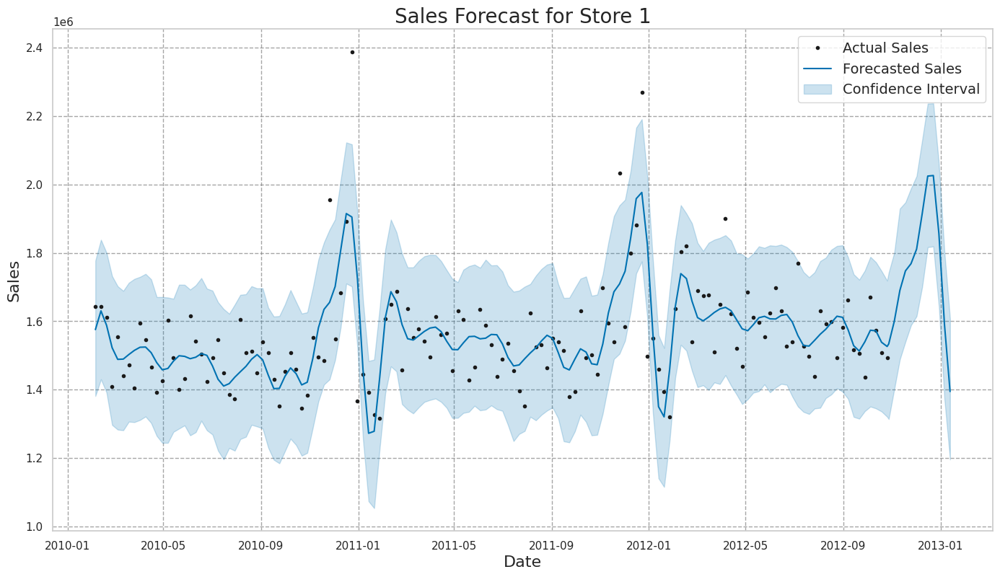

In [ ]:
# Plot the forecast
sales_forecast = model.plot(forecast, figsize=(14, 8))

# Set a more descriptive title with increased font size
plt.title('Sales Forecast for Store 1', fontsize=20)

# Label the x and y axes with larger font sizes
plt.xlabel('Date', fontsize=16)
plt.ylabel('Sales', fontsize=16)

# Add gridlines for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Customize the legend for better readability
plt.legend(['Actual Sales', 'Forecasted Sales', 'Confidence Interval'], fontsize=14)

# Show the plot
plt.show()


In [ ]:
y_true = store1_sales['y']
y_pred = forecast['yhat'][:len(store1_sales)].values
mae = metrics.mean_absolute_error(y_true,y_pred)
mse = metrics.mean_squared_error(y_true,y_pred)
rmse = np.sqrt(metrics.mean_squared_error(y_true,y_pred))
r2 = metrics.explained_variance_score(y_true,y_pred)

print(f'MAE:{mae}')
print(f'MSE:{mse}')
print(f'RMSE:{rmse}')
print(f'R2:{r2}')

MAE:76151.68916083916
MSE:11422457486.155663
RMSE:106875.89759228066
R2:0.5272136521747667


*1) Store 36 and 43 forecasting indicates the sales are decreasing with the time and*

*2) Store 30, 33, 37 and 42 forecat indicate the sales are irregular with the time*

*3)Store 38 even though doesnt have the seasonality but sales increases with time*

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/0s_7pas_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/0k9ydp91.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71681', 'data', 'file=/tmp/tmphjc3d4bj/0s_7pas_.json', 'init=/tmp/tmphjc3d4bj/0k9ydp91.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model0f7s_k2f/prophet_model-20240930140215.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


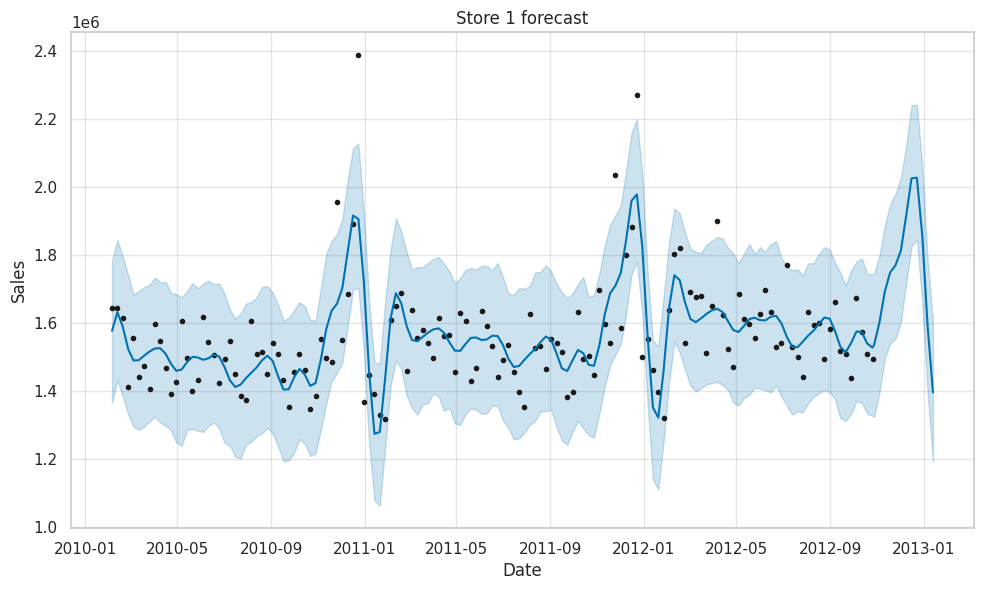

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/bv_0icee.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/yup4utcm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37441', 'data', 'file=/tmp/tmphjc3d4bj/bv_0icee.json', 'init=/tmp/tmphjc3d4bj/yup4utcm.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelq6x87jz3/prophet_model-20240930140216.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


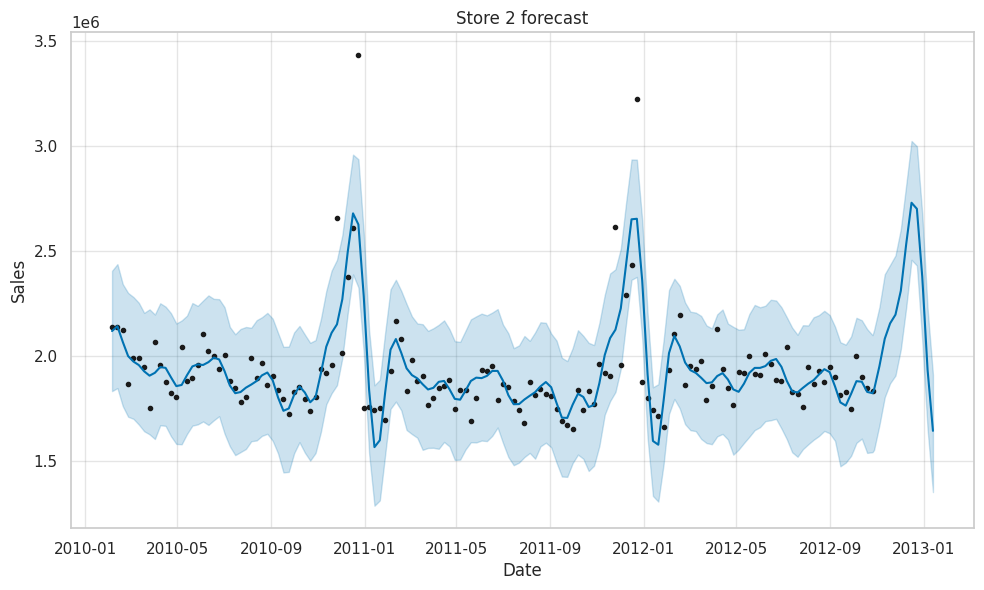

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/izdrvpti.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/8xk_2tsm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61140', 'data', 'file=/tmp/tmphjc3d4bj/izdrvpti.json', 'init=/tmp/tmphjc3d4bj/8xk_2tsm.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelmgkxf8vn/prophet_model-20240930140217.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


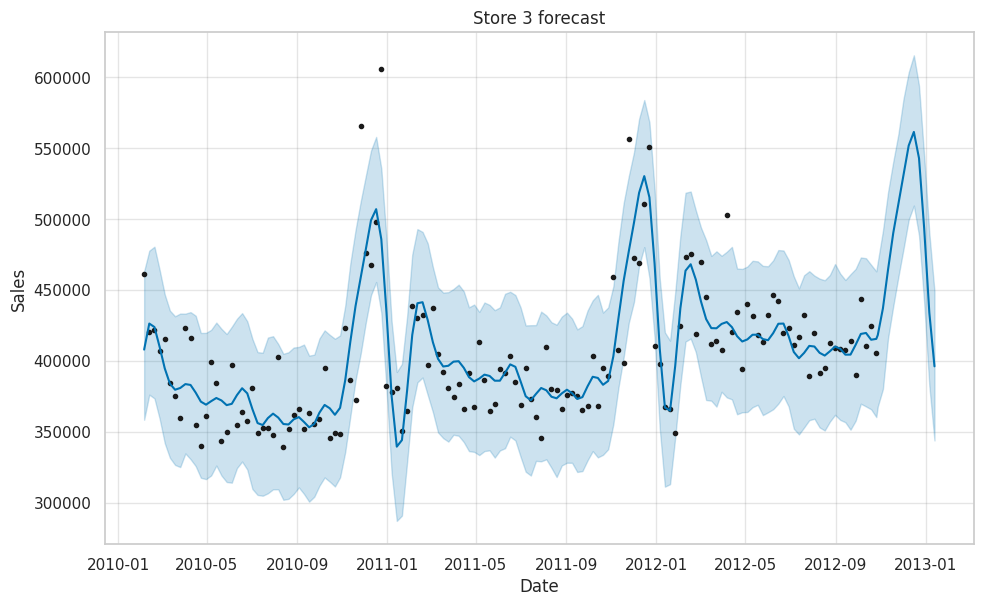

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/ge9xwmur.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/iicna0ff.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25547', 'data', 'file=/tmp/tmphjc3d4bj/ge9xwmur.json', 'init=/tmp/tmphjc3d4bj/iicna0ff.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelq89py0se/prophet_model-20240930140219.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


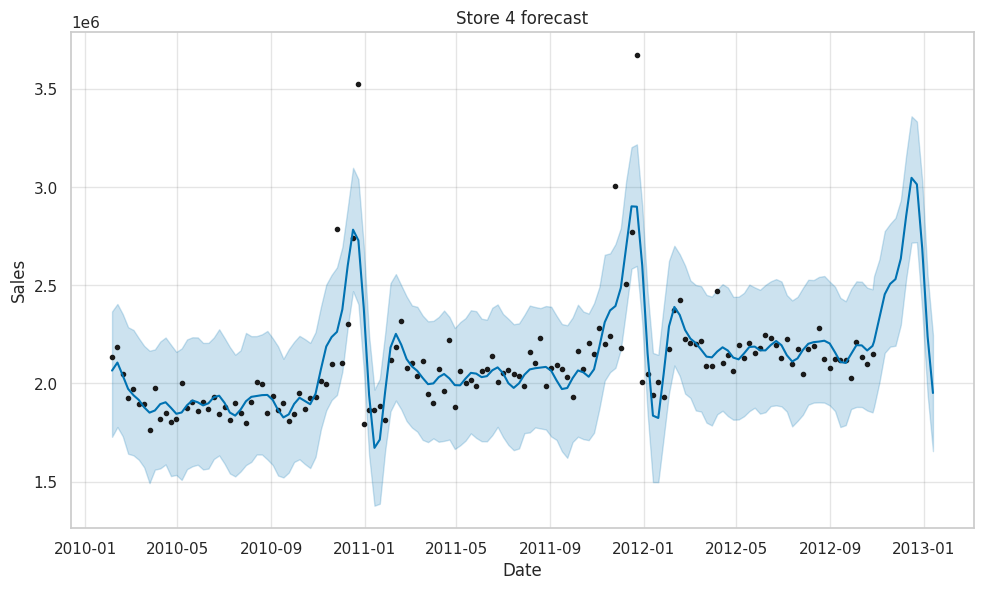

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/7wm6xqo9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/r0mjpyv0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2064', 'data', 'file=/tmp/tmphjc3d4bj/7wm6xqo9.json', 'init=/tmp/tmphjc3d4bj/r0mjpyv0.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelntqovpeo/prophet_model-20240930140220.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


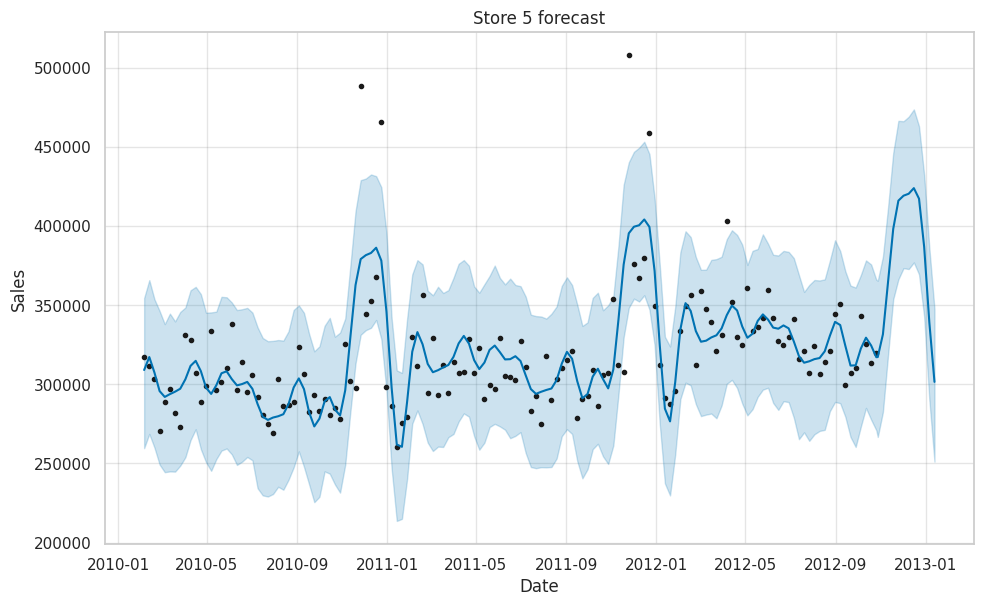

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/l3ja67i4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/hfqcjmwq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97440', 'data', 'file=/tmp/tmphjc3d4bj/l3ja67i4.json', 'init=/tmp/tmphjc3d4bj/hfqcjmwq.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelyjmuqvgv/prophet_model-20240930140221.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


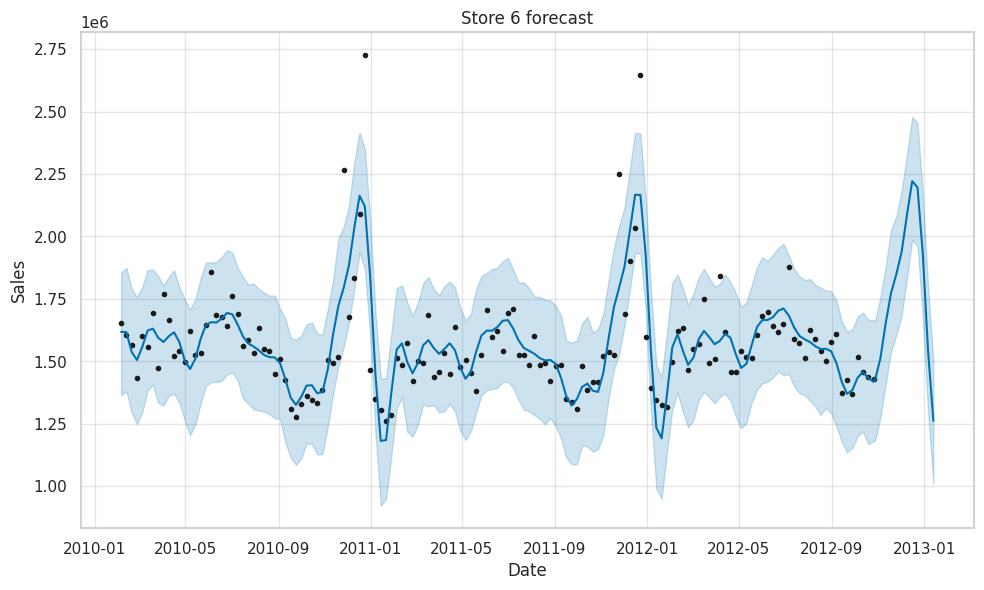

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/6lkxiwic.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/86qnwxh_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6786', 'data', 'file=/tmp/tmphjc3d4bj/6lkxiwic.json', 'init=/tmp/tmphjc3d4bj/86qnwxh_.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelmn3dzyit/prophet_model-20240930140222.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


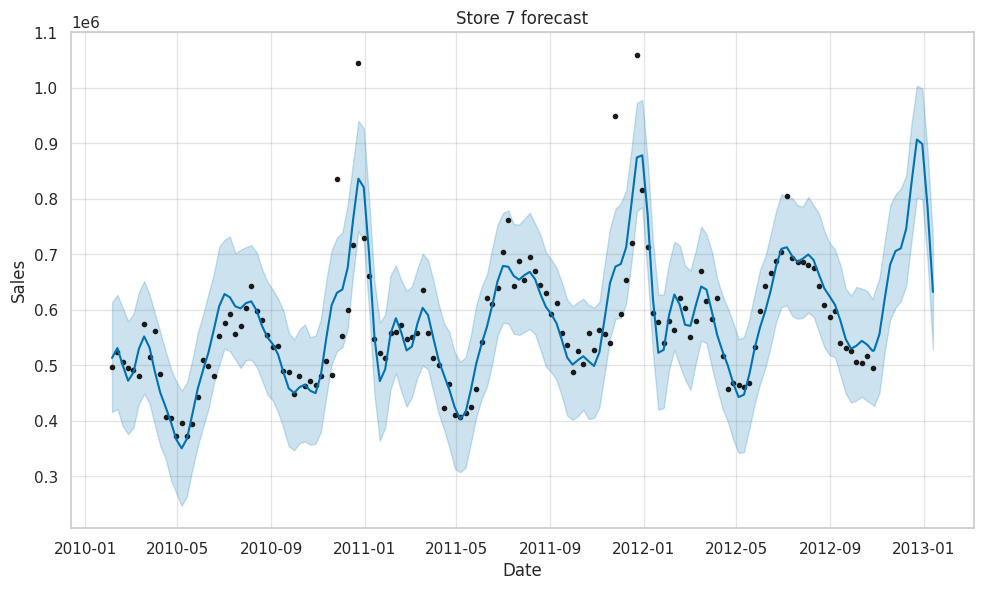

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/g9e71x1d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/36ce5kbb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=814', 'data', 'file=/tmp/tmphjc3d4bj/g9e71x1d.json', 'init=/tmp/tmphjc3d4bj/36ce5kbb.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model_4j97can/prophet_model-20240930140223.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


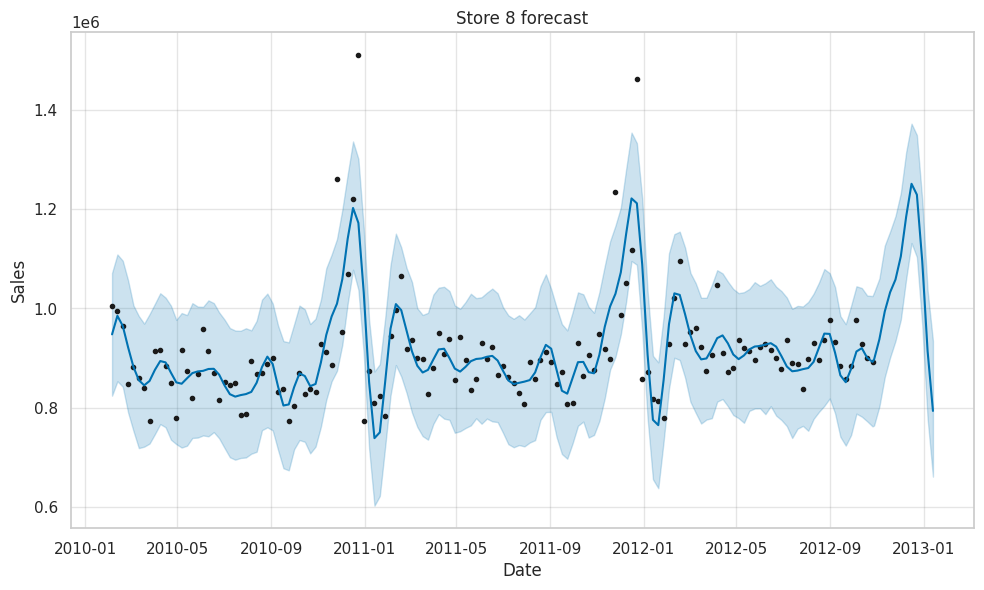

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/gxhdiba0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/h7_yihji.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55473', 'data', 'file=/tmp/tmphjc3d4bj/gxhdiba0.json', 'init=/tmp/tmphjc3d4bj/h7_yihji.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelttk83y0e/prophet_model-20240930140224.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


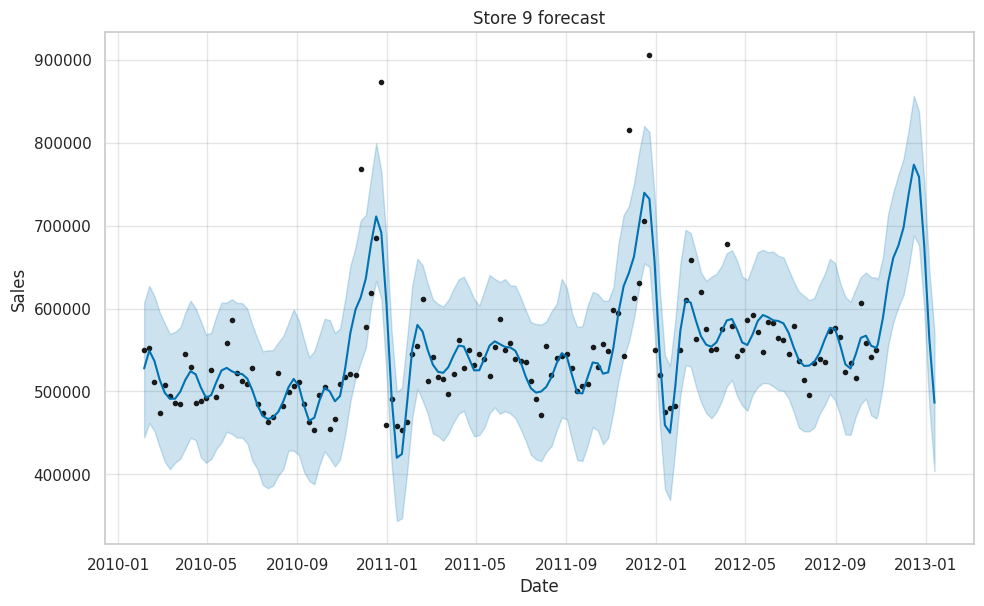

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/x3_mrnux.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/3ybcflhu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79310', 'data', 'file=/tmp/tmphjc3d4bj/x3_mrnux.json', 'init=/tmp/tmphjc3d4bj/3ybcflhu.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model237xg81e/prophet_model-20240930140225.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


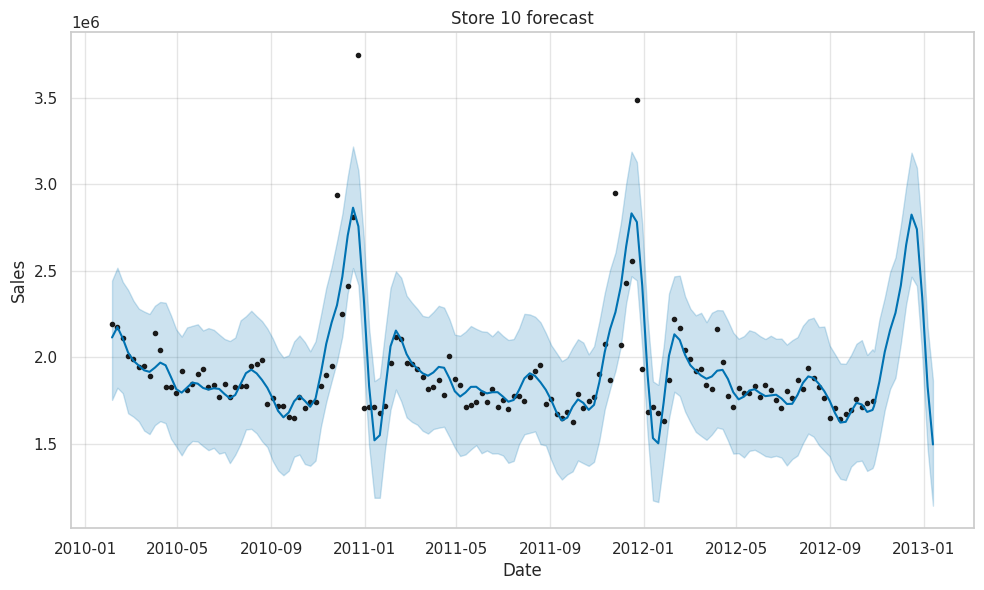

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/7sj1msib.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/81s0i0bw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23365', 'data', 'file=/tmp/tmphjc3d4bj/7sj1msib.json', 'init=/tmp/tmphjc3d4bj/81s0i0bw.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modeltxeqkhua/prophet_model-20240930140226.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


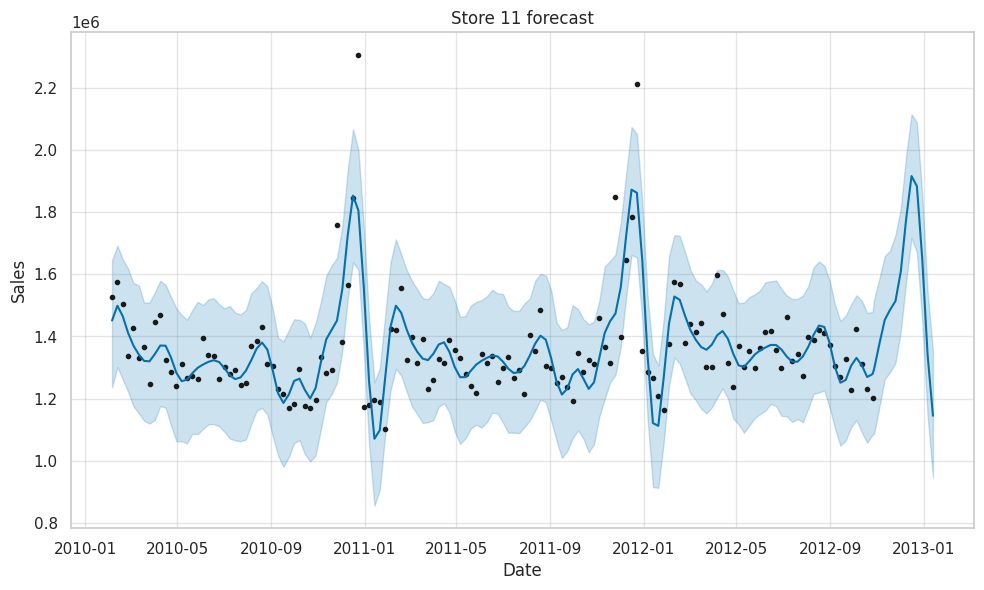

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/hc41_8z8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/n5_885sj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46729', 'data', 'file=/tmp/tmphjc3d4bj/hc41_8z8.json', 'init=/tmp/tmphjc3d4bj/n5_885sj.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelt1nsm_ep/prophet_model-20240930140227.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


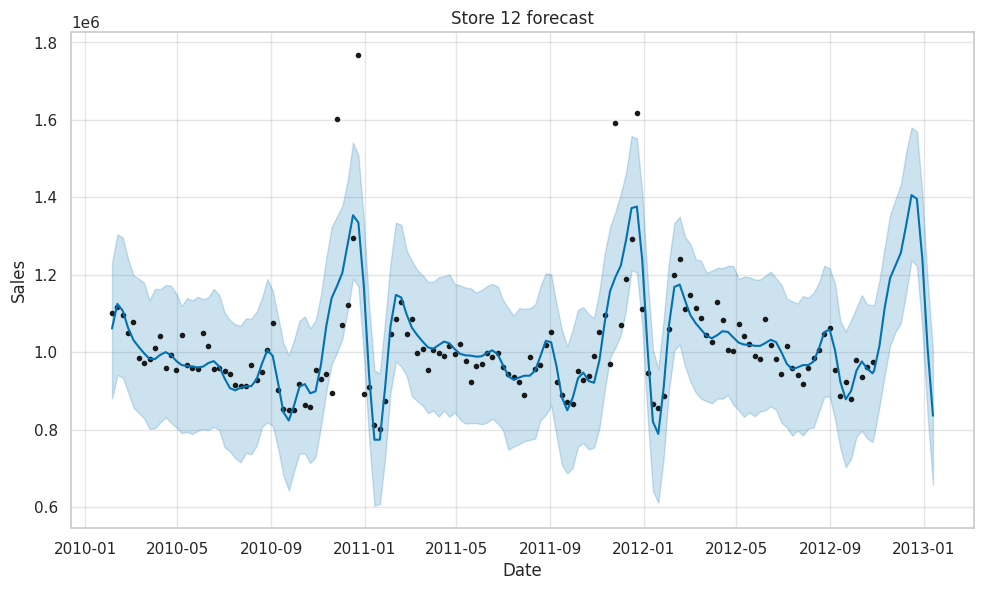

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/2ajh5zpt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/nm0per8q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85555', 'data', 'file=/tmp/tmphjc3d4bj/2ajh5zpt.json', 'init=/tmp/tmphjc3d4bj/nm0per8q.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model0cbwrsqd/prophet_model-20240930140227.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


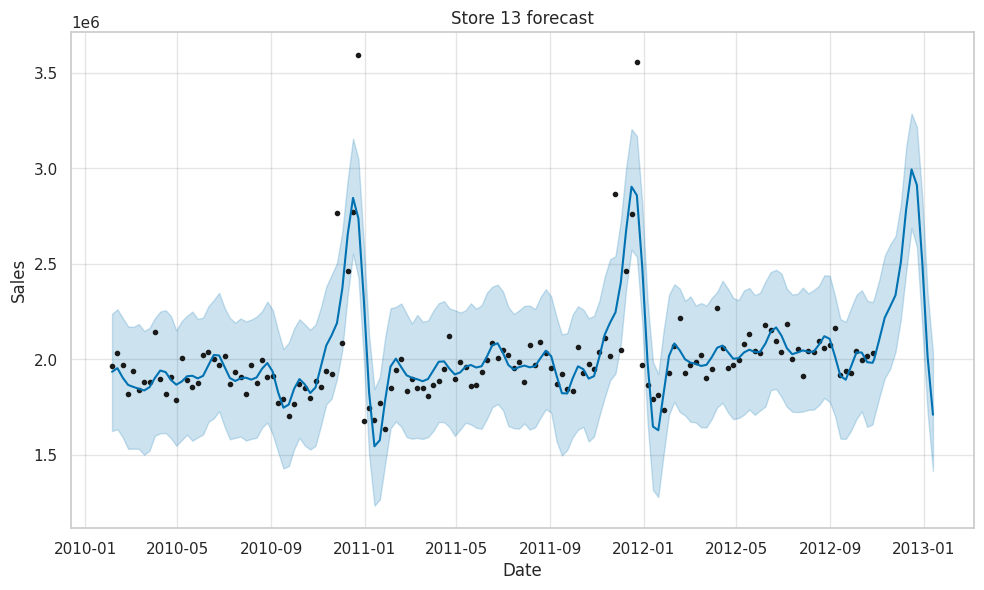

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/ku0fy5jl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/mlx9d1of.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43785', 'data', 'file=/tmp/tmphjc3d4bj/ku0fy5jl.json', 'init=/tmp/tmphjc3d4bj/mlx9d1of.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelx_xuqa_u/prophet_model-20240930140229.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


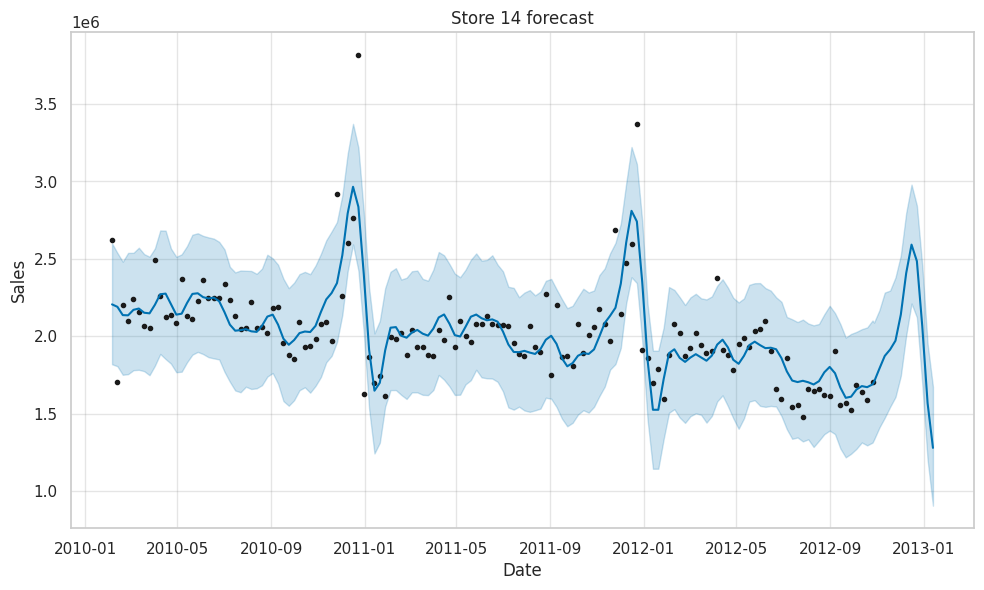

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/3xrsztzl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/pdwqo2ba.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89141', 'data', 'file=/tmp/tmphjc3d4bj/3xrsztzl.json', 'init=/tmp/tmphjc3d4bj/pdwqo2ba.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelroxr6sy8/prophet_model-20240930140230.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


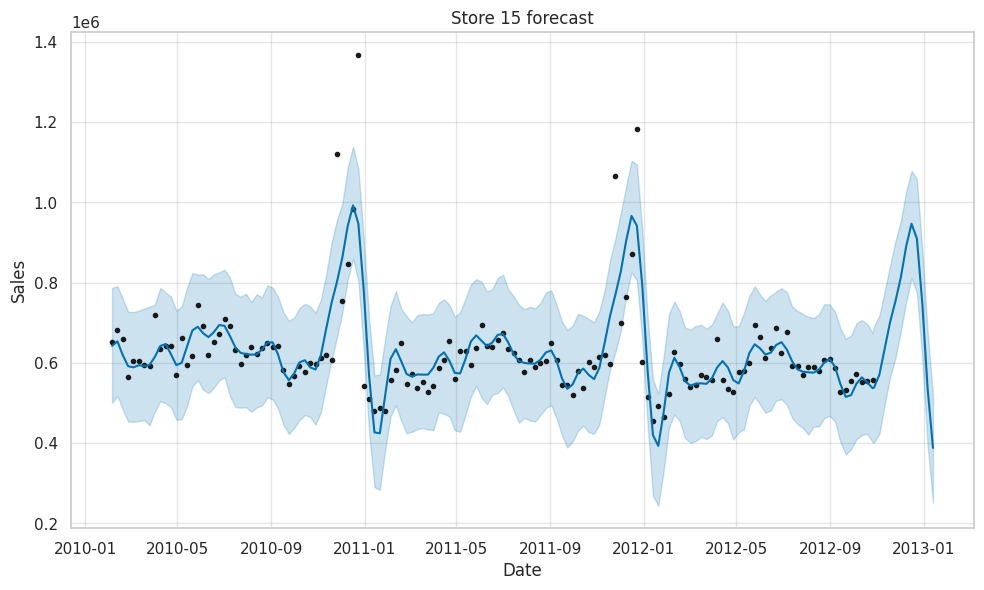

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/vqopv3qs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/ipnddvve.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19303', 'data', 'file=/tmp/tmphjc3d4bj/vqopv3qs.json', 'init=/tmp/tmphjc3d4bj/ipnddvve.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model781guuue/prophet_model-20240930140232.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


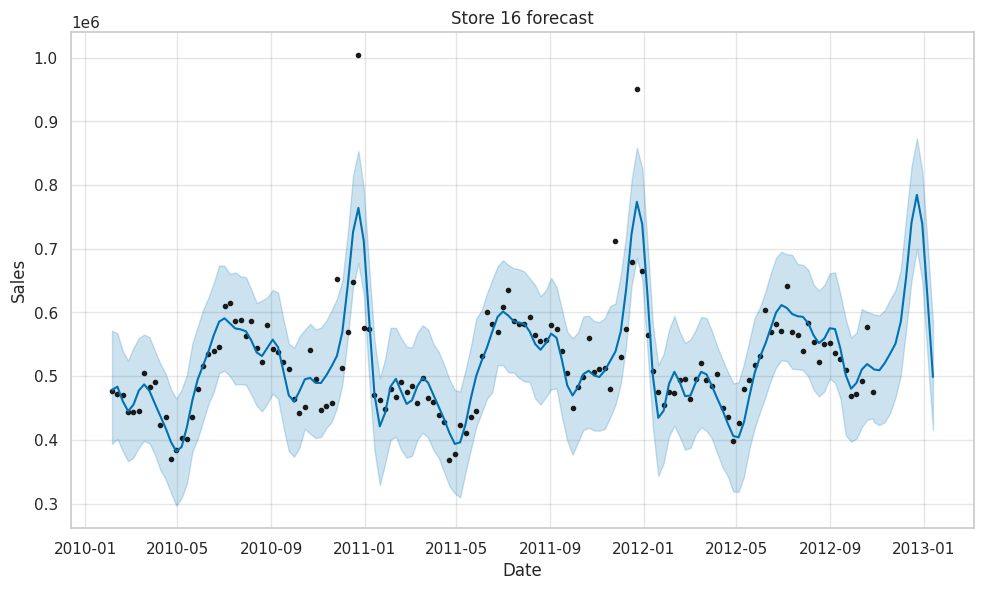

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/5equwhc7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/lahsill_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=710', 'data', 'file=/tmp/tmphjc3d4bj/5equwhc7.json', 'init=/tmp/tmphjc3d4bj/lahsill_.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelaccf50iv/prophet_model-20240930140233.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


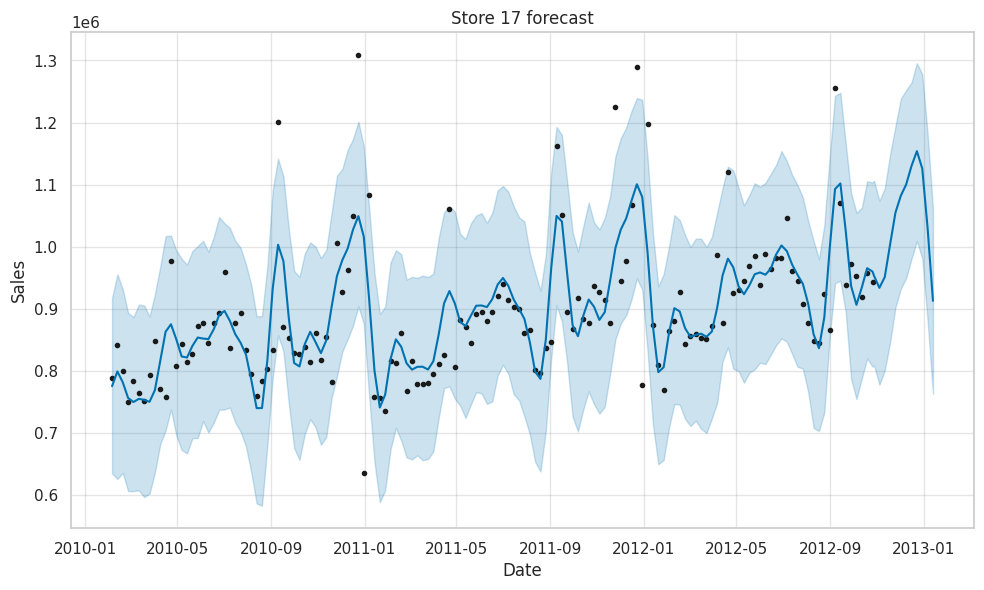

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/aii57tp0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/je5rsvhe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83561', 'data', 'file=/tmp/tmphjc3d4bj/aii57tp0.json', 'init=/tmp/tmphjc3d4bj/je5rsvhe.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelxy43zvik/prophet_model-20240930140234.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


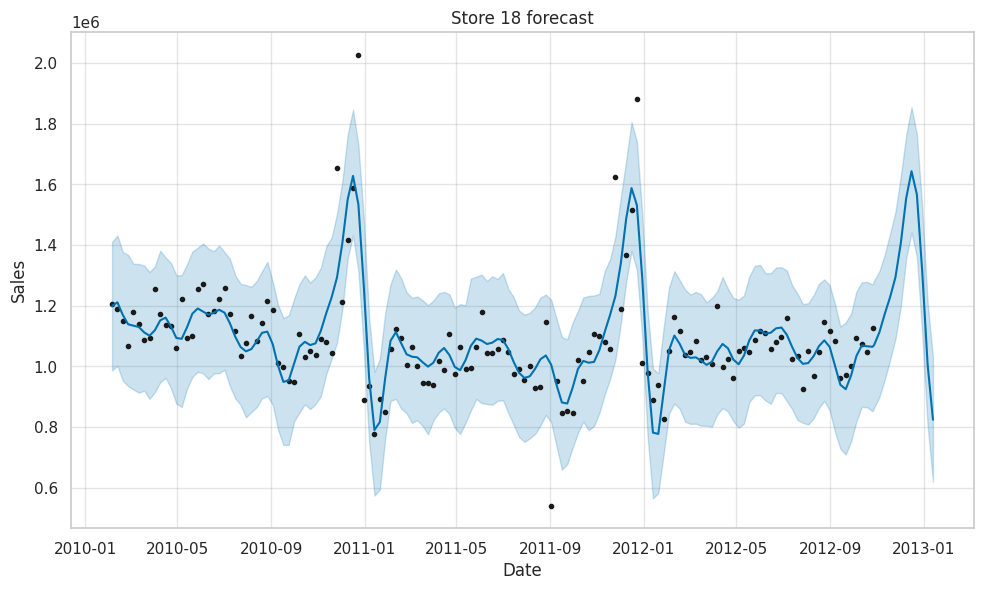

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/t0b57nv7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/g2j0f037.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33427', 'data', 'file=/tmp/tmphjc3d4bj/t0b57nv7.json', 'init=/tmp/tmphjc3d4bj/g2j0f037.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model7ngewbvz/prophet_model-20240930140235.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


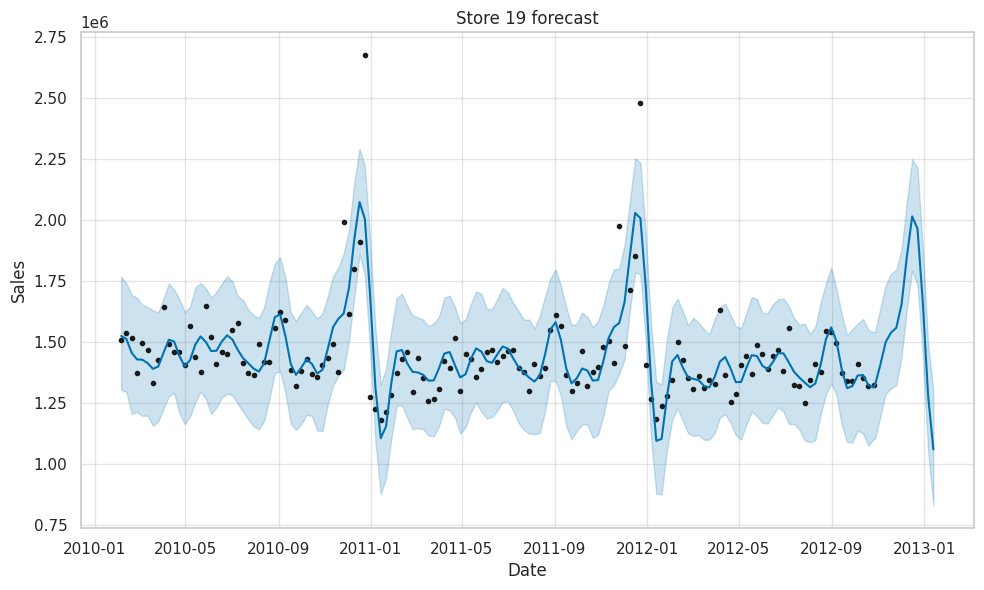

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/e3a7ubjk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/l59bpkdd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36810', 'data', 'file=/tmp/tmphjc3d4bj/e3a7ubjk.json', 'init=/tmp/tmphjc3d4bj/l59bpkdd.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modela__7kxe6/prophet_model-20240930140236.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


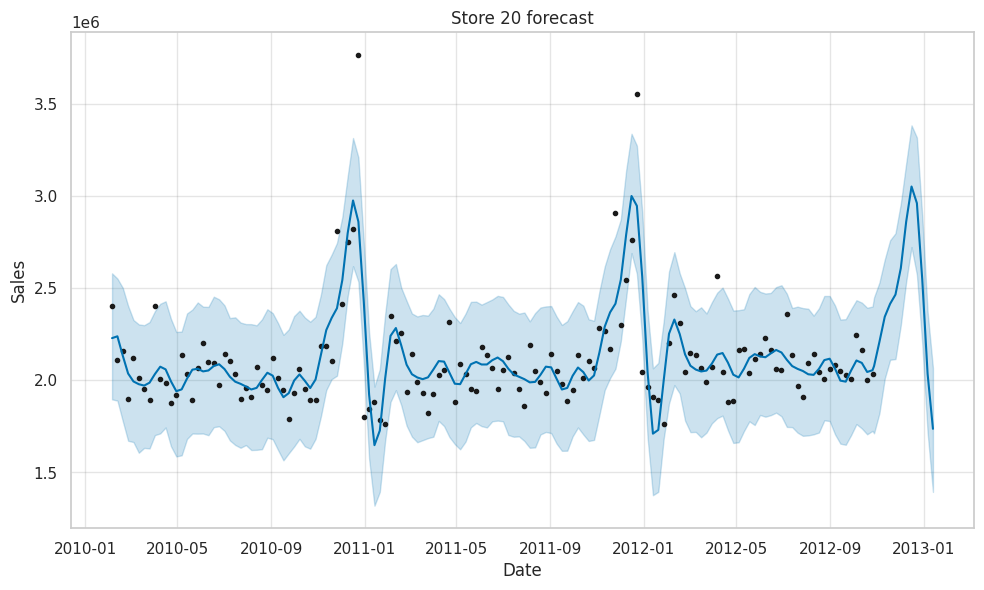

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/ii4__9eu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/je7beg8g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76105', 'data', 'file=/tmp/tmphjc3d4bj/ii4__9eu.json', 'init=/tmp/tmphjc3d4bj/je7beg8g.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modeltcyp29db/prophet_model-20240930140237.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


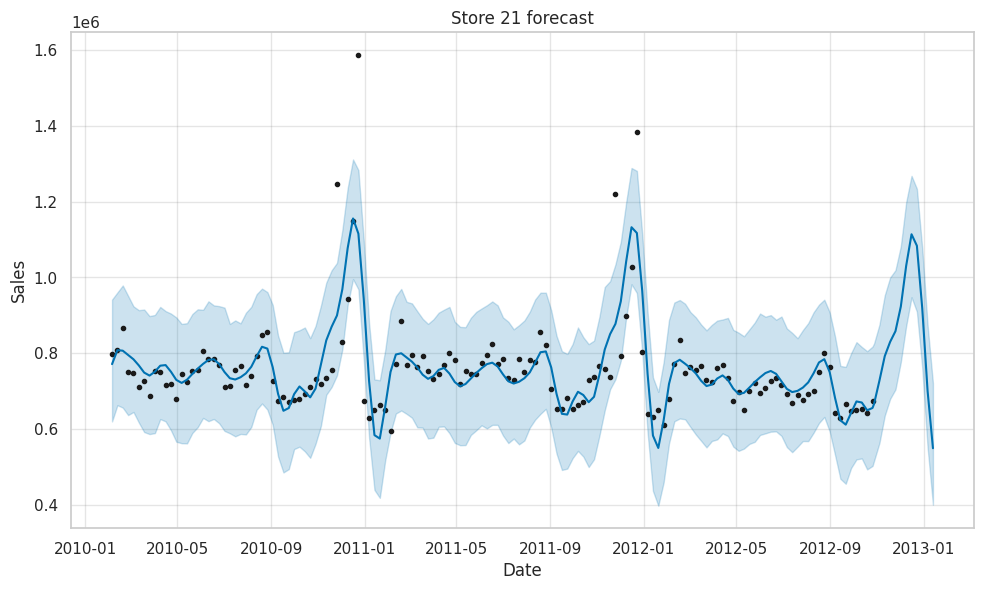

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/uk0l6gfz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/lflyyqjf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88643', 'data', 'file=/tmp/tmphjc3d4bj/uk0l6gfz.json', 'init=/tmp/tmphjc3d4bj/lflyyqjf.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelx5qzjpe7/prophet_model-20240930140238.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


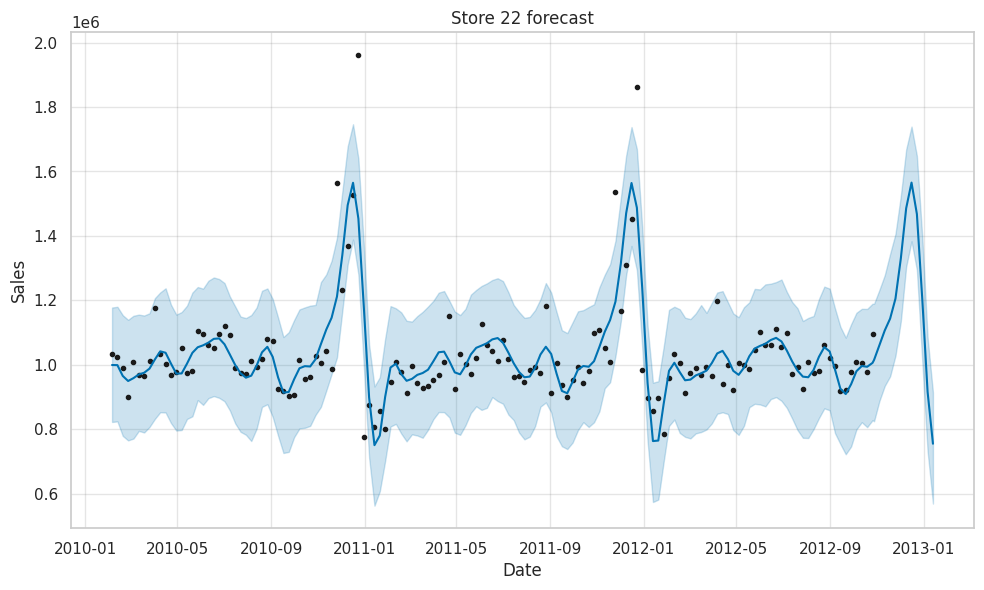

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/x6h11y_b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/urx8gmlf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75902', 'data', 'file=/tmp/tmphjc3d4bj/x6h11y_b.json', 'init=/tmp/tmphjc3d4bj/urx8gmlf.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model4hu20ywl/prophet_model-20240930140239.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


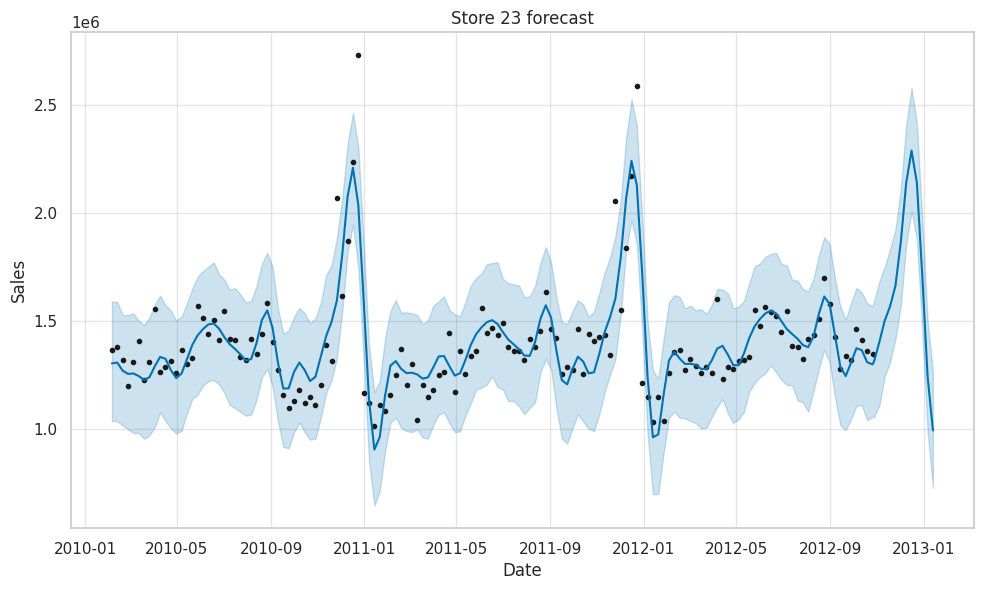

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/6_t5est4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/_blft85h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61140', 'data', 'file=/tmp/tmphjc3d4bj/6_t5est4.json', 'init=/tmp/tmphjc3d4bj/_blft85h.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model_z1c8o7h/prophet_model-20240930140240.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


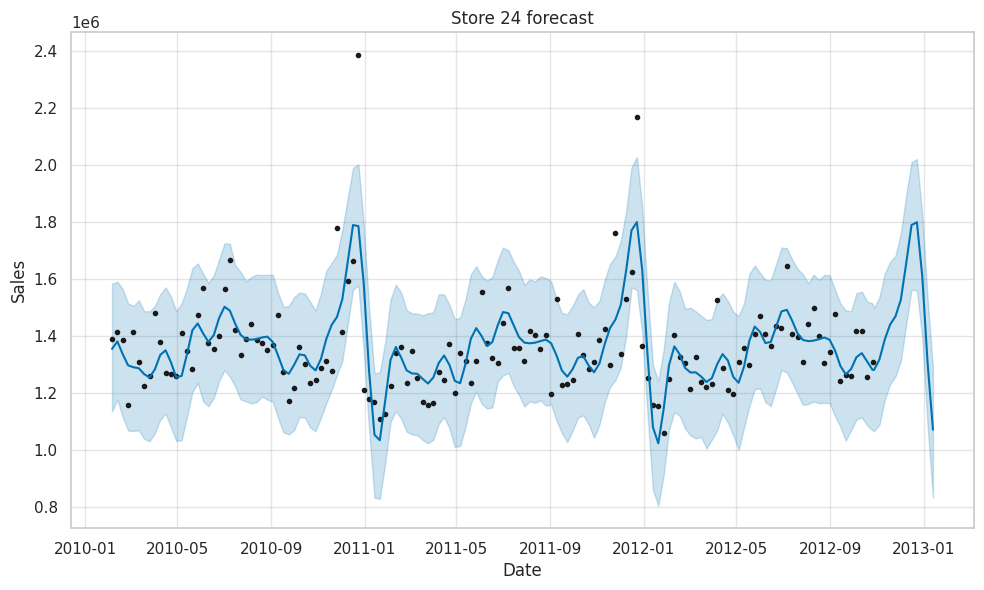

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/t4wyvh6g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/yv9b2j27.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78891', 'data', 'file=/tmp/tmphjc3d4bj/t4wyvh6g.json', 'init=/tmp/tmphjc3d4bj/yv9b2j27.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelb8f84_9o/prophet_model-20240930140242.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


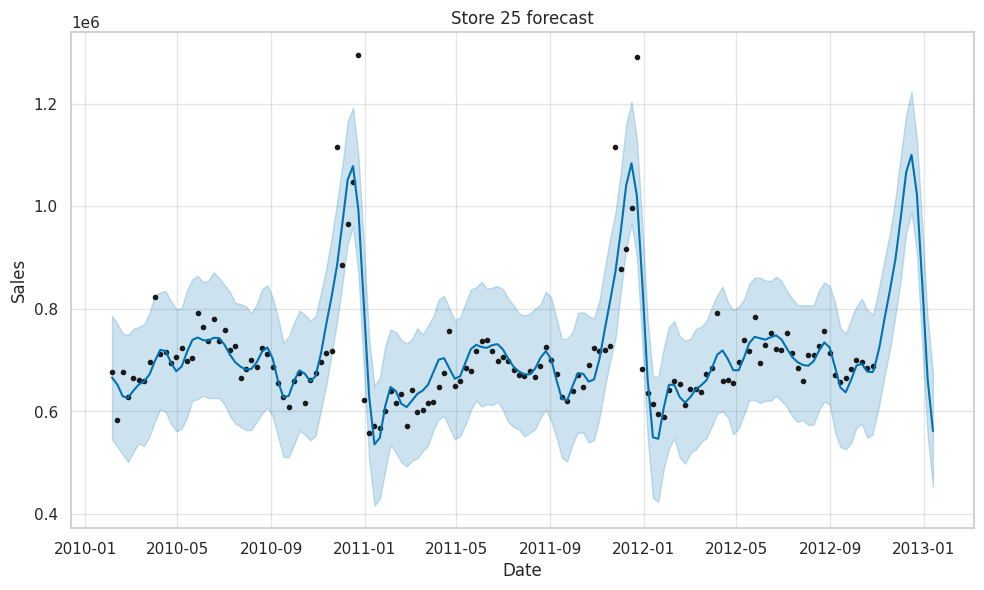

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/5nmvcal0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/ns8b7q6s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95967', 'data', 'file=/tmp/tmphjc3d4bj/5nmvcal0.json', 'init=/tmp/tmphjc3d4bj/ns8b7q6s.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modele9u49ffz/prophet_model-20240930140243.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


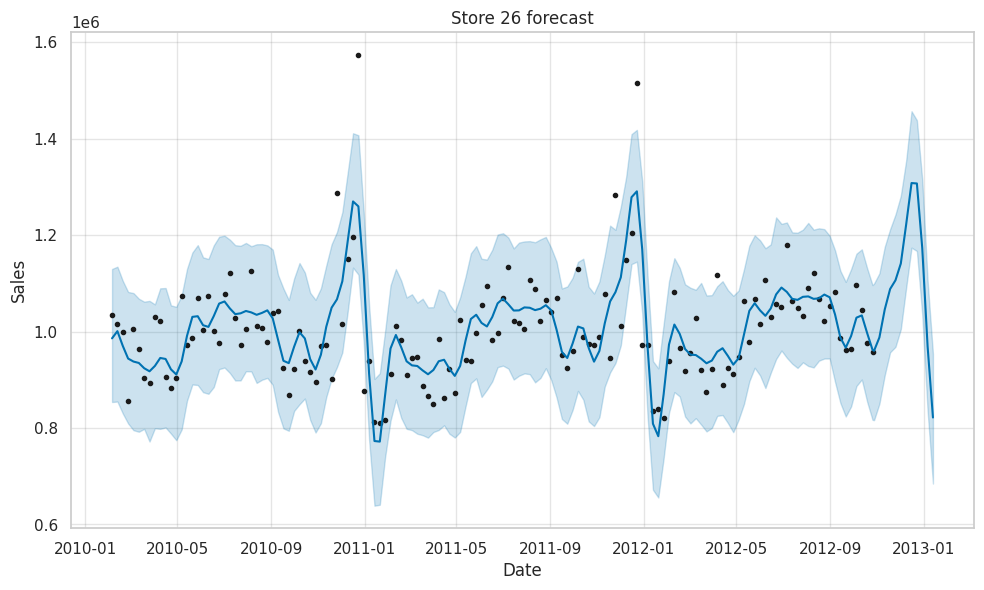

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/ia0ra6lm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/jm9fbxv_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39654', 'data', 'file=/tmp/tmphjc3d4bj/ia0ra6lm.json', 'init=/tmp/tmphjc3d4bj/jm9fbxv_.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelnmbcil6_/prophet_model-20240930140244.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


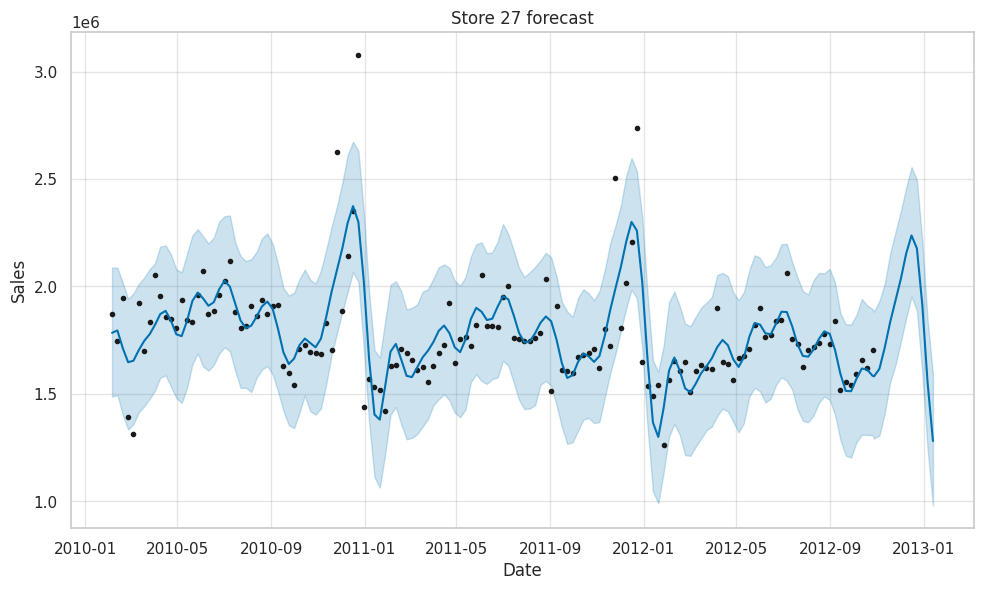

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/qfriowsf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/iu9nvynr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66239', 'data', 'file=/tmp/tmphjc3d4bj/qfriowsf.json', 'init=/tmp/tmphjc3d4bj/iu9nvynr.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model6ylzzlej/prophet_model-20240930140245.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


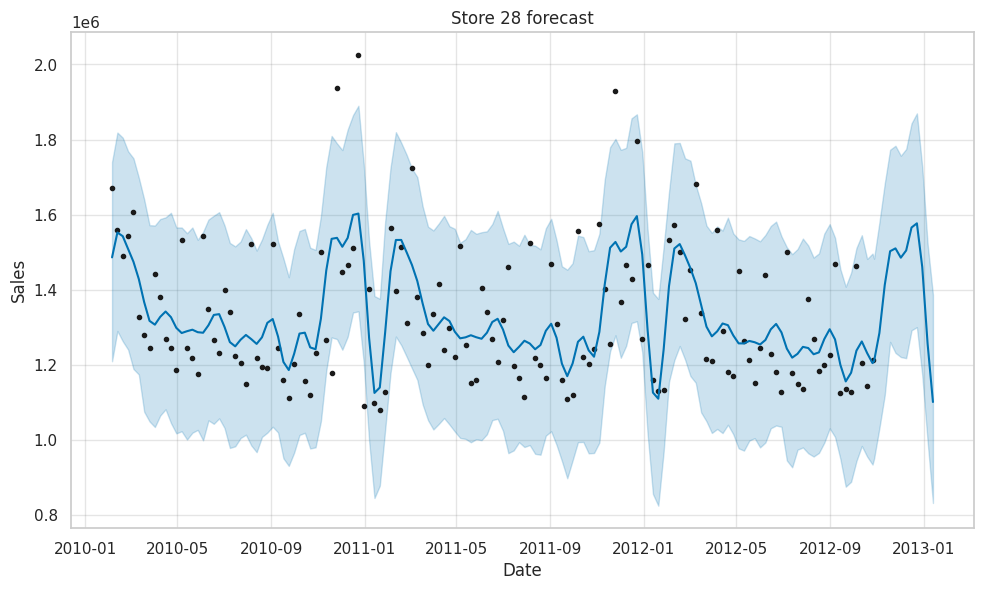

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/69li8juc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/n_wdeaky.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98081', 'data', 'file=/tmp/tmphjc3d4bj/69li8juc.json', 'init=/tmp/tmphjc3d4bj/n_wdeaky.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model9_phhrxt/prophet_model-20240930140247.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


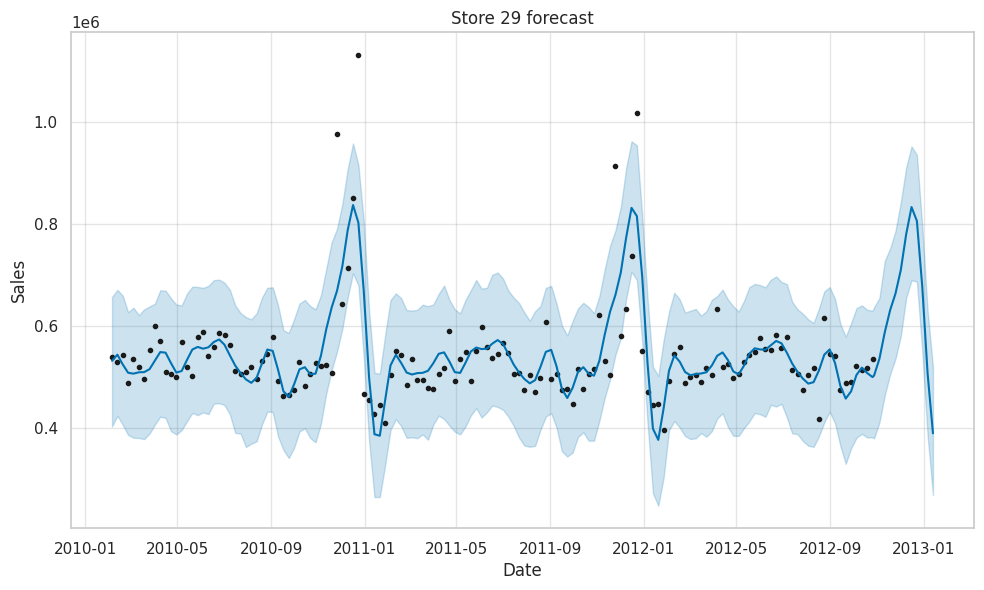

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/8g8q1i35.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/adsj4876.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43810', 'data', 'file=/tmp/tmphjc3d4bj/8g8q1i35.json', 'init=/tmp/tmphjc3d4bj/adsj4876.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modeltw6skmtl/prophet_model-20240930140248.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


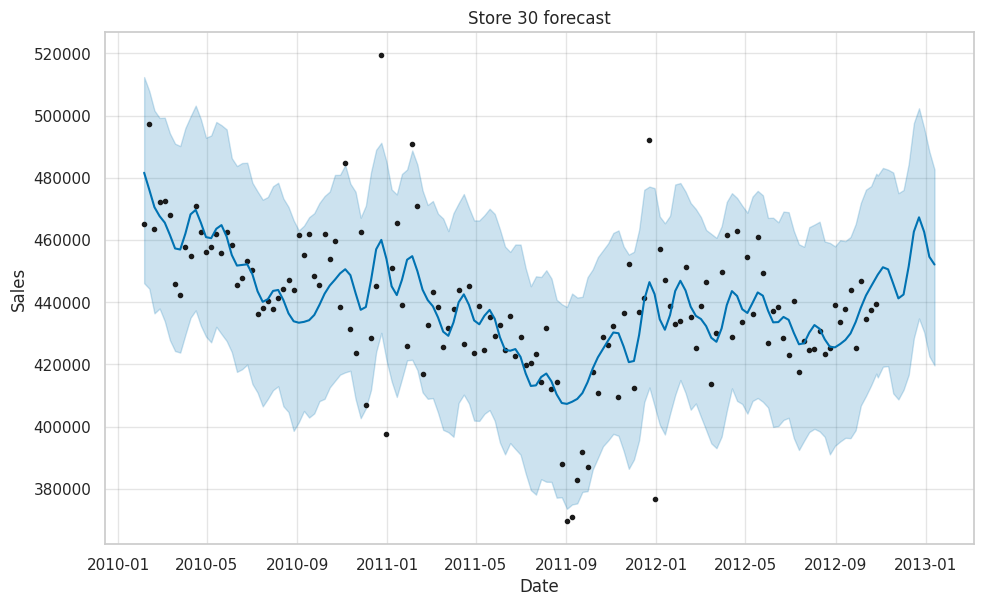

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/fk__ele5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/s3ffi_4b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85695', 'data', 'file=/tmp/tmphjc3d4bj/fk__ele5.json', 'init=/tmp/tmphjc3d4bj/s3ffi_4b.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelwtlzf0bd/prophet_model-20240930140249.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


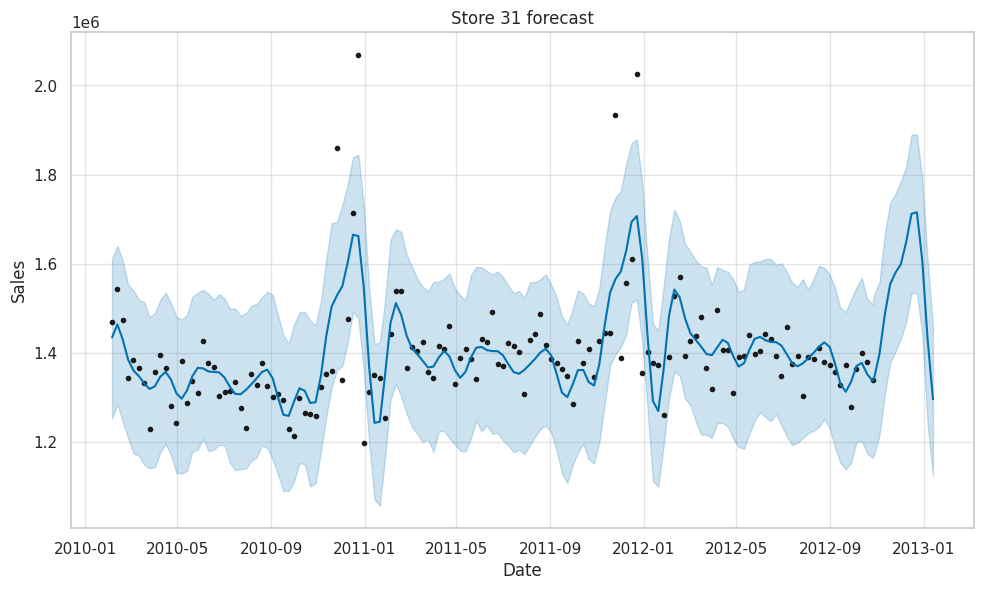

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/883b7jq4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/_j7frn00.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82503', 'data', 'file=/tmp/tmphjc3d4bj/883b7jq4.json', 'init=/tmp/tmphjc3d4bj/_j7frn00.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_models7gdp7cr/prophet_model-20240930140251.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


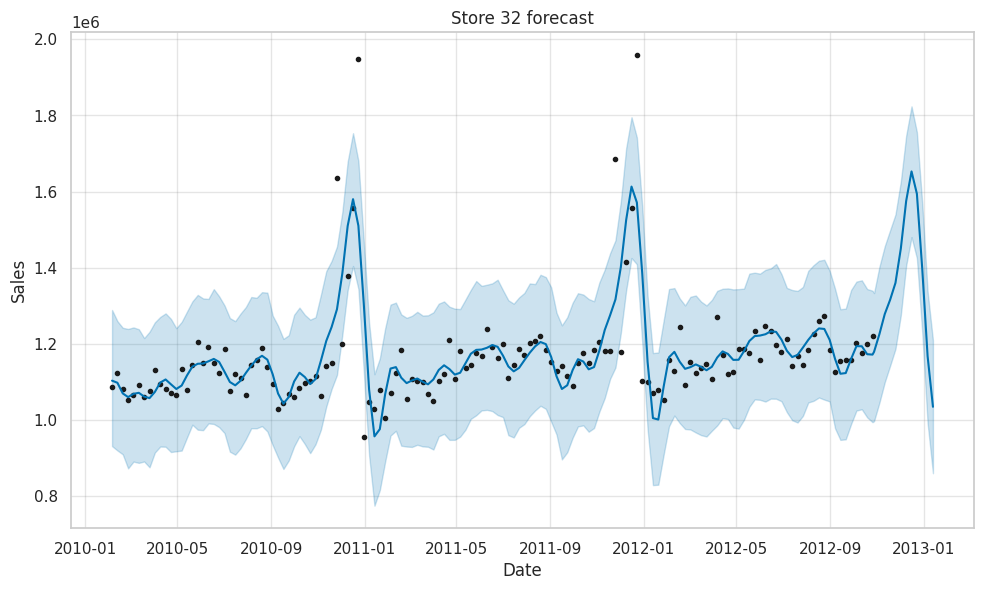

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/q1j0jamx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/lk8k583r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61343', 'data', 'file=/tmp/tmphjc3d4bj/q1j0jamx.json', 'init=/tmp/tmphjc3d4bj/lk8k583r.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelisa6kahi/prophet_model-20240930140252.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


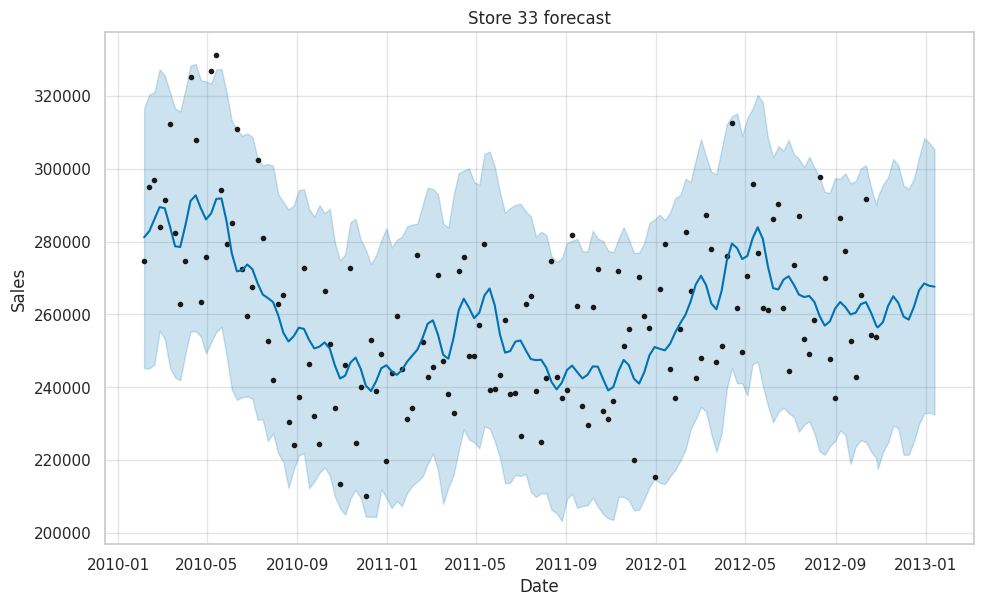

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/wfamsyia.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/cvb_v375.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46762', 'data', 'file=/tmp/tmphjc3d4bj/wfamsyia.json', 'init=/tmp/tmphjc3d4bj/cvb_v375.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_models6gyc6dh/prophet_model-20240930140253.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


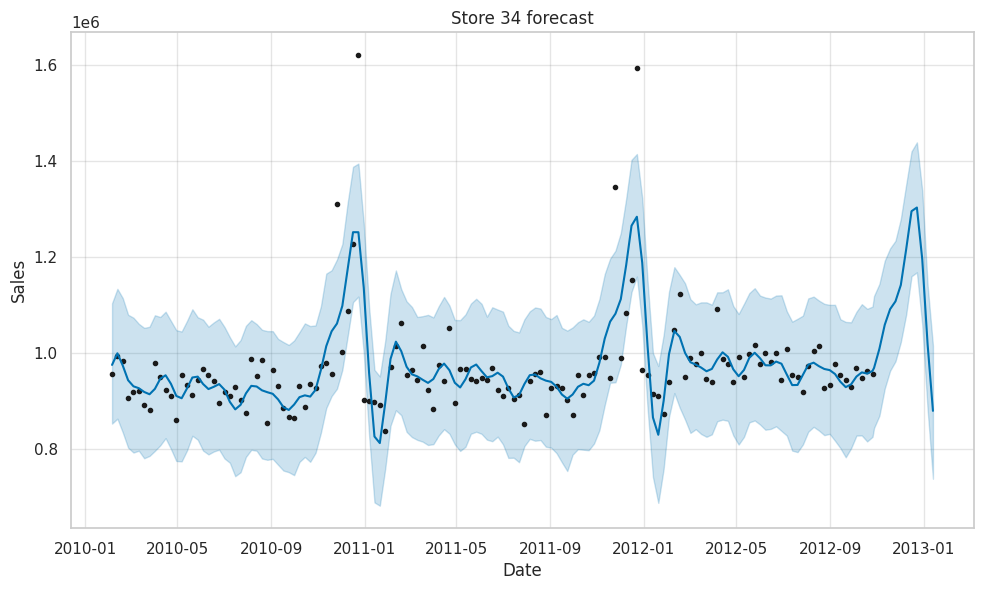

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/bubanc9h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/vd5t7942.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40862', 'data', 'file=/tmp/tmphjc3d4bj/bubanc9h.json', 'init=/tmp/tmphjc3d4bj/vd5t7942.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model4eir05iw/prophet_model-20240930140254.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


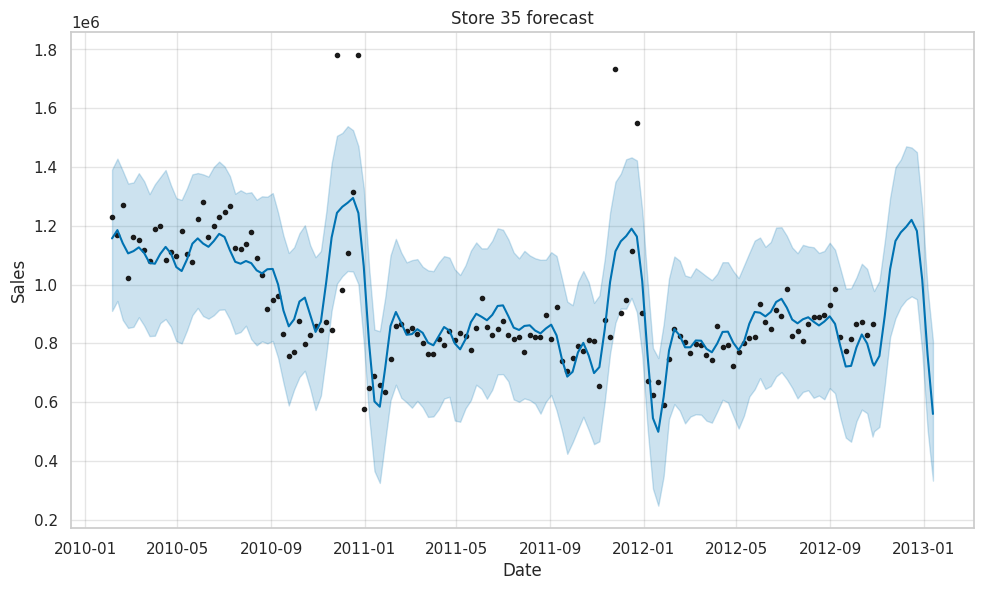

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/tvjiwy0c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/e_un04ed.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22448', 'data', 'file=/tmp/tmphjc3d4bj/tvjiwy0c.json', 'init=/tmp/tmphjc3d4bj/e_un04ed.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelacrfkdol/prophet_model-20240930140255.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


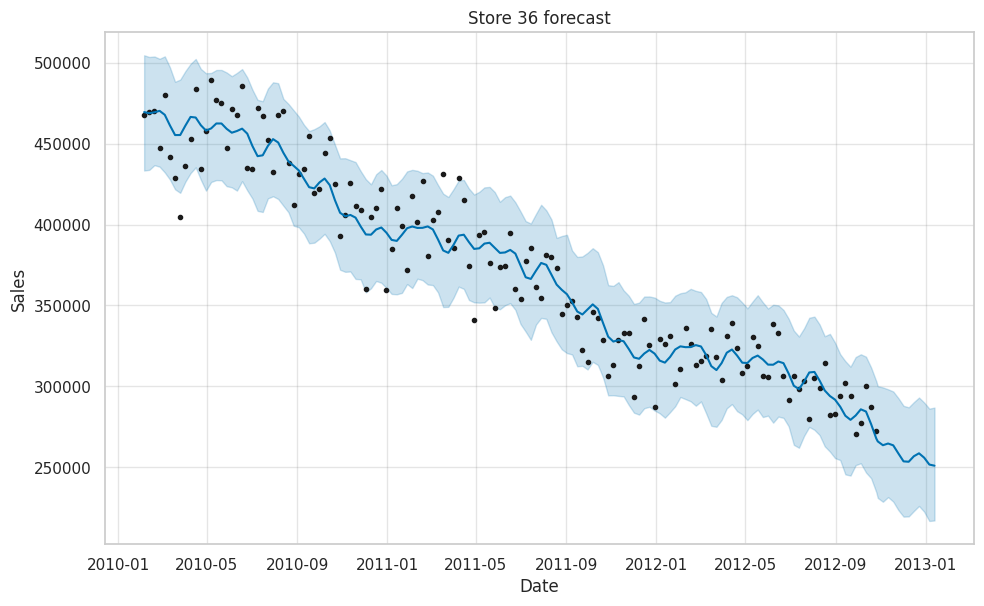

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/c365utie.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/bxehgznz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99337', 'data', 'file=/tmp/tmphjc3d4bj/c365utie.json', 'init=/tmp/tmphjc3d4bj/bxehgznz.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelk4rhqcxe/prophet_model-20240930140256.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


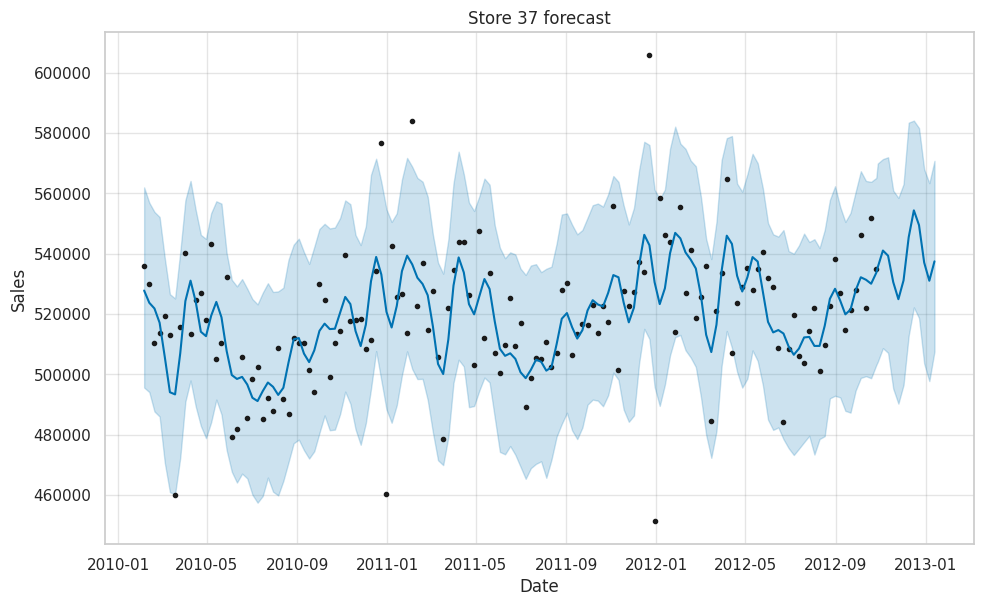

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/shbaei6t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/pvp_kmwj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18238', 'data', 'file=/tmp/tmphjc3d4bj/shbaei6t.json', 'init=/tmp/tmphjc3d4bj/pvp_kmwj.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelbqe9o6g1/prophet_model-20240930140257.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


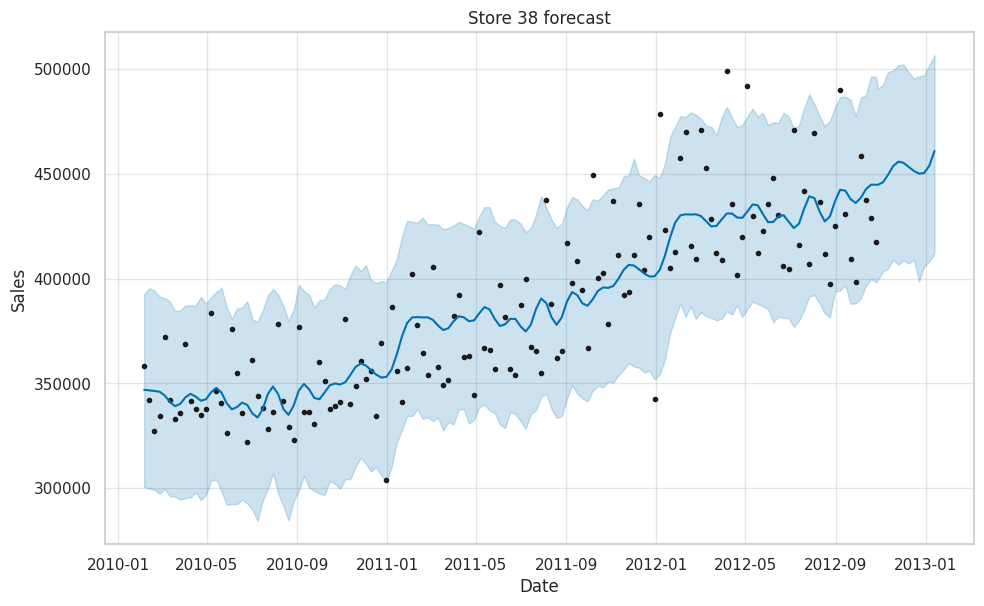

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/zxopynzk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/tv4ucg9h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17519', 'data', 'file=/tmp/tmphjc3d4bj/zxopynzk.json', 'init=/tmp/tmphjc3d4bj/tv4ucg9h.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelzqso869r/prophet_model-20240930140259.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


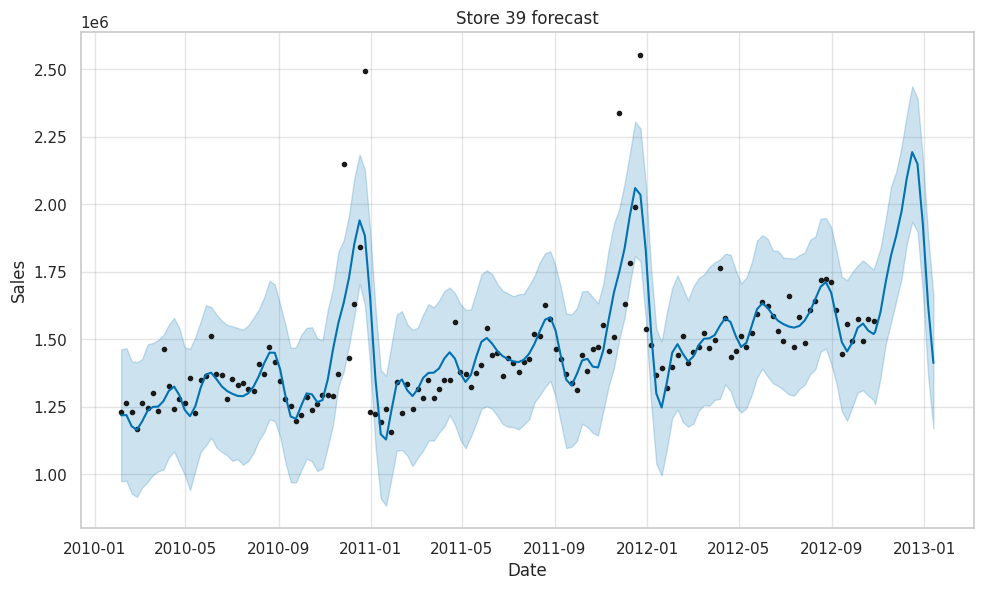

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/ce4xaopo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/5ua83vey.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62640', 'data', 'file=/tmp/tmphjc3d4bj/ce4xaopo.json', 'init=/tmp/tmphjc3d4bj/5ua83vey.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modelqnjrp2_2/prophet_model-20240930140300.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


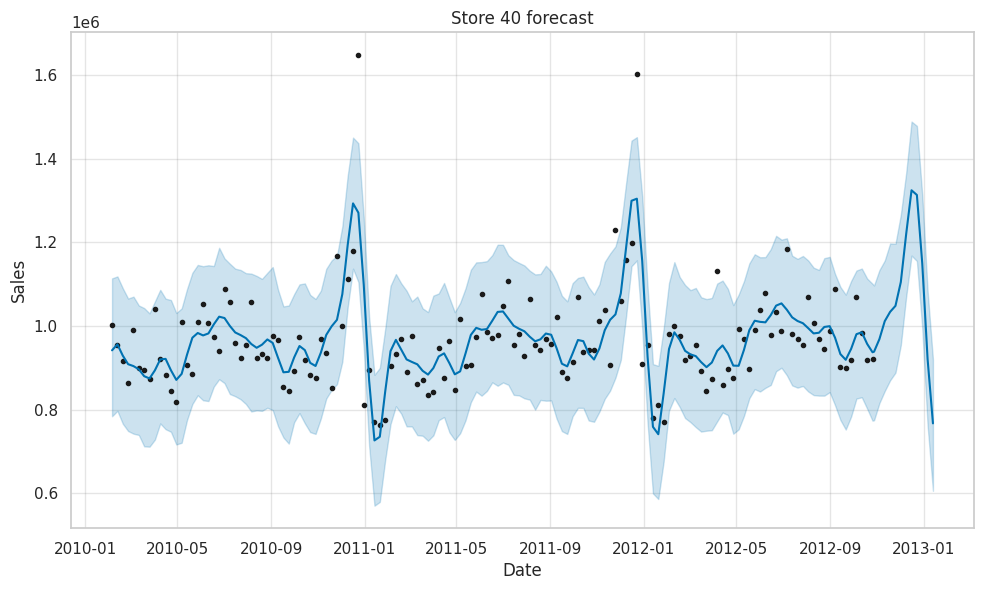

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/mca2oiiu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/wvp85lmn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33073', 'data', 'file=/tmp/tmphjc3d4bj/mca2oiiu.json', 'init=/tmp/tmphjc3d4bj/wvp85lmn.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model91g7t9ja/prophet_model-20240930140302.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


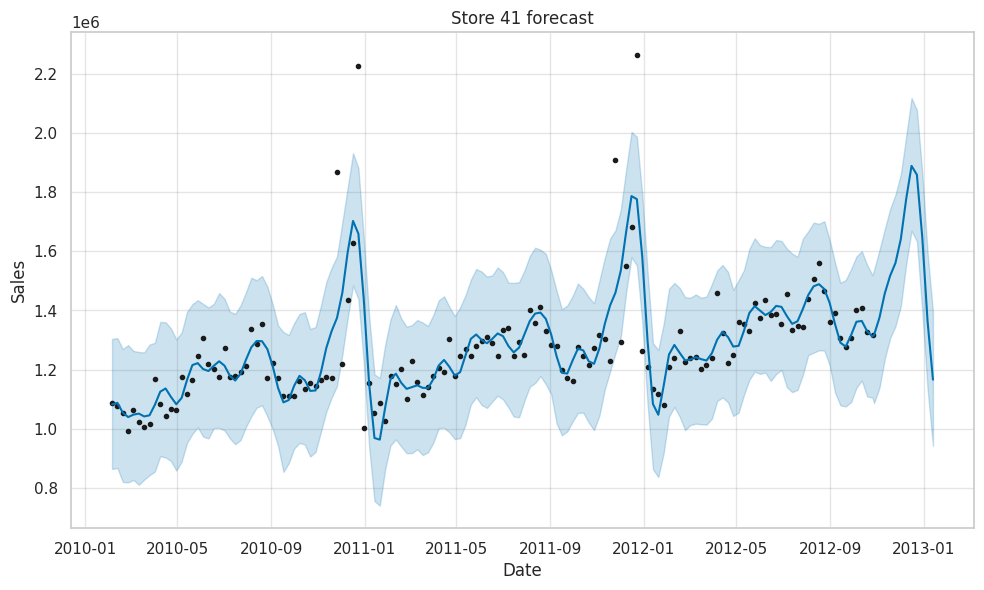

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/xooefz57.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/ejkd1tac.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41537', 'data', 'file=/tmp/tmphjc3d4bj/xooefz57.json', 'init=/tmp/tmphjc3d4bj/ejkd1tac.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modeliu9eex1l/prophet_model-20240930140303.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


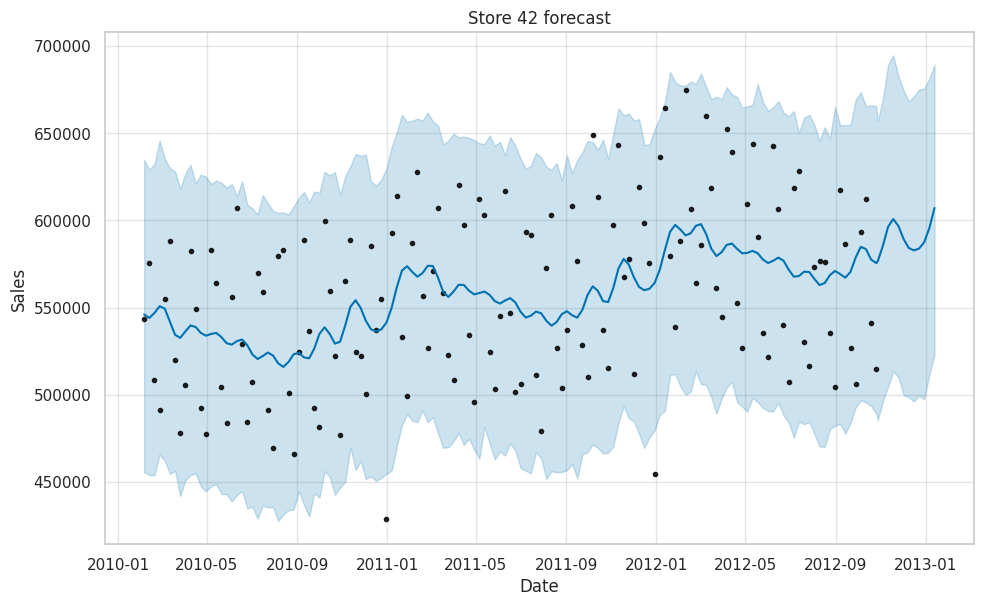

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/6autxvjs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/k9zqmo69.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80586', 'data', 'file=/tmp/tmphjc3d4bj/6autxvjs.json', 'init=/tmp/tmphjc3d4bj/k9zqmo69.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_modeleug0rtj5/prophet_model-20240930140305.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


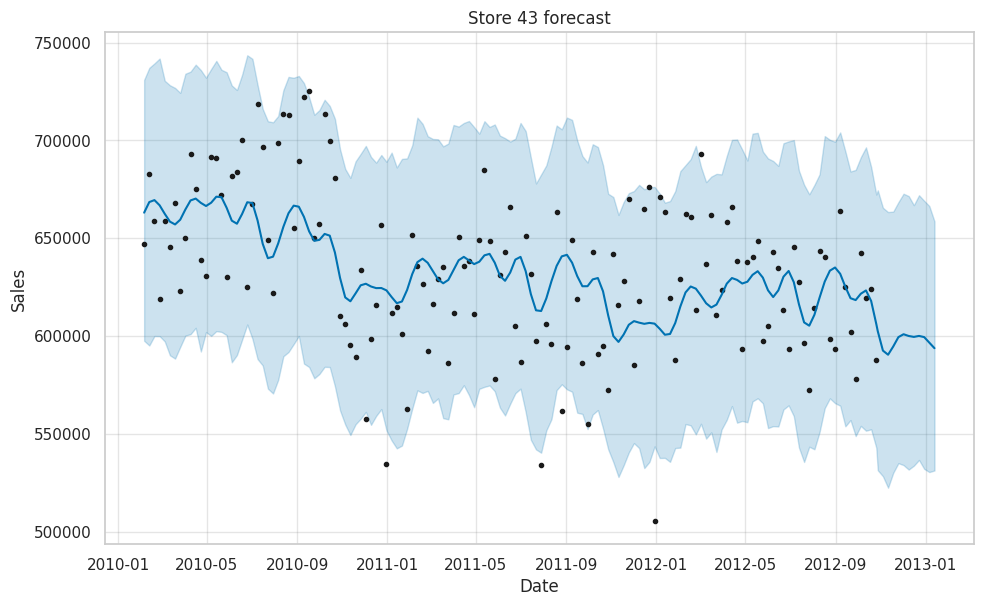

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/vymihr36.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/dxeca5oy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86015', 'data', 'file=/tmp/tmphjc3d4bj/vymihr36.json', 'init=/tmp/tmphjc3d4bj/dxeca5oy.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model337ogydy/prophet_model-20240930140306.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


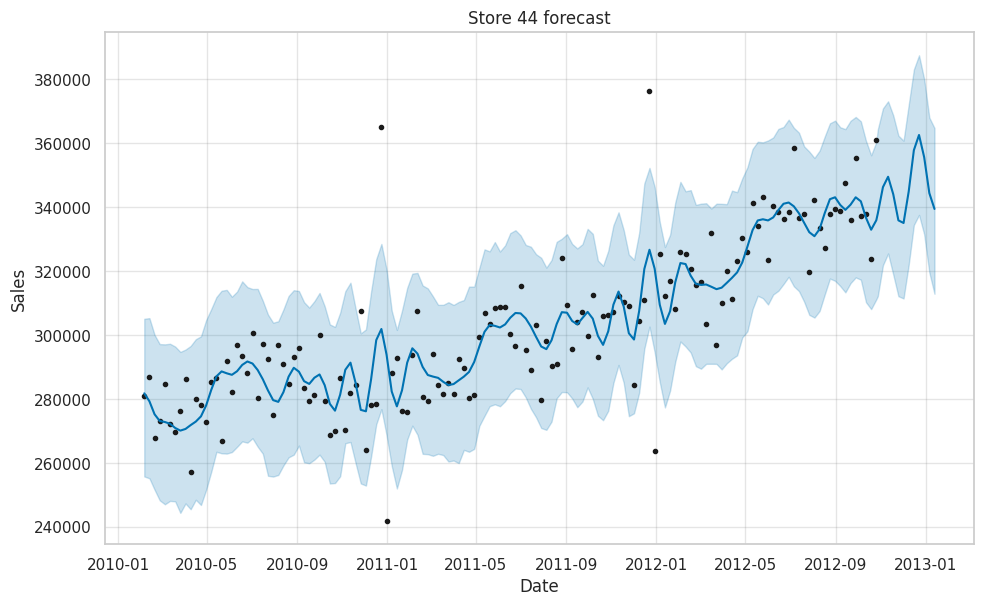

DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/5xqvj738.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmphjc3d4bj/nqxqtg5o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48047', 'data', 'file=/tmp/tmphjc3d4bj/5xqvj738.json', 'init=/tmp/tmphjc3d4bj/nqxqtg5o.json', 'output', 'file=/tmp/tmphjc3d4bj/prophet_model4v8_ixrw/prophet_model-20240930140307.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


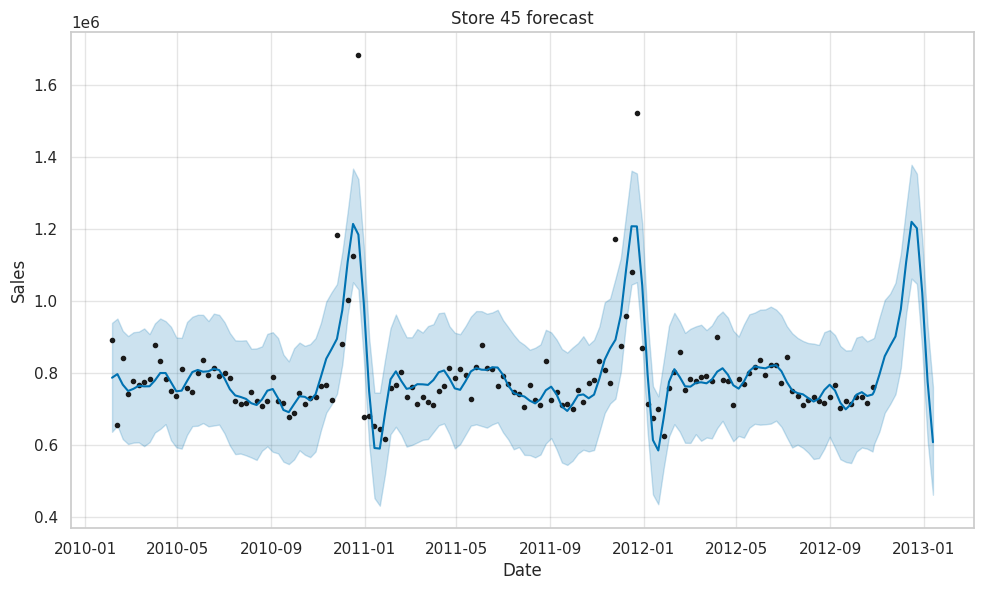

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, module="prophet.plot")

for i in list(weekly_sales['Store'].unique()):
  store_sales = weekly_sales[weekly_sales['Store']==i]
  store_sales = store_sales[['Date','Weekly_Sales']]
  store_sales.columns = ['ds','y']
  # store_sales['ds'] = pd.to_datetime(store1_sales['ds'])
  model = Prophet(interval_width=0.95)
  model.fit(store_sales)
  future_weeks = model.make_future_dataframe(periods=12,freq='W')
  forecast = model.predict(future_weeks)
  forecast[['yhat','yhat_lower','yhat_upper']] = forecast[['yhat','yhat_lower','yhat_upper']].astype(int)
  sales_forecast = model.plot(forecast)
  plt.title('Store '+str(i)+' forecast')
  plt.xlabel('Date')
  plt.ylabel('Sales')
  plt.show()


**Conclusion**

*   There is seasonal component in sales through holiday date, so the management have to taking into account the seasonal to stocking, merchandising, marketing etc. decision.
*   Although Thanksgiving Holiday in November contributed more sales than other holiday, it seems that December has higher MoM growth sales happening before Christmas.

*   Store 20 indeed has a high sales volume for 3 years. However, it's growth has been dominated by holiday date.



